## Setup for EDA and time series 

In [52]:
#pip install xgboost

In [53]:
# Importing required libraries
import requests
import pandas as pd
import csv
import numpy as np
from itertools import permutations

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# this for time series
#import statsmodels.formula.api as smf
#from statsmodels.tsa.seasonal import seasonal_decompose
#from scipy.ndimage import gaussian_filter
#from calendar import monthrange
#from calendar import month_name
#from sklearn.metrics import mean_squared_error
#from math import sqrt
#from statsmodels.tsa.stattools import adfuller,kpss
#from statsmodels.tsa.seasonal import seasonal_decompose
#from statsmodels.tsa.arima_model import ARIMA
#from statsmodels.graphics.tsaplots import plot_pacf
#from pmdarima.arima import auto_arima
#import statsmodels.graphics.tsaplots as tsaplot
#from statsmodels.tsa.holtwinters import Holt, ExponentialSmoothing, SimpleExpSmoothing

#import tensorflow as tf
#from keras.models import Sequential
#import matplotlib.dates as mdates   #from keras.layers import LSTM, Dense


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
#from tensorflow.keras.regularizers import l1, l2
from tensorflow.keras.regularizers import L1L2
import time
import matplotlib.dates as mdates   

#from tensorflow.keras.wrappers.scikit_learn import KerasRegressor  # Correct import
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit




In [54]:
#from statsmodels.tsa.stattools import adfuller
#!pip install pmdarima --quiet
#import pmdarima as pm


### Columns
|Name                | Description                                                                   | Type     |Energy Source
|---------------------|-------------------------------------------------------------------------------|----------|----------|
| Area       |     Whole Germany                          |object   |     |
| Mtu     |                                  | object  |    |
| Biomass_mwh         |     Biomass                 | float64 |Renewable |
| Fossil_brown_coal_mwh      | Fossil brown coal              | float64 |Fossil  Fuels|
| Fossil_coal_derived_gas_mwh    |    Fossil coal derived gas       | float64 |Fossil  Fuels |
| Fossil_gas_mwh      |      Fossil gas                | float64 |Fossil  Fuels|
| Fossil_hard_coal_mwh     |      Fossil hard coal           | float64 |Fossil  Fuels|
| Fossil_oil_mwh      |       Fossil oil               | float64 |Fossil  Fuels|
| Fossil_oil_shale_mwh     |    Fossil oil shale             | float64 |Fossil  Fuels   |
| Fossil_peat_mwh     |   Fossil peat                    | float64 |Fossil  Fuels |
| Geothermal_mwh    |        Geothermal                | float64 |Renewable|
| Hydro_pumped_storage_aggregated_mwh  | Hydro pumped storage (generation)    | float64 |    |
| Hydro_pumped_storage_consumption_mwh   | Hydro pumped storage (consumption)| float64 |    |
| Hydro_run_of_river_and_poundage_mwh   | Hydro run of river and poundage   | float64 |Renewable|
| Hydro_water_reservoir_mwh  |    Hydro water reservoir             | float64 |Renewable|
| Marine_mwh     |   Marine                        | float64 |Renewable|
| Nuclear_mwh  |       Nuclear                       | float64 |Nuclear   |
| Other_mwh     |       Other                     | float64 |    |
| Other_renewable_mwh     |    Other renewable              | float64 |Renewable|
| Solar_mwh     |      Solar                      | float64 |Renewable |
| Waste_mwh    |     Waste                        | float64 |Renewable  |
| Wind_offshore_mwh    |  Wind offshore                   | float6  |Renewable |
| Wind_onshore_mwh   |      Wind onshore                 | float64 |Renewable  |
| Date                  |   Date(yyyy-mm-dd)                 | int64 |    |
| Hour        |Timesatmp of 'UTC+1' timezone                          | int64 |    |
| Total_energy_generation_mwh   | Total energy generation of Germany           | float64 |    |
| Total_other_renewable_mwh   | Total renewable energy generation (excluding solar)  of Germany           | float64 |    |


#### Dataframes details 
- res_df $\rightarrow$  Import  the original  data
- data_df_mwh  $\rightarrow$   Data in mwh units (This copy of original data)
- data_df_gwh  $\rightarrow$  Data in gwh units 
- data_df  $\rightarrow$  Contain the final preprocessing data in mwh/gwh units 
- df_dt is final dataframe for XG Boost regressor (only contain the 'datatime' and  'target' features)

### Units of Solar Energy production
- One kilowatt (kW) =  1,000 watts, 
- One megawatt (MW) =  1,000 kilowatts, 
- One gigawatt (GW) =  1,000 megawatts, 
- One terawatt (TW) =  1,000 gigawatts.

In [55]:
# Target columns   total_energy_generation_mwh, solar_mwh

In [56]:
# Import data
#This is data file of 20.07.2023
#res_df = pd.read_csv('data/result_20150101-20230716_cond2.csv')
# This is updated data file of 24.07.2023
df_m = pd.read_csv('data/Result_20150101-20230716_monthly.csv')
df_m.head()

,dt_date_hour,biomass_mwh,fossil_brown_coal_mwh,fossil_coal_derived_gas_mwh,fossil_gas_mwh,fossil_hard_coal_mwh,fossil_oil_mwh,fossil_oil_shale_mwh,fossil_peat_mwh,geothermal_mwh,...,day_ahead_auction_volume_weighted_eur_per_mwh,intraday_continuous_volume_weighted_eur_per_mwh,intraday_continuous_30min_volume_weighted_eur_per_mwh,intraday_continuous_15min_volume_weighted_eur_per_mwh,intraday_auction_15_minutes_call_eur_per_mwh,co2_emission_allowances_auction_eur_per_tco2,gas_ncg_eur_per_tco2,mean_air_temperature_de_c,mean_sunshine_duration_de_minute,mean_precipitation_de_mm
0,2015-01-31 00:00:00+01:00,2963450.25,11800178.50,0.0,1405692.50,6387684.50,130717.25,0.0,0.0,9665.00,...,30.46,31.54,NaN,31.50,28.85,6.80,NaN,2.19,35.3,85.4
1,2015-02-28 00:00:00+01:00,2692398.25,11249758.00,0.0,1615355.25,7886900.00,145943.00,0.0,0.0,9820.75,...,36.66,37.91,NaN,37.12,36.84,7.13,NaN,0.72,88.0,22.3
2,2015-03-31 00:00:00+01:00,2935810.25,12187410.00,25511.0,1361677.50,7322739.75,152918.25,0.0,0.0,7920.75,...,30.67,33.00,NaN,32.97,31.26,6.67,NaN,5.18,139.1,55.5
3,2015-04-30 00:00:00+01:00,2845630.00,10203658.25,0.0,849546.00,5998567.50,145577.25,0.0,0.0,9943.00,...,29.04,28.64,NaN,29.27,29.51,6.98,NaN,8.42,224.5,41.4
4,2015-05-31 00:00:00+01:00,2918058.50,8934112.50,0.0,866311.50,4289877.75,143307.25,0.0,0.0,12335.00,...,25.32,26.34,NaN,25.38,24.85,7.34,NaN,12.34,187.0,51.7


In [57]:
df_m.shape

(102, 45)

In [58]:
print('df_ms_hape=',df_m.shape)

df_ms_hape= (102, 45)


In [59]:
df_m.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 45 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   dt_date_hour                                           102 non-null    object 
 1   biomass_mwh                                            102 non-null    float64
 2   fossil_brown_coal_mwh                                  102 non-null    float64
 3   fossil_coal_derived_gas_mwh                            102 non-null    float64
 4   fossil_gas_mwh                                         102 non-null    float64
 5   fossil_hard_coal_mwh                                   102 non-null    float64
 6   fossil_oil_mwh                                         102 non-null    float64
 7   fossil_oil_shale_mwh                                   102 non-null    float64
 8   fossil_peat_mwh                                   

In [60]:
# Cerate a working data frame
#importing data in original units 
data_dfm_mwh = df_m.copy()
#data_df_mwh.head()

#### Here we add new columns to data frame 

In [61]:
data_dfm_mwh.columns

Index(['dt_date_hour', 'biomass_mwh', 'fossil_brown_coal_mwh',
       'fossil_coal_derived_gas_mwh', 'fossil_gas_mwh', 'fossil_hard_coal_mwh',
       'fossil_oil_mwh', 'fossil_oil_shale_mwh', 'fossil_peat_mwh',
       'geothermal_mwh', 'hydro_pumped_storage_aggregated_mwh',
       'hydro_pumped_storage_consumption_mwh',
       'hydro_run_of_river_and_poundage_mwh', 'hydro_water_reservoir_mwh',
       'marine_mwh', 'nuclear_mwh', 'other_mwh', 'other_renewable_mwh',
       'solar_mwh', 'waste_mwh', 'wind_offshore_mwh', 'wind_onshore_mwh',
       'total_energy_generation_mwh', 'solar_gwh',
       'total_energy_generation_gwh', 'dt_year', 'dt_month', 'dt_monthname',
       'dt_date', 'solar_twh', 'biomass_gw', 'wind_offshore_gw',
       'wind_onshore_gw', 'solar_gw', 'spot_market_price_eur_per_mwh',
       'day_ahead_auction_volume_weighted_eur_per_mwh',
       'intraday_continuous_volume_weighted_eur_per_mwh',
       'intraday_continuous_30min_volume_weighted_eur_per_mwh',
       'intrada

In [62]:

#data_dfm_mwh['diff_total_energy_and_solar_mwh'] =  data_dfm_mwh['total_energy_generation_mwh'] - data_dfm_mwh['solar_mwh']
# Total renewable energy column other than solar 
#data_dfm_mwh['total_other_renewable_mwh'] = data_dfm_mwh['wind_onshore_mwh'] + data_dfm_mwh['wind_offshore_mwh'] + data_dfm_mwh['waste_mwh']
#+ data_dfm_mwh['other_renewable_mwh'] + data_dfm_mwh['marine_mwh'] + data_dfm_mwh['hydro_run_of_river_and_poundage_mwh'] + data_dfm_mwh['hydro_water_reservoir_mwh'] + data_dfm_mwh['geothermal_mwh']
#data_dfm_mwh.head()


#### We capitalize the columns names

In [63]:
##  Capitalize the columns names
data_dfm_mwh.columns = [col.capitalize() for col in data_dfm_mwh.columns]
# Print the dataframe
data_dfm_mwh.head()

,Dt_date_hour,Biomass_mwh,Fossil_brown_coal_mwh,Fossil_coal_derived_gas_mwh,Fossil_gas_mwh,Fossil_hard_coal_mwh,Fossil_oil_mwh,Fossil_oil_shale_mwh,Fossil_peat_mwh,Geothermal_mwh,...,Day_ahead_auction_volume_weighted_eur_per_mwh,Intraday_continuous_volume_weighted_eur_per_mwh,Intraday_continuous_30min_volume_weighted_eur_per_mwh,Intraday_continuous_15min_volume_weighted_eur_per_mwh,Intraday_auction_15_minutes_call_eur_per_mwh,Co2_emission_allowances_auction_eur_per_tco2,Gas_ncg_eur_per_tco2,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm
0,2015-01-31 00:00:00+01:00,2963450.25,11800178.50,0.0,1405692.50,6387684.50,130717.25,0.0,0.0,9665.00,...,30.46,31.54,NaN,31.50,28.85,6.80,NaN,2.19,35.3,85.4
1,2015-02-28 00:00:00+01:00,2692398.25,11249758.00,0.0,1615355.25,7886900.00,145943.00,0.0,0.0,9820.75,...,36.66,37.91,NaN,37.12,36.84,7.13,NaN,0.72,88.0,22.3
2,2015-03-31 00:00:00+01:00,2935810.25,12187410.00,25511.0,1361677.50,7322739.75,152918.25,0.0,0.0,7920.75,...,30.67,33.00,NaN,32.97,31.26,6.67,NaN,5.18,139.1,55.5
3,2015-04-30 00:00:00+01:00,2845630.00,10203658.25,0.0,849546.00,5998567.50,145577.25,0.0,0.0,9943.00,...,29.04,28.64,NaN,29.27,29.51,6.98,NaN,8.42,224.5,41.4
4,2015-05-31 00:00:00+01:00,2918058.50,8934112.50,0.0,866311.50,4289877.75,143307.25,0.0,0.0,12335.00,...,25.32,26.34,NaN,25.38,24.85,7.34,NaN,12.34,187.0,51.7


#### Unit conversion from 'mwh' to 'gwh' 

In [64]:
data_dfm_gwh = data_dfm_mwh.copy()
data_dfm_gwh.columns

Index(['Dt_date_hour', 'Biomass_mwh', 'Fossil_brown_coal_mwh',
       'Fossil_coal_derived_gas_mwh', 'Fossil_gas_mwh', 'Fossil_hard_coal_mwh',
       'Fossil_oil_mwh', 'Fossil_oil_shale_mwh', 'Fossil_peat_mwh',
       'Geothermal_mwh', 'Hydro_pumped_storage_aggregated_mwh',
       'Hydro_pumped_storage_consumption_mwh',
       'Hydro_run_of_river_and_poundage_mwh', 'Hydro_water_reservoir_mwh',
       'Marine_mwh', 'Nuclear_mwh', 'Other_mwh', 'Other_renewable_mwh',
       'Solar_mwh', 'Waste_mwh', 'Wind_offshore_mwh', 'Wind_onshore_mwh',
       'Total_energy_generation_mwh', 'Solar_gwh',
       'Total_energy_generation_gwh', 'Dt_year', 'Dt_month', 'Dt_monthname',
       'Dt_date', 'Solar_twh', 'Biomass_gw', 'Wind_offshore_gw',
       'Wind_onshore_gw', 'Solar_gw', 'Spot_market_price_eur_per_mwh',
       'Day_ahead_auction_volume_weighted_eur_per_mwh',
       'Intraday_continuous_volume_weighted_eur_per_mwh',
       'Intraday_continuous_30min_volume_weighted_eur_per_mwh',
       'Intrada

In [65]:
# Here we convert  unit from mwh to gwh 
#for col in ['Biomass_mwh', 'Fossil_brown_coal_mwh',
#       'Fossil_coal_derived_gas_mwh', 'Fossil_gas_mwh', 'Fossil_hard_coal_mwh',
#       'Fossil_oil_mwh', 'Fossil_oil_shale_mwh', 'Fossil_peat_mwh',
#       'Geothermal_mwh', 'Hydro_pumped_storage_aggregated_mwh',
#       'Hydro_pumped_storage_consumption_mwh',
#       'Hydro_run_of_river_and_poundage_mwh', 'Hydro_water_reservoir_mwh',
#       'Marine_mwh', 'Nuclear_mwh', 'Other_mwh', 'Other_renewable_mwh',
#       'Solar_mwh', 'Waste_mwh', 'Wind_offshore_mwh', 'Wind_onshore_mwh',
#       'Total_energy_generation_mwh', 'Spot_market_price_eur_per_mwh',
#       'Day_ahead_auction_volume_weighted_eur_per_mwh',
#       'Intraday_continuous_volume_weighted_eur_per_mwh',
#       'Intraday_continuous_30min_volume_weighted_eur_per_mwh',
#       'Intraday_continuous_15min_volume_weighted_eur_per_mwh',
#       'Intraday_auction_15_minutes_call_eur_per_mwh']:
#       data_dfm_gwh[col] =  data_dfm_gwh[col]/1000.

In [66]:
 data_dfm_gwh.columns#, 

Index(['Dt_date_hour', 'Biomass_mwh', 'Fossil_brown_coal_mwh',
       'Fossil_coal_derived_gas_mwh', 'Fossil_gas_mwh', 'Fossil_hard_coal_mwh',
       'Fossil_oil_mwh', 'Fossil_oil_shale_mwh', 'Fossil_peat_mwh',
       'Geothermal_mwh', 'Hydro_pumped_storage_aggregated_mwh',
       'Hydro_pumped_storage_consumption_mwh',
       'Hydro_run_of_river_and_poundage_mwh', 'Hydro_water_reservoir_mwh',
       'Marine_mwh', 'Nuclear_mwh', 'Other_mwh', 'Other_renewable_mwh',
       'Solar_mwh', 'Waste_mwh', 'Wind_offshore_mwh', 'Wind_onshore_mwh',
       'Total_energy_generation_mwh', 'Solar_gwh',
       'Total_energy_generation_gwh', 'Dt_year', 'Dt_month', 'Dt_monthname',
       'Dt_date', 'Solar_twh', 'Biomass_gw', 'Wind_offshore_gw',
       'Wind_onshore_gw', 'Solar_gw', 'Spot_market_price_eur_per_mwh',
       'Day_ahead_auction_volume_weighted_eur_per_mwh',
       'Intraday_continuous_volume_weighted_eur_per_mwh',
       'Intraday_continuous_30min_volume_weighted_eur_per_mwh',
       'Intrada

In [67]:
 data_dfm_gwh.head()

,Dt_date_hour,Biomass_mwh,Fossil_brown_coal_mwh,Fossil_coal_derived_gas_mwh,Fossil_gas_mwh,Fossil_hard_coal_mwh,Fossil_oil_mwh,Fossil_oil_shale_mwh,Fossil_peat_mwh,Geothermal_mwh,...,Day_ahead_auction_volume_weighted_eur_per_mwh,Intraday_continuous_volume_weighted_eur_per_mwh,Intraday_continuous_30min_volume_weighted_eur_per_mwh,Intraday_continuous_15min_volume_weighted_eur_per_mwh,Intraday_auction_15_minutes_call_eur_per_mwh,Co2_emission_allowances_auction_eur_per_tco2,Gas_ncg_eur_per_tco2,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm
0,2015-01-31 00:00:00+01:00,2963450.25,11800178.50,0.0,1405692.50,6387684.50,130717.25,0.0,0.0,9665.00,...,30.46,31.54,NaN,31.50,28.85,6.80,NaN,2.19,35.3,85.4
1,2015-02-28 00:00:00+01:00,2692398.25,11249758.00,0.0,1615355.25,7886900.00,145943.00,0.0,0.0,9820.75,...,36.66,37.91,NaN,37.12,36.84,7.13,NaN,0.72,88.0,22.3
2,2015-03-31 00:00:00+01:00,2935810.25,12187410.00,25511.0,1361677.50,7322739.75,152918.25,0.0,0.0,7920.75,...,30.67,33.00,NaN,32.97,31.26,6.67,NaN,5.18,139.1,55.5
3,2015-04-30 00:00:00+01:00,2845630.00,10203658.25,0.0,849546.00,5998567.50,145577.25,0.0,0.0,9943.00,...,29.04,28.64,NaN,29.27,29.51,6.98,NaN,8.42,224.5,41.4
4,2015-05-31 00:00:00+01:00,2918058.50,8934112.50,0.0,866311.50,4289877.75,143307.25,0.0,0.0,12335.00,...,25.32,26.34,NaN,25.38,24.85,7.34,NaN,12.34,187.0,51.7


In [68]:
# data_dfm_gwh.shape

In [69]:
#data_dfm_gwh.dropna(axis=1)

In [70]:
 #data_dfm_gwh.shape#data_dfm_gwh.columns

#### Change columns from mwh to gwh

In [71]:
# Here we rename columns from *_mwh to *_gwh
for col in data_dfm_gwh.columns:
       data_dfm_gwh.rename(columns={col:col.replace('mwh','gwh')},inplace=True)
       data_dfm_gwh.head() 

In [72]:
 data_dfm_gwh.head() 

,Dt_date_hour,Biomass_gwh,Fossil_brown_coal_gwh,Fossil_coal_derived_gas_gwh,Fossil_gas_gwh,Fossil_hard_coal_gwh,Fossil_oil_gwh,Fossil_oil_shale_gwh,Fossil_peat_gwh,Geothermal_gwh,...,Day_ahead_auction_volume_weighted_eur_per_gwh,Intraday_continuous_volume_weighted_eur_per_gwh,Intraday_continuous_30min_volume_weighted_eur_per_gwh,Intraday_continuous_15min_volume_weighted_eur_per_gwh,Intraday_auction_15_minutes_call_eur_per_gwh,Co2_emission_allowances_auction_eur_per_tco2,Gas_ncg_eur_per_tco2,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm
0,2015-01-31 00:00:00+01:00,2963450.25,11800178.50,0.0,1405692.50,6387684.50,130717.25,0.0,0.0,9665.00,...,30.46,31.54,NaN,31.50,28.85,6.80,NaN,2.19,35.3,85.4
1,2015-02-28 00:00:00+01:00,2692398.25,11249758.00,0.0,1615355.25,7886900.00,145943.00,0.0,0.0,9820.75,...,36.66,37.91,NaN,37.12,36.84,7.13,NaN,0.72,88.0,22.3
2,2015-03-31 00:00:00+01:00,2935810.25,12187410.00,25511.0,1361677.50,7322739.75,152918.25,0.0,0.0,7920.75,...,30.67,33.00,NaN,32.97,31.26,6.67,NaN,5.18,139.1,55.5
3,2015-04-30 00:00:00+01:00,2845630.00,10203658.25,0.0,849546.00,5998567.50,145577.25,0.0,0.0,9943.00,...,29.04,28.64,NaN,29.27,29.51,6.98,NaN,8.42,224.5,41.4
4,2015-05-31 00:00:00+01:00,2918058.50,8934112.50,0.0,866311.50,4289877.75,143307.25,0.0,0.0,12335.00,...,25.32,26.34,NaN,25.38,24.85,7.34,NaN,12.34,187.0,51.7


In [73]:
 data_dfm_gwh.columns

Index(['Dt_date_hour', 'Biomass_gwh', 'Fossil_brown_coal_gwh',
       'Fossil_coal_derived_gas_gwh', 'Fossil_gas_gwh', 'Fossil_hard_coal_gwh',
       'Fossil_oil_gwh', 'Fossil_oil_shale_gwh', 'Fossil_peat_gwh',
       'Geothermal_gwh', 'Hydro_pumped_storage_aggregated_gwh',
       'Hydro_pumped_storage_consumption_gwh',
       'Hydro_run_of_river_and_poundage_gwh', 'Hydro_water_reservoir_gwh',
       'Marine_gwh', 'Nuclear_gwh', 'Other_gwh', 'Other_renewable_gwh',
       'Solar_gwh', 'Waste_gwh', 'Wind_offshore_gwh', 'Wind_onshore_gwh',
       'Total_energy_generation_gwh', 'Solar_gwh',
       'Total_energy_generation_gwh', 'Dt_year', 'Dt_month', 'Dt_monthname',
       'Dt_date', 'Solar_twh', 'Biomass_gw', 'Wind_offshore_gw',
       'Wind_onshore_gw', 'Solar_gw', 'Spot_market_price_eur_per_gwh',
       'Day_ahead_auction_volume_weighted_eur_per_gwh',
       'Intraday_continuous_volume_weighted_eur_per_gwh',
       'Intraday_continuous_30min_volume_weighted_eur_per_gwh',
       'Intrada

In [74]:
#columns_to_keep= ['Date', 'Solar_gwh', 'Total_energy_generation_gwh','Wind_offshore_gwh', 'Wind_onshore_gwh', 'Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute',
#      'Mean_precipitation_de_mm', 'Spot_market_price_eur_per_gwh''Co2_emission_allowances_auction_eur_per_tco2', 'Gas_ncg_eur_per_tco2']

#columns_to_keep = ['Dt_date', 'Solar_gwh', 'Total_energy_generation_gwh','Wind_offshore_gwh', 'Wind_onshore_gwh', 'Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute',
#       'Mean_precipitation_de_mm', 'Spot_market_price_eur_per_gwh','Co2_emission_allowances_auction_eur_per_tco2']

columns_to_keep = ['Dt_date', 'Solar_gwh', 'Total_energy_generation_gwh','Wind_offshore_gwh', 'Wind_onshore_gwh', 'Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute',
       'Mean_precipitation_de_mm', 'Spot_market_price_eur_per_gwh','Co2_emission_allowances_auction_eur_per_tco2']
DE_df =  data_dfm_gwh[columns_to_keep].copy()
DE_df.rename(columns = {'Dt_date': 'Date'}, inplace = True)  
DE_df.head()


,Date,Solar_gwh,Solar_gwh,Total_energy_generation_gwh,Total_energy_generation_gwh,Wind_offshore_gwh,Wind_onshore_gwh,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm,Spot_market_price_eur_per_gwh,Co2_emission_allowances_auction_eur_per_tco2
0,2015-01,559673.50,559.67350,48457210.75,48457.21075,264492.75,9299842.50,2.19,35.3,85.4,31.05,6.80
1,2015-02,1371004.25,1371.00425,45236359.25,45236.35925,284792.00,5108908.25,0.72,88.0,22.3,36.72,7.13
2,2015-03,2858577.25,2858.57725,48570395.00,48570.39500,435452.50,6706334.75,5.18,139.1,55.5,31.34,6.67
3,2015-04,4435389.00,4435.38900,43019152.25,43019.15225,379292.75,4776855.50,8.42,224.5,41.4,29.72,6.98
4,2015-05,4411590.00,4411.59000,40061007.75,40061.00775,567571.50,4780908.50,12.34,187.0,51.7,25.36,7.34


In [75]:
df_gwh = DE_df.loc[:,~DE_df.columns.duplicated()]
#DE_df.T.drop_duplicates().T
df_gwh.head()

,Date,Solar_gwh,Total_energy_generation_gwh,Wind_offshore_gwh,Wind_onshore_gwh,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm,Spot_market_price_eur_per_gwh,Co2_emission_allowances_auction_eur_per_tco2
0,2015-01,559673.50,48457210.75,264492.75,9299842.50,2.19,35.3,85.4,31.05,6.80
1,2015-02,1371004.25,45236359.25,284792.00,5108908.25,0.72,88.0,22.3,36.72,7.13
2,2015-03,2858577.25,48570395.00,435452.50,6706334.75,5.18,139.1,55.5,31.34,6.67
3,2015-04,4435389.00,43019152.25,379292.75,4776855.50,8.42,224.5,41.4,29.72,6.98
4,2015-05,4411590.00,40061007.75,567571.50,4780908.50,12.34,187.0,51.7,25.36,7.34


In [76]:
df_gwh.columns

Index(['Date', 'Solar_gwh', 'Total_energy_generation_gwh', 'Wind_offshore_gwh',
       'Wind_onshore_gwh', 'Mean_air_temperature_de_c',
       'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm',
       'Spot_market_price_eur_per_gwh',
       'Co2_emission_allowances_auction_eur_per_tco2'],
      dtype='object')

In [77]:
# Here we convert  unit from mwh to gwh 
for col in ['Solar_gwh', 'Total_energy_generation_gwh','Wind_offshore_gwh', 'Wind_onshore_gwh', 'Spot_market_price_eur_per_gwh']:
       df_gwh[col] =  df_gwh[col]/(1000.)
df_gwh.head()

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/2055906904.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gwh[col] =  df_gwh[col]/(1000.)


,Date,Solar_gwh,Total_energy_generation_gwh,Wind_offshore_gwh,Wind_onshore_gwh,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm,Spot_market_price_eur_per_gwh,Co2_emission_allowances_auction_eur_per_tco2
0,2015-01,559.67350,48457.21075,264.49275,9299.84250,2.19,35.3,85.4,0.03105,6.80
1,2015-02,1371.00425,45236.35925,284.79200,5108.90825,0.72,88.0,22.3,0.03672,7.13
2,2015-03,2858.57725,48570.39500,435.45250,6706.33475,5.18,139.1,55.5,0.03134,6.67
3,2015-04,4435.38900,43019.15225,379.29275,4776.85550,8.42,224.5,41.4,0.02972,6.98
4,2015-05,4411.59000,40061.00775,567.57150,4780.90850,12.34,187.0,51.7,0.02536,7.34


In [78]:
data_df = df_gwh.copy()

In [79]:
 data_df.shape,  data_df.columns

((102, 10),
 Index(['Date', 'Solar_gwh', 'Total_energy_generation_gwh', 'Wind_offshore_gwh',
        'Wind_onshore_gwh', 'Mean_air_temperature_de_c',
        'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm',
        'Spot_market_price_eur_per_gwh',
        'Co2_emission_allowances_auction_eur_per_tco2'],
       dtype='object'))

In [80]:
def extract_year_month(df, date_column):
    # Convert the date column to pandas datetime
    df[date_column] = pd.to_datetime(df[date_column])

    # Extract year and month from the date column and create new columns for them
    df['Year'] = df[date_column].dt.year
    df['Month'] = df[date_column].dt.month

    # Drop the original date column if needed
    # df.drop(columns=[date_column], inplace=True)

    return df
data_df = extract_year_month( data_df, 'Date')
data_df.head()

,Date,Solar_gwh,Total_energy_generation_gwh,Wind_offshore_gwh,Wind_onshore_gwh,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm,Spot_market_price_eur_per_gwh,Co2_emission_allowances_auction_eur_per_tco2,Year,Month
0,2015-01-01,559.67350,48457.21075,264.49275,9299.84250,2.19,35.3,85.4,0.03105,6.80,2015,1
1,2015-02-01,1371.00425,45236.35925,284.79200,5108.90825,0.72,88.0,22.3,0.03672,7.13,2015,2
2,2015-03-01,2858.57725,48570.39500,435.45250,6706.33475,5.18,139.1,55.5,0.03134,6.67,2015,3
3,2015-04-01,4435.38900,43019.15225,379.29275,4776.85550,8.42,224.5,41.4,0.02972,6.98,2015,4
4,2015-05-01,4411.59000,40061.00775,567.57150,4780.90850,12.34,187.0,51.7,0.02536,7.34,2015,5


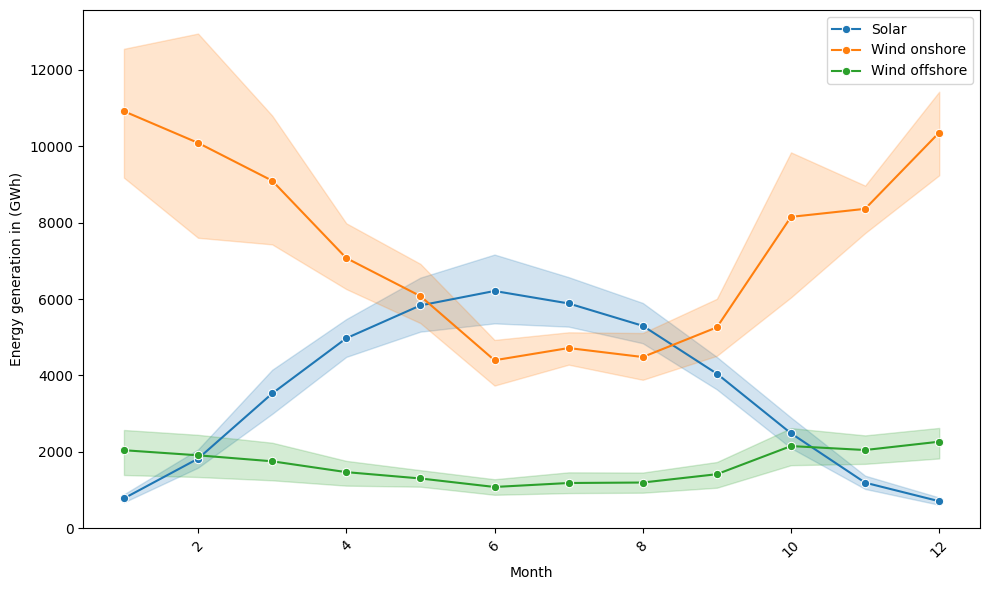

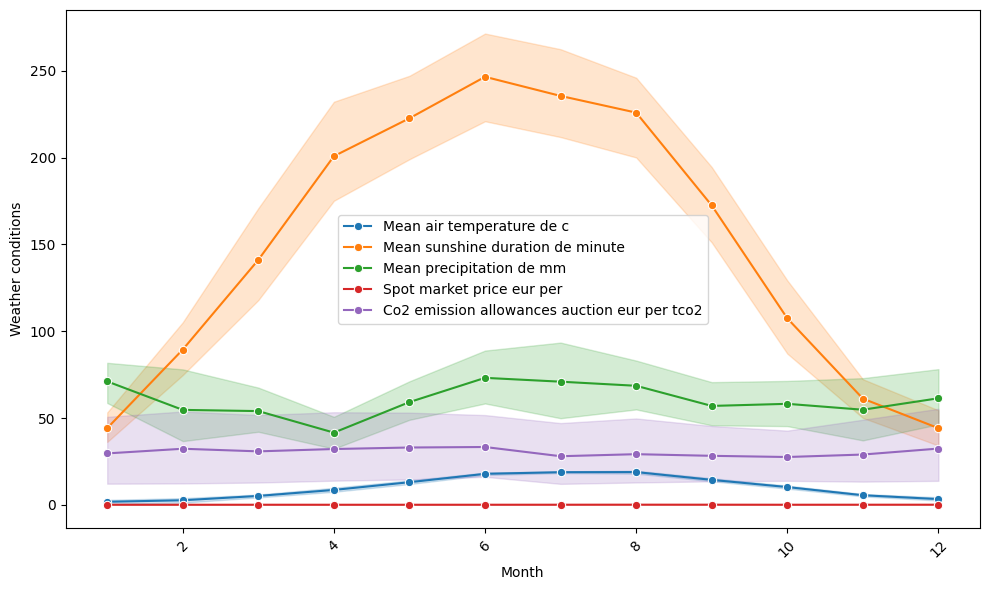

In [81]:
def average_lineplot(df, y_values, x='Date', time='Year'):
    fig, ax = plt.subplots(figsize=(10, 6))

    for y in y_values:
        grouped_df = df \
            .groupby([x, time], as_index=False) \
            .agg({y: np.sum}) \
            .set_index(x)

        y_label_00 = y.replace('_gwh', ' (GWh)')
        y_label_target0 = y_label_00.replace('_', ' ')

        sns.lineplot(x=time, y=y, data=grouped_df, ax=ax, label=y_label_target0, marker='o')

    ax.set(title='', ylabel='Energy generation in (GWh)')
    ax.tick_params(axis='x', rotation=45)
    ax.legend()
    plt.tight_layout()

    # Remove '(GWh)' from the legend labels
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=[label.replace(' (GWh)', '') for label in labels])
    plt.show()

def simple_lineplot(df, y_values, x='Date', time=' '):
    fig, ax = plt.subplots(figsize=(10, 6))

    for y in y_values:
        grouped_df = df \
            .groupby([x, time], as_index=False) \
            .agg({y: np.sum}) \
            .set_index(x)

        y_label_00 = y.replace('_gwh', ' (GWh)')
        y_label_target0 = y_label_00.replace('_', ' ')

        sns.lineplot(x=time, y=y, data=grouped_df, ax=ax, label=y_label_target0, marker='o')

    ax.set(title='', ylabel='Weather conditions')
    ax.tick_params(axis='x', rotation=45)
    ax.legend()
    plt.tight_layout()

    # Remove '(GWh)' from the legend labels
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=[label.replace(' (GWh)', '') for label in labels])
    plt.show()

average_lineplot(df=data_df, y_values=['Solar_gwh', 'Wind_onshore_gwh', 'Wind_offshore_gwh'], x="Date", time='Month')   
#average_lineplot(df=data_df, y_values=['Total_energy_generation_gwh', 'Solar_gwh', 'Wind_onshore_gwh', 'Wind_offshore_gwh'], x="Date", time='Month')
#average_lineplot(df=data_df, y_values=['Wind_onshore_gwh', 'Wind_offshore_gwh'], x="Date", time='Month')

simple_lineplot(df=data_df, y_values=['Mean_air_temperature_de_c',
        'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm',
        'Spot_market_price_eur_per_gwh',
        'Co2_emission_allowances_auction_eur_per_tco2'], x="Date", time='Month')   

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/2155932804.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_df['Total_energy_generation_gwh'])


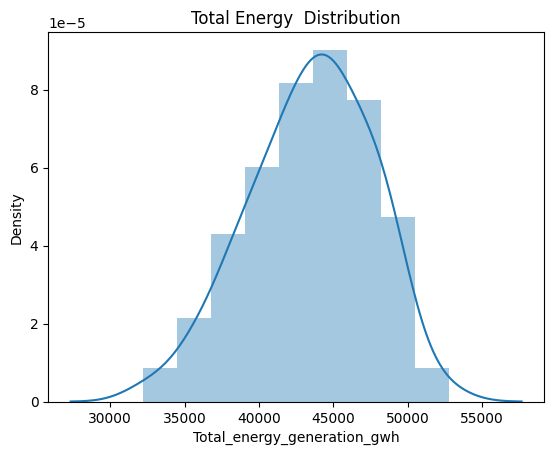

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/2155932804.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_df['Solar_gwh'])


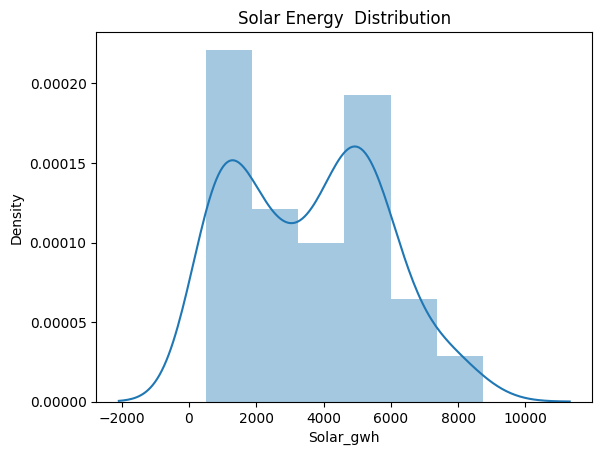

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/2155932804.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_df['Wind_onshore_gwh'])


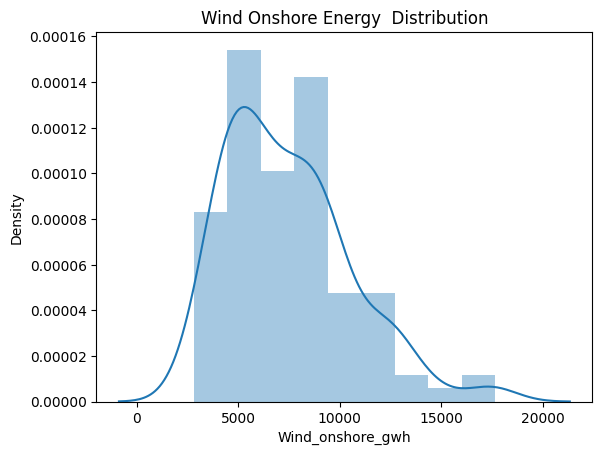

In [82]:
#'Total_energy_generation_gwh', 'Solar_gwh', 'Wind_onshore_gwh', 'Wind_offshore_gwh'
sns.distplot(data_df['Total_energy_generation_gwh'])
plt.title("Total Energy  Distribution")
plt.show()
sns.distplot(data_df['Solar_gwh'])
plt.title("Solar Energy  Distribution")
plt.show()
sns.distplot(data_df['Wind_onshore_gwh'])
plt.title("Wind Onshore Energy  Distribution")
plt.show()

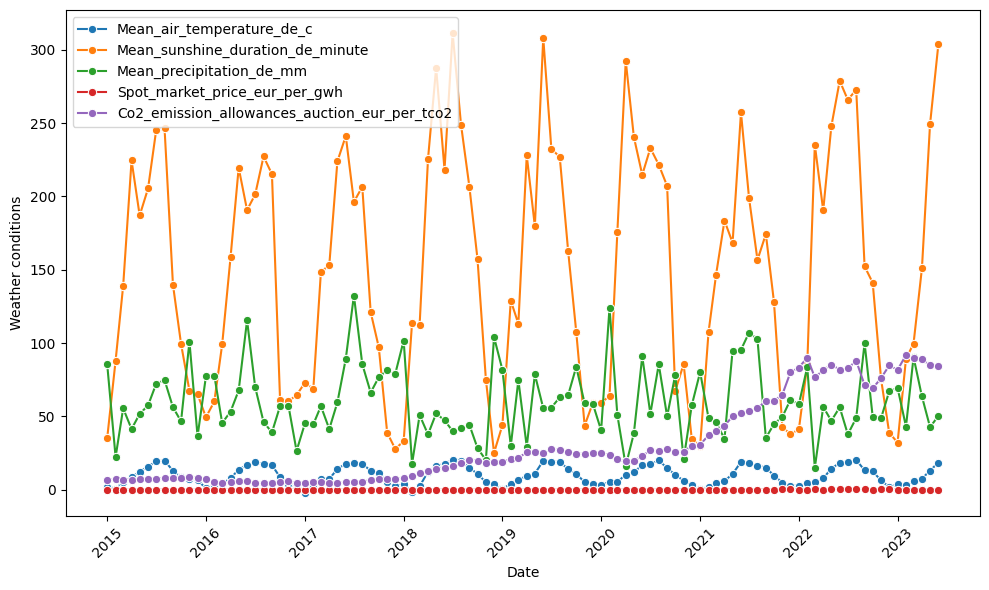

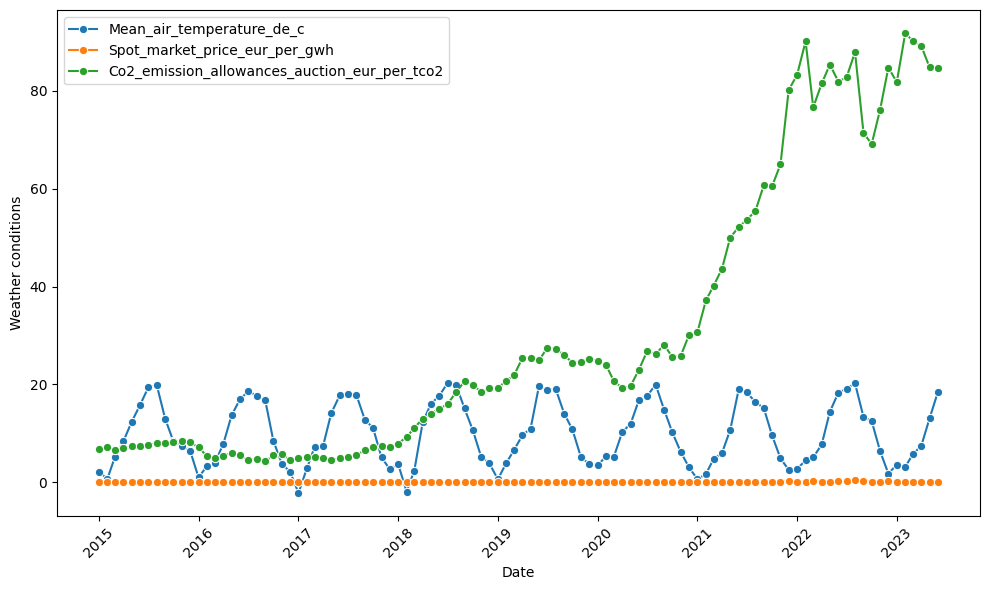

In [83]:
def plot_line_function(df, y_values, x='Date', time='Month'):
    # Convert the 'Date' column to pandas datetime with 'Year-Month' format
    df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m')

    fig, ax = plt.subplots(figsize=(10, 6))

    for y in y_values:
        sns.lineplot(x=time, y=y, data=df, ax=ax, label=y, marker='o')

    ax.set(title='', ylabel='Weather conditions')
    ax.tick_params(axis='x', rotation=45)
    ax.legend()
    plt.tight_layout()

    plt.show()
columns_to_plot = ['Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm', 'Spot_market_price_eur_per_gwh', 'Co2_emission_allowances_auction_eur_per_tco2']
#columns_to_plot = ['Solar_gwh', 'Total_energy_generation_gwh', 'Wind_offshore_gwh', 'Wind_onshore_gwh', 'Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm', 'Spot_market_price_eur_per_gwh', 'Co2_emission_allowances_auction_eur_per_tco2']
plot_line_function(df=data_df, y_values=columns_to_plot, x="date", time='Date')

columns_to_plot1 = ['Mean_air_temperature_de_c', 'Spot_market_price_eur_per_gwh', 'Co2_emission_allowances_auction_eur_per_tco2']
plot_line_function(df=data_df, y_values=columns_to_plot1, x="date", time='Date')


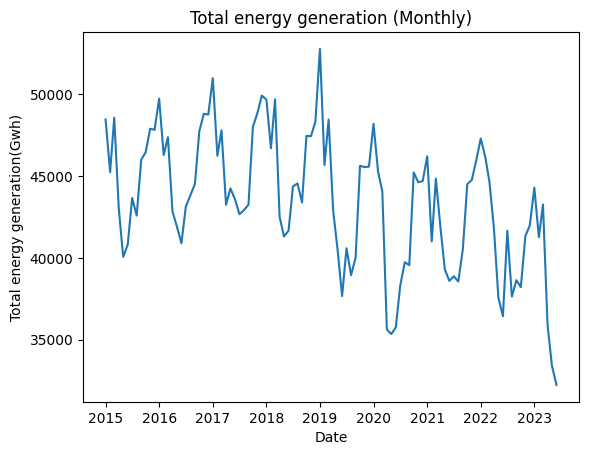

In [84]:
#['Dt_date', 'Solar_gwh', 'Total_energy_generation_gwh','Wind_offshore_gwh', 'Wind_onshore_gwh', 'Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute',
#       'Mean_precipitation_de_mm', 'Spot_market_price_eur_per_gwh','Co2_emission_allowances_auction_eur_per_tco2']
## Energy development over year (time)
fig, ax = plt.subplots()
sns.lineplot(x='Date', y='Total_energy_generation_gwh', data=data_df, ax=ax)
ax.set(title='Total energy generation (Monthly)', ylabel='Total energy generation(Gwh)');

#### Univariate LSTM for energy generation

####  Univariate  LSTM  time series analysis  for   monthly data

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/1021156160.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (102, 12) (102, 1) (90, 12, 1) (90, 1) 102
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (72, 12, 1) (30, 12, 1) (72, 1) (30, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (102, 12) (102, 1) (90, 12, 1) (90, 1) 102
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (72, 12, 1) (30, 12, 1) (72, 1) (30, 1)
Before model fitting
X_test_lstm =  (30, 12, 1)
y_test_lstm =  (30, 1)
X_train_lstm =  (72, 12, 1)
y_train_lstm =  (72, 1)
Epoch 1/200
2/2 [==============================] - 2s 283ms/step - loss: 0.1943 - val_loss: 0.3306
Epoch 2/200
2/2 [==============================] - 0s 28ms/step - loss: 0.1925 - val_loss: 0.3279
Epoch 3/200
2/2 [==============================] - 0s 27ms/step - loss: 0.1907 - val_loss: 0.3253
Epoch 4/200
2/2 [==============================] - 0s 27ms/step - lo

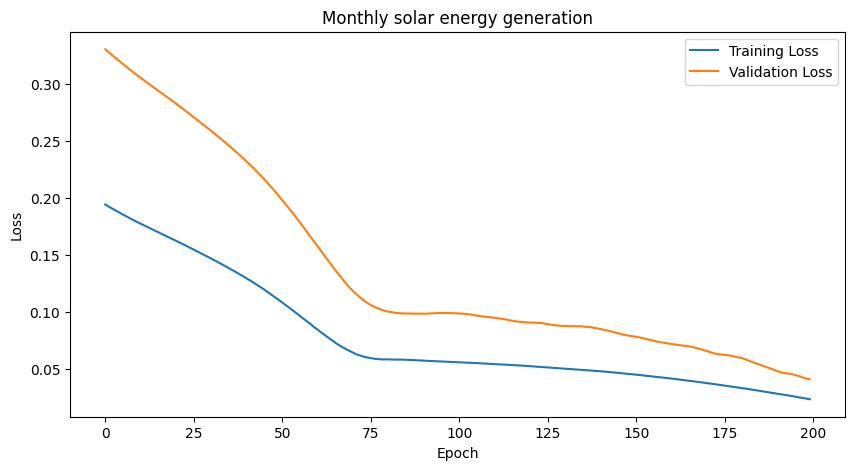

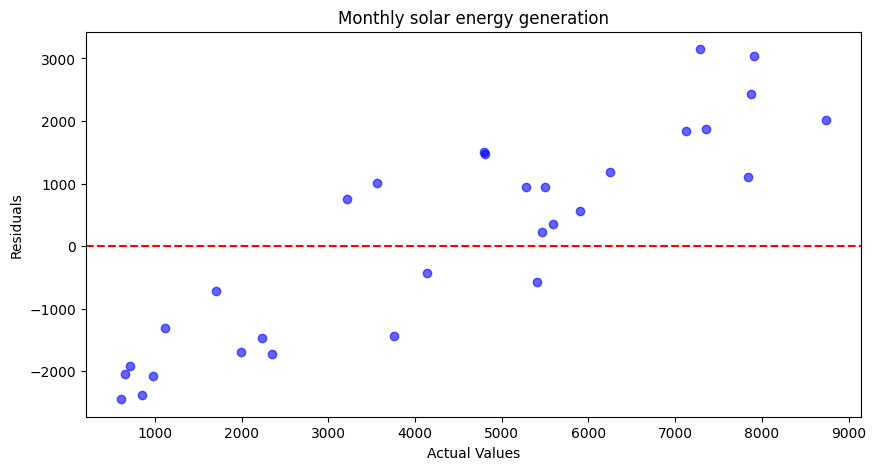

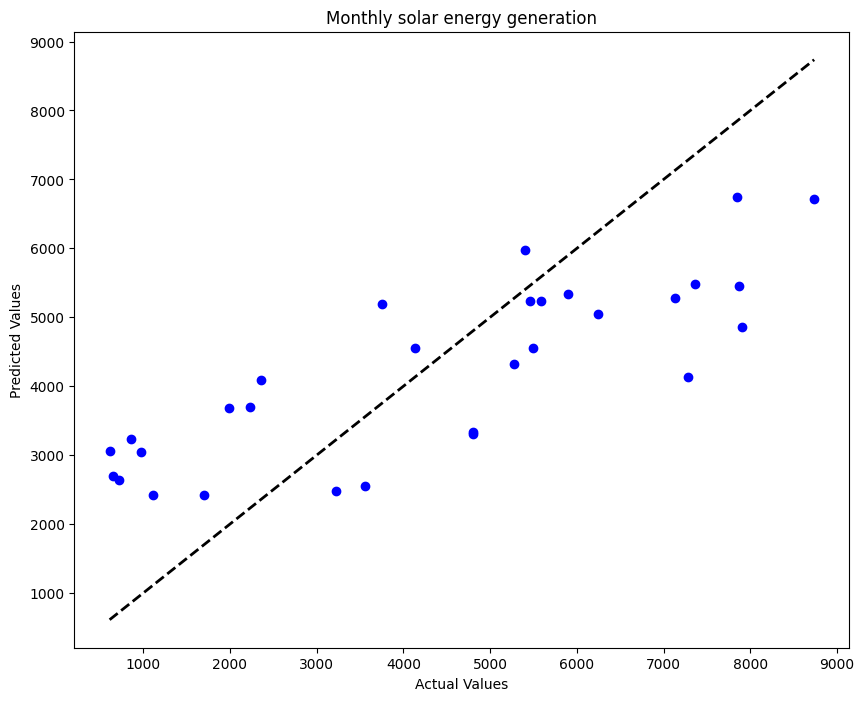

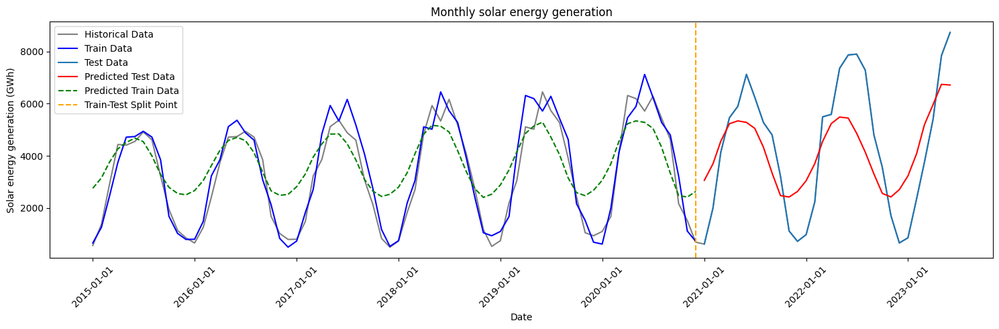

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_44 (LSTM)              (None, 12, 64)            16896     
                                                                 
 lstm_45 (LSTM)              (None, 32)                12416     
                                                                 
 dense_22 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (72, 12, 1) (30, 12, 1) (72, 1) (30, 1) (90, 12, 1) (90, 1) (102, 1)


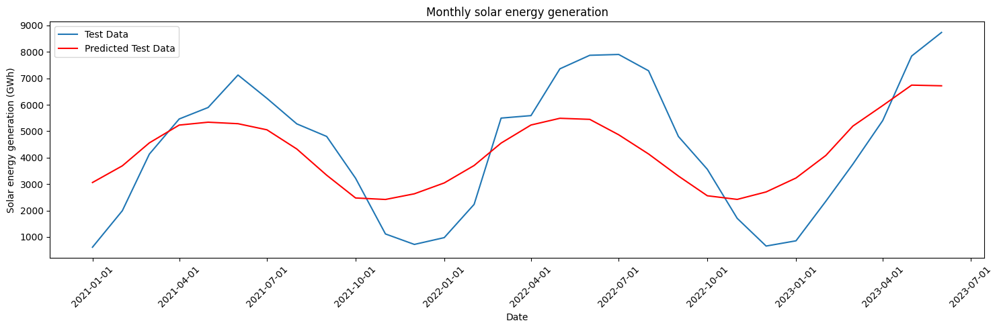

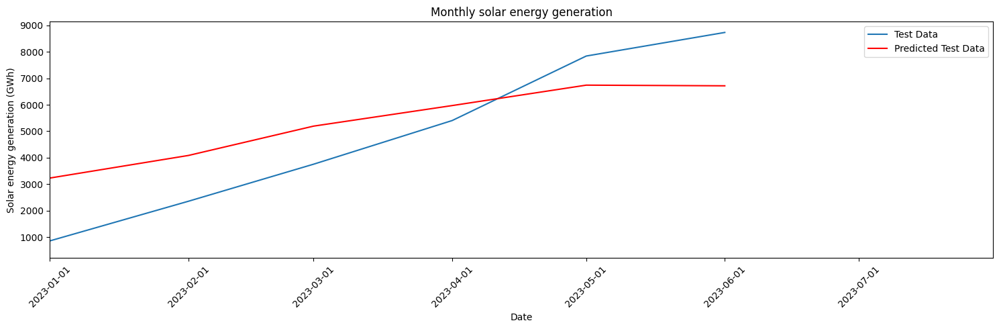

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_44 (LSTM)              (None, 12, 64)            16896     
                                                                 
 lstm_45 (LSTM)              (None, 32)                12416     
                                                                 
 dense_22 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (72, 12, 1) (30, 12, 1) (72, 1) (30, 1) (90, 12, 1) (90, 1) (102, 1)


In [81]:
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:i+lookback])
        y.append(data[i+lookback])
    return np.array(X), np.array(y)

def lstm_model(target, data_df, lookback):
    target_label = target.replace('_gwh', ' energy generation (GWh)').replace('_', ' ')
#    main_target = target.replace('_', ' ').replace('gwh', '(monthly)')
    main_target = 'Monthly solar energy generation' #target.replace('_', ' ').replace('gwh', '(monthly)')
    
    dfs = data_df[['Date', target]]
    dfs['Date'] = pd.to_datetime(dfs['Date'])
    dfs.set_index('Date', inplace=True)
    
    scaler = MinMaxScaler(feature_range=(0, 1))
    data_scaled = scaler.fit_transform(dfs[target].values.reshape(-1, 1))
   
    X_lstm, y_lstm = create_sequences(data_scaled, lookback)
    
    train_size = int(len(X_lstm) * 0.8)

    X_train_lstm, X_test_lstm = X_lstm[:train_size], X_lstm[train_size-lookback:]
    y_train_lstm, y_test_lstm = y_lstm[:train_size], y_lstm[train_size-lookback:]


    print('data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]=',data_df.shape, data_scaled.shape, X_lstm.shape, y_lstm.shape, X_lstm.shape[0]+X_lstm.shape[1])
    print('X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape =',X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape)
    
    print('data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]=',data_df.shape, data_scaled.shape, X_lstm.shape, y_lstm.shape, X_lstm.shape[0]+X_lstm.shape[1])
    print('X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape =',X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape)
    
    print ('Before model fitting')
    print ('X_test_lstm = ',X_test_lstm.shape)
    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('X_train_lstm = ',X_train_lstm.shape)
    print ('y_train_lstm = ',y_train_lstm.shape)


    optimizer = Adam(learning_rate = 0.0001)
    #optimizer = Adam(learning_rate = 0.0001, beta_1 = 0.9, beta_2 = 0.99999)
    #optimizer = SGD(learning_rate = 0.0001, momentum = 0.9)
    model = Sequential()
    model.add(LSTM(units=64, activation='relu', input_shape=(lookback, 1), return_sequences=True))
    model.add(LSTM(units=32, activation='relu'))
    model.add(Dense(1))
    #model.compile(loss='mse', optimizer='adam')
    model.compile(loss='mse', optimizer= optimizer)
    history = model.fit(X_train_lstm, y_train_lstm, epochs=200, batch_size=50, validation_data=(X_test_lstm, y_test_lstm), verbose=1)
    print(model.summary())

   
    print ('After model fitting')
    print ('X_test_lstm = ',X_test_lstm.shape)
    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('X_train_lstm = ',X_train_lstm.shape)
    print ('y_train_lstm = ',y_train_lstm.shape)
     
    y_pred_train_lstm = model.predict(X_train_lstm)
    y_pred_test_lstm = model.predict(X_test_lstm)
    
    print ('After prediction')
    print ('y_train_lstm = ',y_train_lstm.shape)
    print ('y_pred_train_lstm = ',y_pred_train_lstm.shape)
    print ('X_train_lstm = ',y_train_lstm.shape)

    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('y_pred_test_lstm = ',y_pred_test_lstm.shape)
    print ('X_test_lstm = ',X_test_lstm.shape)
     
    

    y_pred_train_lstm = scaler.inverse_transform(y_pred_train_lstm)
    y_pred_test_lstm = scaler.inverse_transform(y_pred_test_lstm)
    y_train_lstm = scaler.inverse_transform(y_train_lstm)
    y_test_lstm = scaler.inverse_transform(y_test_lstm)

    print ('After inverse transformation on prediction data')
    print ('y_train_lstm = ',y_train_lstm.shape)
    print ('y_pred_train_lstm = ',y_pred_train_lstm.shape)
    print ('X_train_lstm = ',y_train_lstm.shape)

    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('y_pred_test_lstm = ',y_pred_test_lstm.shape)
    print ('X_test_lstm = ',X_test_lstm.shape)
     
    

    train_rmse = np.sqrt(mean_squared_error(y_train_lstm, y_pred_train_lstm))
    test_rmse = np.sqrt(mean_squared_error(y_test_lstm, y_pred_test_lstm))
    train_mse = mean_squared_error(y_train_lstm, y_pred_train_lstm)
    test_mse = mean_squared_error(y_test_lstm, y_pred_test_lstm)
    train_mae = mean_absolute_error(y_train_lstm, y_pred_train_lstm)
    test_mae = mean_absolute_error(y_test_lstm, y_pred_test_lstm)
    train_r2 = r2_score(y_train_lstm, y_pred_train_lstm)
    test_r2 = r2_score(y_test_lstm, y_pred_test_lstm)

    print("Train RMSE:", train_rmse)
    print("Train MSE:", train_mse)
    print("Train MAE:", train_mae)
    print("Train R2 Score:", train_r2)
    print("Test RMSE:", test_rmse)
    print("Test MSE:", test_mse)
    print("Test MAE:", test_mae)
    print("Test R2 Score:", test_r2)

    residuals = y_test_lstm - y_pred_test_lstm

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Monthly solar energy generation')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.scatter(y_test_lstm, residuals, color='blue', alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Values')
    plt.ylabel('Residuals')
    plt.title(main_target)
    plt.show()

    plt.figure(figsize=(10, 8))
    plt.scatter(y_test_lstm, y_pred_test_lstm, label='', color='blue')
    plt.plot([y_test_lstm.min(), y_test_lstm.max()], [y_test_lstm.min(), y_test_lstm.max()], 'k--', lw=2, label='')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(main_target)
    plt.show()


    plt.figure(figsize=(15, 5))
    train_index = dfs.index[:train_size][-len(y_train_lstm):]
    test_index = dfs.index[train_size:]
    plt.plot(dfs.index, dfs[target], label='Historical Data', color='gray')
    plt.plot(train_index, y_train_lstm, label='Train Data', color='blue')
    plt.plot(test_index, y_test_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_test_lstm, label='Predicted Test Data', color='red')
    plt.plot(train_index, y_pred_train_lstm, label='Predicted Train Data', color='green', linestyle='dashed')
   #plt.axvline(x=train_size, color='gray', linestyle='--', label='Train-Test Split')
    plt.axvline(x=train_index[-1], color='orange', linestyle='--', label='Train-Test Split Point')
    plt.legend()
    # Format date ticks on x-axis
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    print(model.summary()) 
    print('X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape =', X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, dfs.shape)

   
    plt.figure(figsize=(15, 5))
    train_index = dfs.index[:train_size][-len(y_train_lstm):]
    test_index = dfs.index[train_size:]
    plt.plot(test_index, y_test_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_test_lstm, label='Predicted Test Data', color='red')
    #plt.axvline(x=train_index[-1], color='orange', linestyle='--', label='Train-Test Split Point')
    plt.legend()
    # Format date ticks on x-axis
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


    plt.figure(figsize=(15, 5))
    train_index = dfs.index[:train_size][-len(y_train_lstm):]
    test_index = dfs.index[train_size:]
    plt.plot(test_index, y_test_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_test_lstm, label='Predicted Test Data', color='red')
    plt.xlim(pd.to_datetime('2023-01-01'), pd.to_datetime('2023-07-31'))  # Set xlim to the specified range
    plt.legend()
    # Format date ticks on x-axis
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    print(model.summary()) 
    print('X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape =', X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, dfs.shape)

lookback=12
results = lstm_model('Solar_gwh', data_df, lookback)   



## Multivariate time series analysis on monthly data 

In [63]:
def create_sequences(data, target, lookback):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:i+lookback, :-1])  # Features
        y.append(data[i+lookback-1, -1])   # Target
    return np.array(X), np.array(y)

def lstm_mlvt_model(target, data_mlvt, features, lookback):


    target_label = target.replace('_gwh', ' energy generation (GWh)').replace('_', ' ')
#    main_target = target.replace('_', ' ').replace('gwh', '(monthly)')
    main_target = 'Monthly solar energy generation' #target.replace('_', ' ').replace('gwh', '(monthly)')
    

    dfs = data_mlvt[['Date'] + features + [target]]
    dfs['Date'] = pd.to_datetime(dfs['Date'])
    dfs.set_index('Date', inplace=True)

    # Separate target and features
    target_data = dfs[[target]].values
    feature_data = dfs[features].values

    # Scale features and target separately
    scaler_features = MinMaxScaler(feature_range=(0, 1))
    scaler_target = MinMaxScaler(feature_range=(0, 1))

    feature_scaled = scaler_features.fit_transform(feature_data)
    target_scaled = scaler_target.fit_transform(target_data)

    # Create sequences with scaled data
    data_scaled = np.hstack((feature_scaled, target_scaled))
    X_lstm, y_lstm = create_sequences(data_scaled, target_scaled, lookback)  # Pass target_scaled to create_sequences


    print('data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]=',data_mlvt.shape, data_scaled.shape, X_lstm.shape, y_lstm.shape, X_lstm.shape[0]+X_lstm.shape[1])
    print('X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape =',X_lstm.shape, X_lstm.shape, y_lstm.shape, y_lstm.shape)



    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(units=64, activation='relu', input_shape=(lookback, len(features)), return_sequences=True))
    model.add(LSTM(units=32, activation='relu'))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam')
    history = model.fit(X_lstm, y_lstm, epochs=400, batch_size=50, validation_split=0.2, verbose=1)

    # LSTM prediction on test and train data
    y_pred_lstm = model.predict(X_lstm)

    # Reshape y_pred_lstm to 1-dimensional array
    y_pred_lstm = y_pred_lstm.reshape(-1)

    # Inverse transform the scaled data to get the original scale
    y_pred_lstm = scaler_target.inverse_transform(y_pred_lstm.reshape(-1, 1)).flatten()
    y_lstm = scaler_target.inverse_transform(y_lstm.reshape(-1, 1)).flatten()

    # Calculate residuals
    residuals = y_lstm - y_pred_lstm

    # Print shapes after inverse transform
    print("Shapes after inverse transform:")
    print("y_pred_lstm shape:", y_pred_lstm.shape)
    print("y_lstm shape:", y_lstm.shape)

    # Calculate metrics
    mse = mean_squared_error(y_lstm, y_pred_lstm)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_lstm, y_pred_lstm)
    r2 = r2_score(y_lstm, y_pred_lstm)

    # Print metrics
    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("Mean Absolute Error (MAE):", mae)
    print("R-squared (R^2) Score:", r2)

    # Plot loss versus epoch and validation loss versus epoch
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Monthly solar energy generation')
    plt.legend()
    plt.show()

    # Create a residual plot
    plt.figure(figsize=(10, 5))
    plt.scatter(y_lstm, residuals, color='blue', alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Values')
    plt.ylabel('Residuals')
    plt.title(main_target)
    plt.show()

    plt.figure(figsize=(10, 8))
    plt.scatter(y_lstm, y_pred_lstm, label=' ', color='blue', alpha=0.7)
    plt.plot([y_lstm.min(), y_lstm.max()], [y_lstm.min(), y_lstm.max()], 'k--', lw=2, label='')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(main_target)
    #plt.title('Actual vs. Predicted Values')
    #plt.legend(loc='upper left')
   # plt.grid(True)
    plt.show()



    # Plot actual vs. predicted values with time (including test data only)
    test_index = dfs.index[-len(y_lstm):]
    plt.figure(figsize=(10, 8))
    plt.plot(test_index, y_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_lstm, label='Predicted Test Data', color='red')
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    #plt.xticks([])
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    print(model.summary())
 #   # Plot actual vs. predicted values with time
 #   plt.figure(figsize=(10, 8))
 #   plt.scatter(dfs.index[-len(y_lstm):], y_lstm, label='True Values', color='blue')
 #   plt.scatter(dfs.index[-len(y_pred_lstm):], y_pred_lstm, label='Predicted Values', color='orange')
 #   plt.xlabel('Date')
 #   plt.ylabel(target)
 #   plt.title(target)
 #   plt.legend()
 #   plt.show()


#### 12 days forecast from multivariate LSTM time series on monthly data

data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (102, 5) (102, 2) (90, 12, 1) (90,) 102
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (90, 12, 1) (90, 12, 1) (90,) (90,)
Epoch 1/400


/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/140878938.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


2/2 [==============================] - 1s 194ms/step - loss: 0.1746 - val_loss: 0.2861
Epoch 2/400
2/2 [==============================] - 0s 22ms/step - loss: 0.1648 - val_loss: 0.2705
Epoch 3/400
2/2 [==============================] - 0s 22ms/step - loss: 0.1527 - val_loss: 0.2520
Epoch 4/400
2/2 [==============================] - 0s 21ms/step - loss: 0.1394 - val_loss: 0.2315
Epoch 5/400
2/2 [==============================] - 0s 19ms/step - loss: 0.1241 - val_loss: 0.2092
Epoch 6/400
2/2 [==============================] - 0s 20ms/step - loss: 0.1091 - val_loss: 0.1857
Epoch 7/400
2/2 [==============================] - 0s 19ms/step - loss: 0.0927 - val_loss: 0.1617
Epoch 8/400
2/2 [==============================] - 0s 18ms/step - loss: 0.0782 - val_loss: 0.1385
Epoch 9/400
2/2 [==============================] - 0s 18ms/step - loss: 0.0684 - val_loss: 0.1213
Epoch 10/400
2/2 [==============================] - 0s 18ms/step - loss: 0.0632 - val_loss: 0.1160
Epoch 11/400
2/2 [============

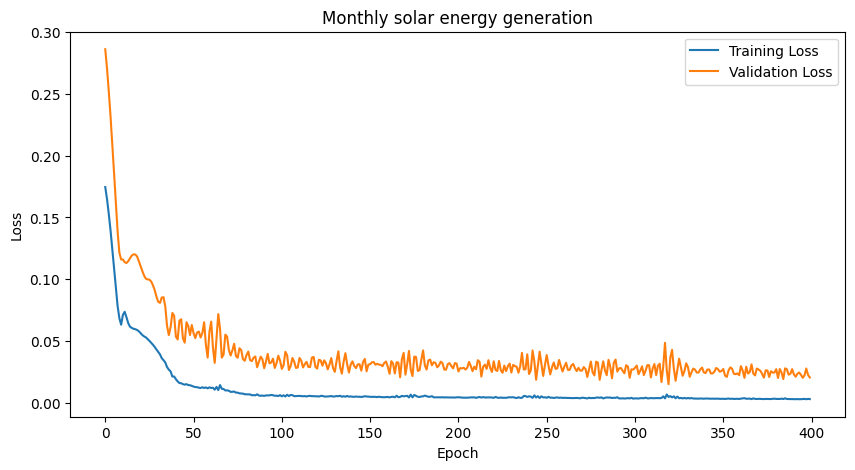

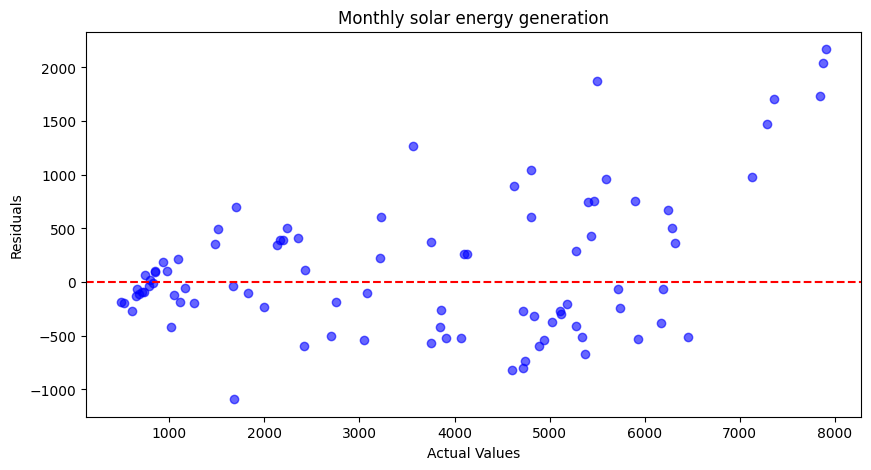

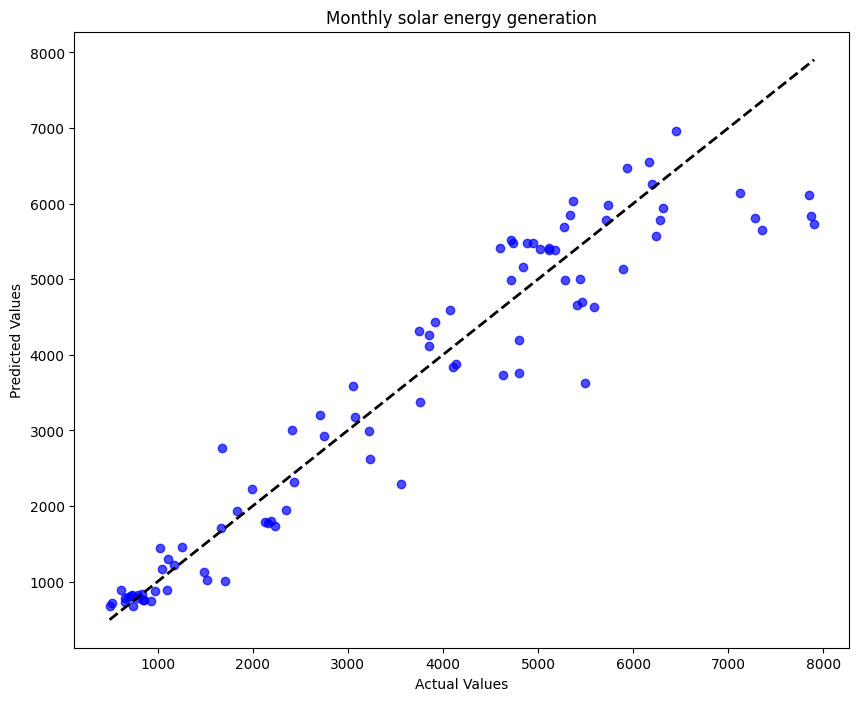

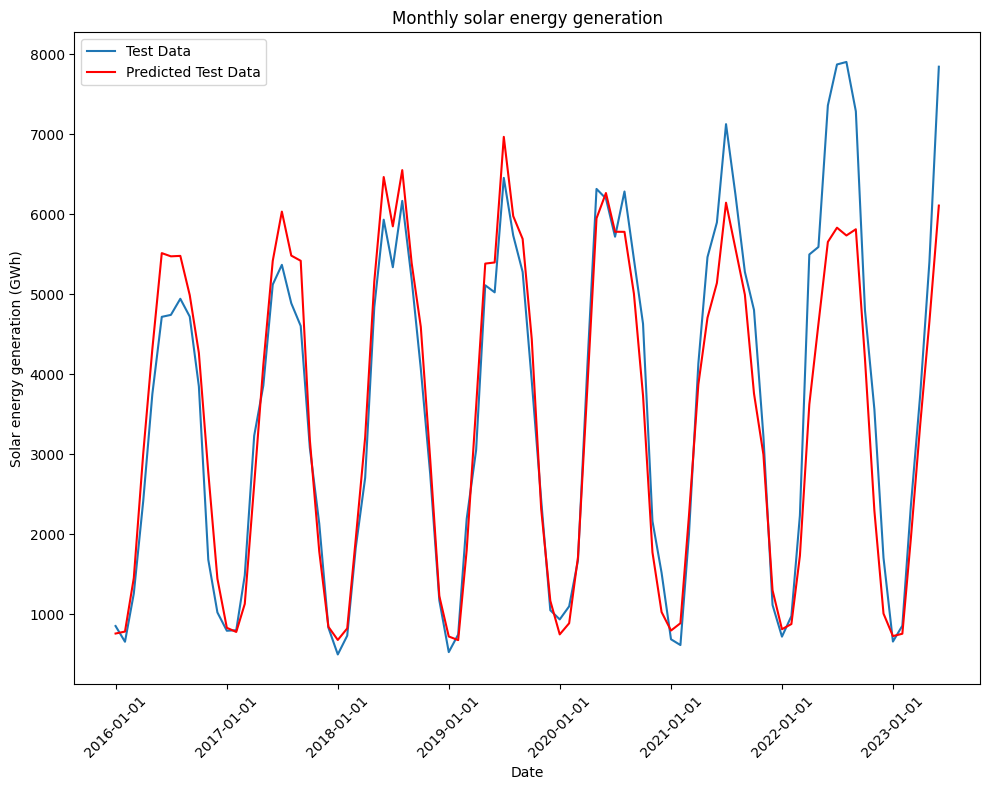

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_34 (LSTM)              (None, 12, 64)            16896     
                                                                 
 lstm_35 (LSTM)              (None, 32)                12416     
                                                                 
 dense_17 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [64]:
columns_mlvt= ['Date','Mean_sunshine_duration_de_minute', 'Mean_air_temperature_de_c', 'Mean_precipitation_de_mm', 'Solar_gwh'] #'Total_other_renewable_gwh'
#target = 'Total_energy_generation_gwh'
data_mlvt = data_df[columns_mlvt].copy()
#data_mlvt.head()

#data = data_df.copy()
#target = 'Total_energy_generation_gwh'
features = ['Mean_sunshine_duration_de_minute']
target = 'Solar_gwh'
lookback = 12
#features =  ['Mean_sunshine_duration_de_minute']#['Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm']
lstm_mlvt_model(target, data_mlvt, features, lookback)

#### 12 days forecast from multivariate LSTM time series on monthly data

data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (102, 5) (102, 3) (90, 12, 2) (90,) 102
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (90, 12, 2) (90, 12, 2) (90,) (90,)
Epoch 1/200


/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/2849340071.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


2/2 [==============================] - 1s 249ms/step - loss: 0.2014 - val_loss: 0.3044
Epoch 2/200
2/2 [==============================] - 0s 24ms/step - loss: 0.1770 - val_loss: 0.2781
Epoch 3/200
2/2 [==============================] - 0s 27ms/step - loss: 0.1573 - val_loss: 0.2575
Epoch 4/200
2/2 [==============================] - 0s 27ms/step - loss: 0.1417 - val_loss: 0.2383
Epoch 5/200
2/2 [==============================] - 0s 34ms/step - loss: 0.1282 - val_loss: 0.2188
Epoch 6/200
2/2 [==============================] - 0s 22ms/step - loss: 0.1150 - val_loss: 0.1978
Epoch 7/200
2/2 [==============================] - 0s 27ms/step - loss: 0.1003 - val_loss: 0.1757
Epoch 8/200
2/2 [==============================] - 0s 25ms/step - loss: 0.0866 - val_loss: 0.1533
Epoch 9/200
2/2 [==============================] - 0s 20ms/step - loss: 0.0742 - val_loss: 0.1330
Epoch 10/200
2/2 [==============================] - 0s 19ms/step - loss: 0.0677 - val_loss: 0.1202
Epoch 11/200
2/2 [============

3/3 [==============================] - 0s 3ms/step
Shapes after inverse transform:
y_pred_lstm shape: (90,)
y_lstm shape: (90,)
Mean Squared Error (MSE): 415316.1501879571
Root Mean Squared Error (RMSE): 644.4502697555158
Mean Absolute Error (MAE): 476.57300463324646
R-squared (R^2) Score: 0.9108894092063141


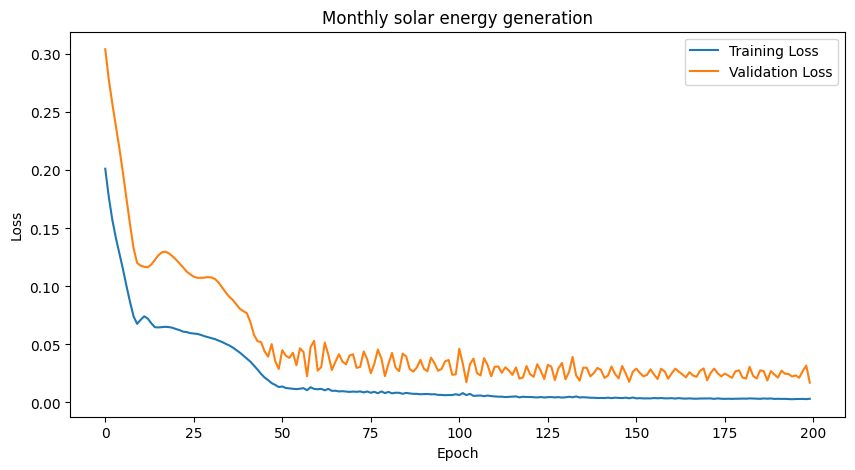

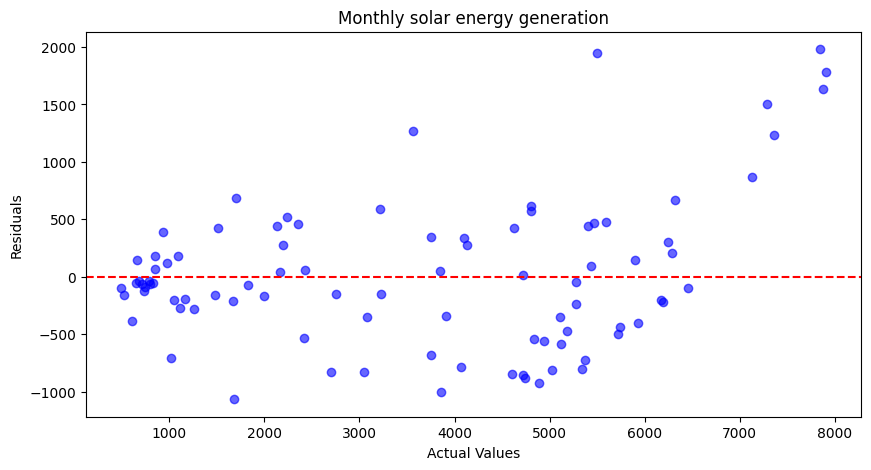

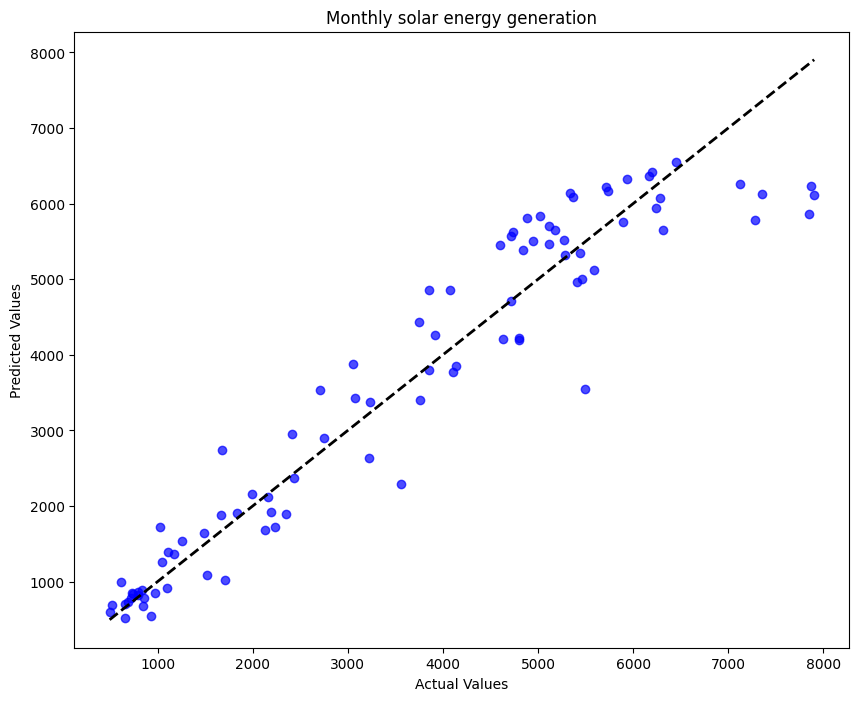

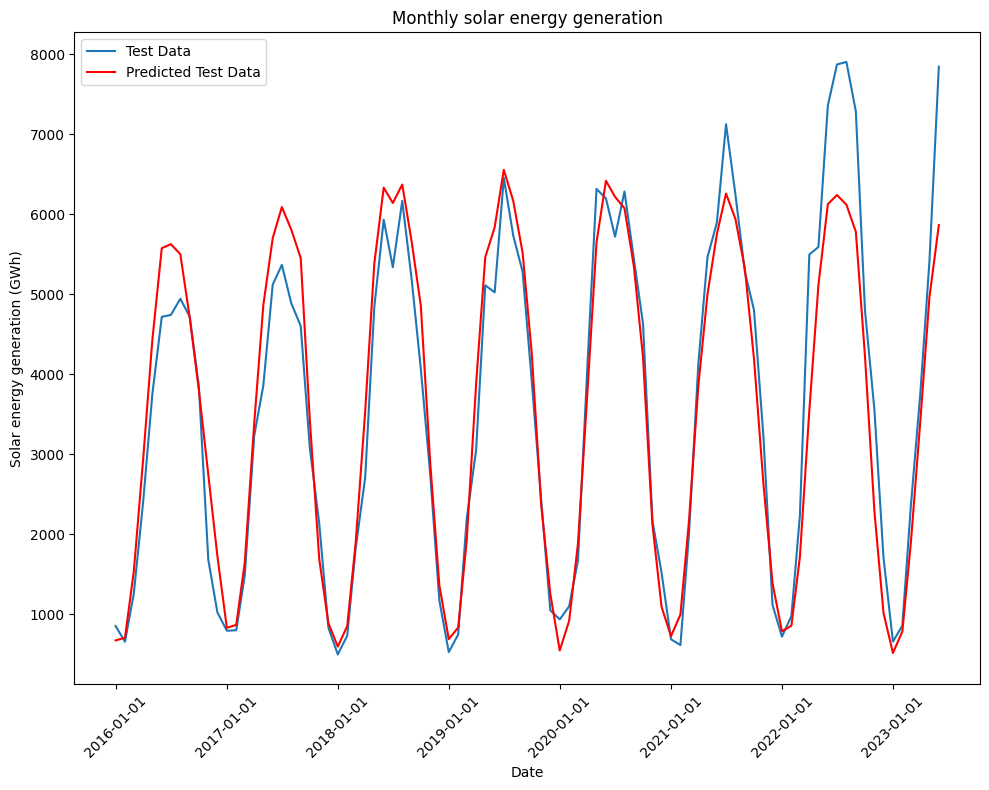

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_30 (LSTM)              (None, 12, 64)            17152     
                                                                 
 lstm_31 (LSTM)              (None, 32)                12416     
                                                                 
 dense_15 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29601 (115.63 KB)
Trainable params: 29601 (115.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [61]:
columns_mlvt= ['Date','Mean_sunshine_duration_de_minute', 'Mean_air_temperature_de_c', 'Mean_precipitation_de_mm', 'Solar_gwh'] #'Total_other_renewable_gwh'
#target = 'Total_energy_generation_gwh'
data_mlvt = data_df[columns_mlvt].copy()
#data_mlvt.head()

#data = data_df.copy()
#target = 'Total_energy_generation_gwh'
features = ['Mean_sunshine_duration_de_minute', 'Mean_air_temperature_de_c']
target = 'Solar_gwh'
lookback = 12
#features =  ['Mean_sunshine_duration_de_minute']#['Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm']
lstm_mlvt_model(target, data_mlvt, features, lookback)

#### 12 days forecast from multivariate LSTM time series on monthly data

data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (102, 5) (102, 4) (90, 12, 3) (90,) 102
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (90, 12, 3) (90, 12, 3) (90,) (90,)
Epoch 1/200
2/2 [==============================] - 1s 191ms/step - loss: 0.1960 - val_loss: 0.2941
Epoch 2/200
2/2 [==============================] - 0s 21ms/step - loss: 0.1692 - val_loss: 0.2652
Epoch 3/200
2/2 [==============================] - 0s 21ms/step - loss: 0.1485 - val_loss: 0.2371
Epoch 4/200
2/2 [==============================] - 0s 21ms/step - loss: 0.1266 - val_loss: 0.2078
Epoch 5/200
2/2 [==============================] - 0s 20ms/step - loss: 0.1051 - val_loss: 0.1776
Epoch 6/200
2/2 [==============================] - 0s 20ms/step - loss: 0.0864 - val_loss: 0.1489
Epoch 7/200
2/2 [==============================] - 0s 20ms/step - loss: 0.0697 - val_loss: 0.1257
Epoch 8/200
2/2 [==============================] - 0s 20ms/step - loss: 0.0632 - va

3/3 [==============================] - 0s 2ms/step
Shapes after inverse transform:
y_pred_lstm shape: (90,)
y_lstm shape: (90,)
Mean Squared Error (MSE): 386029.64733592886
Root Mean Squared Error (RMSE): 621.3128417600338
Mean Absolute Error (MAE): 433.20019581705725
R-squared (R^2) Score: 0.9171731464754864


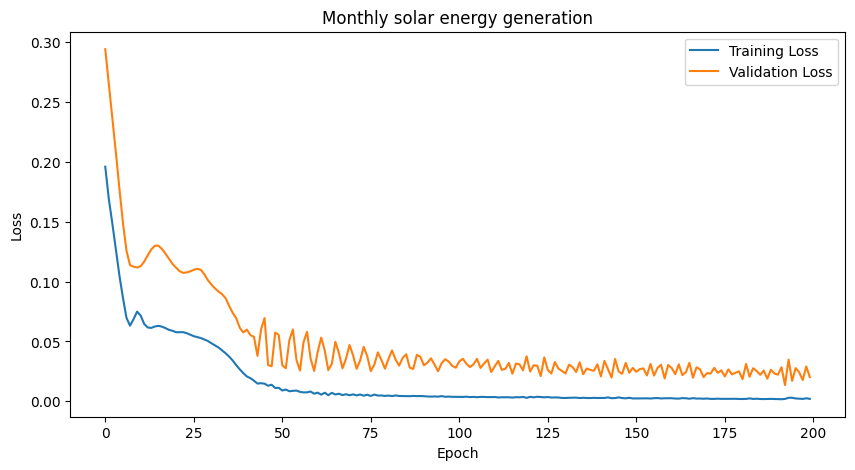

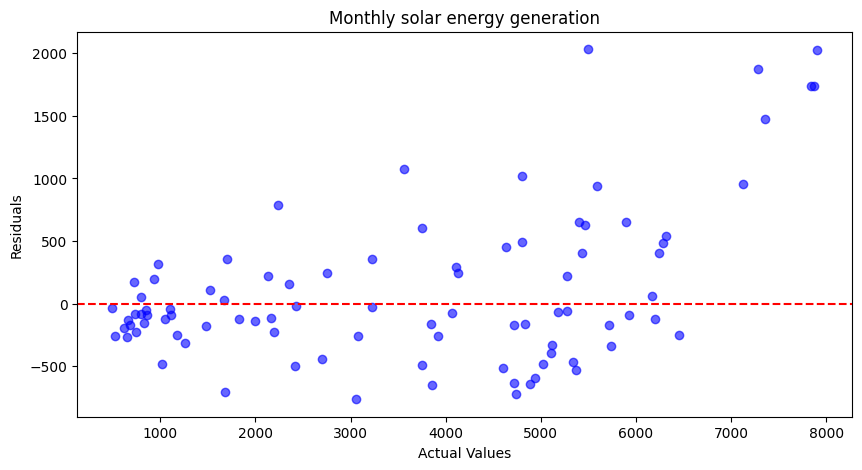

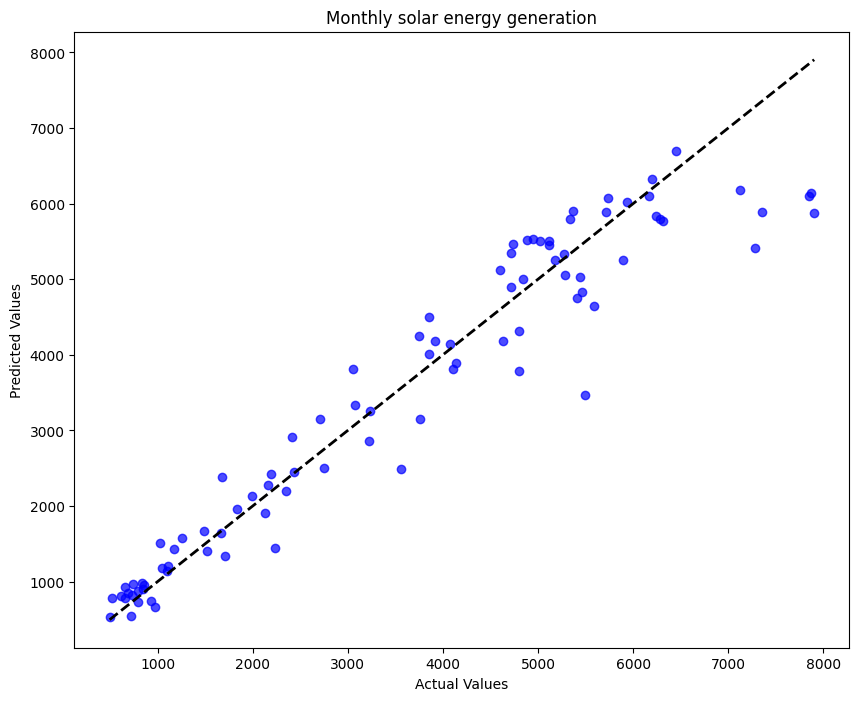

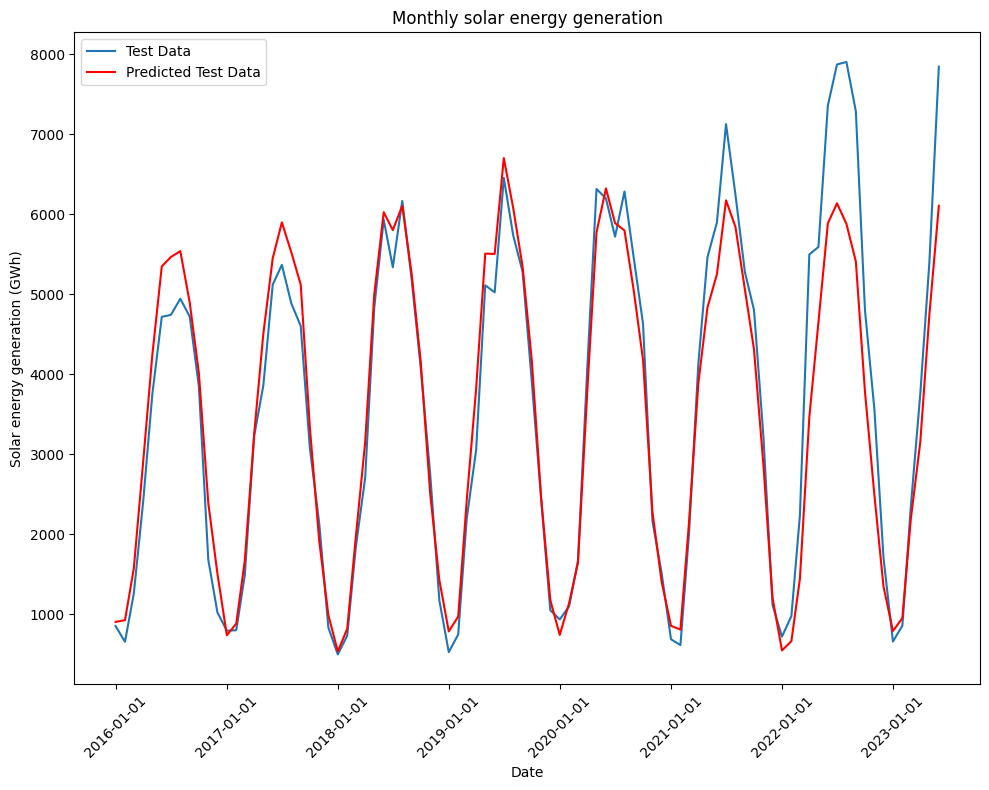

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_32 (LSTM)              (None, 12, 64)            17408     
                                                                 
 lstm_33 (LSTM)              (None, 32)                12416     
                                                                 
 dense_16 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29857 (116.63 KB)
Trainable params: 29857 (116.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [62]:
columns_mlvt= ['Date','Mean_sunshine_duration_de_minute', 'Mean_air_temperature_de_c', 'Mean_precipitation_de_mm', 'Solar_gwh'] #'Total_other_renewable_gwh'
#target = 'Total_energy_generation_gwh'
data_mlvt = data_df[columns_mlvt].copy()
#data_mlvt.head()


#data = data_df.copy()
#target = 'Total_energy_generation_gwh'
features = ['Mean_sunshine_duration_de_minute', 'Mean_air_temperature_de_c', 'Mean_precipitation_de_mm']
target = 'Solar_gwh'
lookback = 12
#features =  ['Mean_sunshine_duration_de_minute']#['Mean_air_temperature_de_c', 'Mean_sunshine_duration_de_minute', 'Mean_precipitation_de_mm']
lstm_mlvt_model(target, data_mlvt, features, lookback)

#### New daily data import (for 10 states in Germany)

In [122]:
#df_daily.csv,  weather_daily_10loc.csv, df_m_all.csv
df_daily = pd.read_csv('data/df_daily.csv')
df_weather_daily_10loc = pd.read_csv('data/weather_daily_10loc.csv')
df_daily.head()

,dt_date_hour,biomass_mwh,fossil_brown_coal_mwh,fossil_coal_derived_gas_mwh,fossil_gas_mwh,fossil_hard_coal_mwh,fossil_oil_mwh,fossil_oil_shale_mwh,fossil_peat_mwh,geothermal_mwh,...,dt_month,dt_week,dt_dayofweek,dt_dayofmonth,dt_dayofyear,dt_monthname,dt_dayname,dt_date,solar_gwh,total_energy_generation_gwh
0,2015-01-01 00:00:00+01:00,95550.50,314599.00,0.0,23806.00,60725.25,4265.75,0.0,0.0,234.00,...,1,1,3,1,1,January,Thursday,2015-01-01,17.08025,1271.68350
1,2015-01-02 00:00:00+01:00,94404.00,257344.00,0.0,29919.25,83617.25,4408.75,0.0,0.0,243.00,...,1,1,4,2,2,January,Friday,2015-01-02,7.75900,1493.59800
2,2015-01-03 00:00:00+01:00,94487.75,296727.50,0.0,29790.75,60999.25,4614.00,0.0,0.0,247.75,...,1,1,5,3,3,January,Saturday,2015-01-03,7.23475,1408.94650
3,2015-01-04 00:00:00+01:00,94764.75,287900.50,0.0,21470.75,47224.50,4627.25,0.0,0.0,263.00,...,1,1,6,4,4,January,Sunday,2015-01-04,19.98250,1325.84900
4,2015-01-05 00:00:00+01:00,94243.25,405171.25,0.0,35151.75,177046.75,4511.00,0.0,0.0,269.00,...,1,2,0,5,5,January,Monday,2015-01-05,26.52225,1521.12275


In [123]:
##  Capitalize the columns names
df_daily.columns = [col.capitalize() for col in df_daily.columns]
df_daily.rename(columns = {'Dt_date': 'Date'}, inplace = True)  
df_daily.head()

# Print the dataframe
df_daily.head()

,Dt_date_hour,Biomass_mwh,Fossil_brown_coal_mwh,Fossil_coal_derived_gas_mwh,Fossil_gas_mwh,Fossil_hard_coal_mwh,Fossil_oil_mwh,Fossil_oil_shale_mwh,Fossil_peat_mwh,Geothermal_mwh,...,Dt_month,Dt_week,Dt_dayofweek,Dt_dayofmonth,Dt_dayofyear,Dt_monthname,Dt_dayname,Date,Solar_gwh,Total_energy_generation_gwh
0,2015-01-01 00:00:00+01:00,95550.50,314599.00,0.0,23806.00,60725.25,4265.75,0.0,0.0,234.00,...,1,1,3,1,1,January,Thursday,2015-01-01,17.08025,1271.68350
1,2015-01-02 00:00:00+01:00,94404.00,257344.00,0.0,29919.25,83617.25,4408.75,0.0,0.0,243.00,...,1,1,4,2,2,January,Friday,2015-01-02,7.75900,1493.59800
2,2015-01-03 00:00:00+01:00,94487.75,296727.50,0.0,29790.75,60999.25,4614.00,0.0,0.0,247.75,...,1,1,5,3,3,January,Saturday,2015-01-03,7.23475,1408.94650
3,2015-01-04 00:00:00+01:00,94764.75,287900.50,0.0,21470.75,47224.50,4627.25,0.0,0.0,263.00,...,1,1,6,4,4,January,Sunday,2015-01-04,19.98250,1325.84900
4,2015-01-05 00:00:00+01:00,94243.25,405171.25,0.0,35151.75,177046.75,4511.00,0.0,0.0,269.00,...,1,2,0,5,5,January,Monday,2015-01-05,26.52225,1521.12275


In [125]:
#df_daily['Dt_date_hour'] = pd.to_datetime(df_daily['Dt_date_hour'], format='%Y-%m-%d %H:%M:%S%z')
# Extract year, month and date from the datetime object
#df_daily['Year'] = df_daily['Dt_date_hour'].dt.year
#df_daily['Month'] = df_daily['Dt_date_hour'].dt.month
#df_daily['Day'] = df_daily['Dt_date_hour'].dt.day
#df_daily['Dayofyear'] = df_dailyf['Dt_date_hour'].dt.dayofyear
#df_daily.head()

df_daily['Date'] = pd.to_datetime(df_daily['Date'], format='%Y-%m-%d')
# Extract year, month and date from the datetime object
df_daily['Year'] = df_daily['Date'].dt.year
df_daily['Month'] = df_daily['Date'].dt.month
df_daily['Day'] = df_daily['Date'].dt.day
#df_daily['Dayofyear'] = df_dailyf['Dt_date_hour'].dt.dayofyear
df_daily.head()

,Dt_date_hour,Biomass_mwh,Fossil_brown_coal_mwh,Fossil_coal_derived_gas_mwh,Fossil_gas_mwh,Fossil_hard_coal_mwh,Fossil_oil_mwh,Fossil_oil_shale_mwh,Fossil_peat_mwh,Geothermal_mwh,...,Dt_dayofmonth,Dt_dayofyear,Dt_monthname,Dt_dayname,Date,Solar_gwh,Total_energy_generation_gwh,Year,Month,Day
0,2015-01-01 00:00:00+01:00,95550.50,314599.00,0.0,23806.00,60725.25,4265.75,0.0,0.0,234.00,...,1,1,January,Thursday,2015-01-01,17.08025,1271.68350,2015,1,1
1,2015-01-02 00:00:00+01:00,94404.00,257344.00,0.0,29919.25,83617.25,4408.75,0.0,0.0,243.00,...,2,2,January,Friday,2015-01-02,7.75900,1493.59800,2015,1,2
2,2015-01-03 00:00:00+01:00,94487.75,296727.50,0.0,29790.75,60999.25,4614.00,0.0,0.0,247.75,...,3,3,January,Saturday,2015-01-03,7.23475,1408.94650,2015,1,3
3,2015-01-04 00:00:00+01:00,94764.75,287900.50,0.0,21470.75,47224.50,4627.25,0.0,0.0,263.00,...,4,4,January,Sunday,2015-01-04,19.98250,1325.84900,2015,1,4
4,2015-01-05 00:00:00+01:00,94243.25,405171.25,0.0,35151.75,177046.75,4511.00,0.0,0.0,269.00,...,5,5,January,Monday,2015-01-05,26.52225,1521.12275,2015,1,5


In [127]:
df_daily.columns

Index(['Dt_date_hour', 'Biomass_mwh', 'Fossil_brown_coal_mwh',
       'Fossil_coal_derived_gas_mwh', 'Fossil_gas_mwh', 'Fossil_hard_coal_mwh',
       'Fossil_oil_mwh', 'Fossil_oil_shale_mwh', 'Fossil_peat_mwh',
       'Geothermal_mwh', 'Hydro_pumped_storage_aggregated_mwh',
       'Hydro_pumped_storage_consumption_mwh',
       'Hydro_run_of_river_and_poundage_mwh', 'Hydro_water_reservoir_mwh',
       'Marine_mwh', 'Nuclear_mwh', 'Other_mwh', 'Other_renewable_mwh',
       'Solar_mwh', 'Waste_mwh', 'Wind_offshore_mwh', 'Wind_onshore_mwh',
       'Total_energy_generation_mwh', 'Dt_year', 'Dt_month', 'Dt_week',
       'Dt_dayofweek', 'Dt_dayofmonth', 'Dt_dayofyear', 'Dt_monthname',
       'Dt_dayname', 'Date', 'Solar_gwh', 'Total_energy_generation_gwh',
       'Year', 'Month', 'Day'],
      dtype='object')

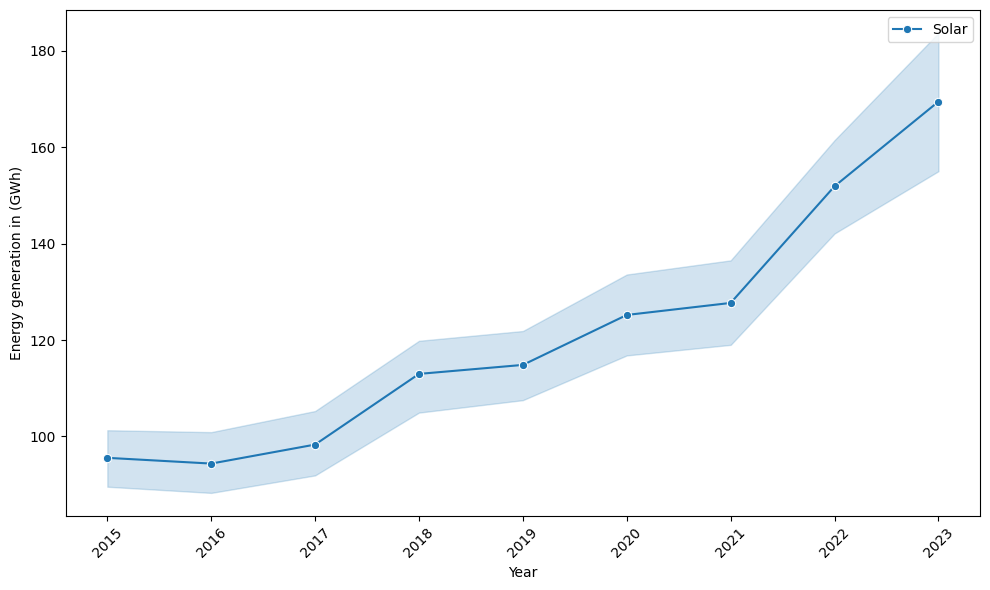

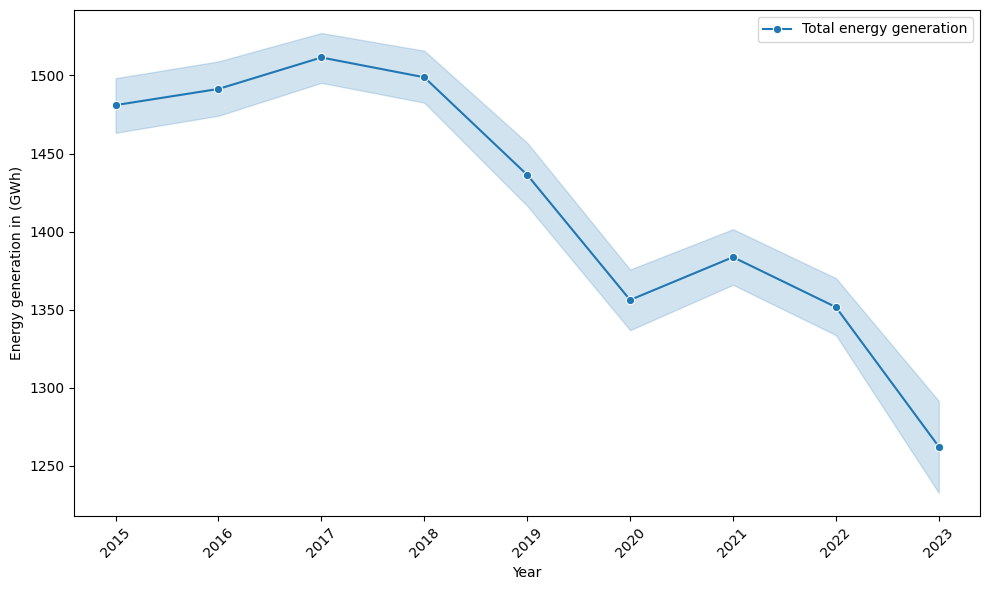

In [130]:
def average_lineplot(df, y_values, x='Date', time='Year'):
    fig, ax = plt.subplots(figsize=(10, 6))

    for y in y_values:
        grouped_df = df \
            .groupby([x, time], as_index=False) \
            .agg({y: np.sum}) \
            .set_index(x)

        y_label_00 = y.replace('_gwh', ' (GWh)')
        y_label_target0 = y_label_00.replace('_', ' ')

        sns.lineplot(x=time, y=y, data=grouped_df, ax=ax, label=y_label_target0, marker='o')

    ax.set(title='', ylabel='Energy generation in (GWh)')
    ax.tick_params(axis='x', rotation=45)
    ax.legend()
    plt.tight_layout()

    # Remove '(GWh)' from the legend labels
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=[label.replace(' (GWh)', '') for label in labels])
    plt.show()

def simple_lineplot(df, y_values, x='Date', time=' '):
    fig, ax = plt.subplots(figsize=(10, 6))

    for y in y_values:
        grouped_df = df \
            .groupby([x, time], as_index=False) \
            .agg({y: np.sum}) \
            .set_index(x)

        y_label_00 = y.replace('_gwh', ' (GWh)')
        y_label_target0 = y_label_00.replace('_', ' ')

        sns.lineplot(x=time, y=y, data=grouped_df, ax=ax, label=y_label_target0, marker='o')

    ax.set(title='', ylabel='Weather conditions')
    ax.tick_params(axis='x', rotation=45)
    ax.legend()
    plt.tight_layout()

    # Remove '(GWh)' from the legend labels
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=[label.replace(' (GWh)', '') for label in labels])
    plt.show()

average_lineplot(df=df_daily, y_values=['Solar_gwh'], x="Date", time='Year')   
average_lineplot(df=df_daily, y_values=['Total_energy_generation_gwh'], x="Date", time='Year')  
#average_lineplot(df=data_df, y_values=['Total_energy_generation_gwh', 'Solar_gwh', 'Wind_onshore_gwh', 'Wind_offshore_gwh'], x="Date", time='Month')
#average_lineplot(df=data_df, y_values=['Wind_onshore_gwh', 'Wind_offshore_gwh'], x="Date", time='Month')

In [131]:
df_daily.columns, df_daily.shape

(Index(['Dt_date_hour', 'Biomass_mwh', 'Fossil_brown_coal_mwh',
        'Fossil_coal_derived_gas_mwh', 'Fossil_gas_mwh', 'Fossil_hard_coal_mwh',
        'Fossil_oil_mwh', 'Fossil_oil_shale_mwh', 'Fossil_peat_mwh',
        'Geothermal_mwh', 'Hydro_pumped_storage_aggregated_mwh',
        'Hydro_pumped_storage_consumption_mwh',
        'Hydro_run_of_river_and_poundage_mwh', 'Hydro_water_reservoir_mwh',
        'Marine_mwh', 'Nuclear_mwh', 'Other_mwh', 'Other_renewable_mwh',
        'Solar_mwh', 'Waste_mwh', 'Wind_offshore_mwh', 'Wind_onshore_mwh',
        'Total_energy_generation_mwh', 'Dt_year', 'Dt_month', 'Dt_week',
        'Dt_dayofweek', 'Dt_dayofmonth', 'Dt_dayofyear', 'Dt_monthname',
        'Dt_dayname', 'Date', 'Solar_gwh', 'Total_energy_generation_gwh',
        'Year', 'Month', 'Day'],
       dtype='object'),
 (3119, 37))

In [132]:
df_weather_daily_10loc.head()

,dt_date,average_temp_c_sc,norm_temp_c_sc,max_temp_c_sc,min_temp_c_sc,sunshine_hour_sc,precipitation_mm_sc,average_wind_speed_mpers_sc,dt_date.1,average_temp_c_hh,...,precipitation_mm_ko,average_wind_speed_mpers_ko,dt_date.9,average_temp_c_mu,norm_temp_c_mu,max_temp_c_mu,min_temp_c_mu,sunshine_hour_mu,precipitation_mm_mu,average_wind_speed_mpers_mu
0,2015-01-01,3.5,1.1,4.4,2.7,1.0,1.2,6.7,2015-01-01,3.6,...,0.0,1.8,2015-01-01,-4.3,0.0,1.0,-10.0,3.8,0.0,1.6
1,2015-01-02,5.8,1.2,8.8,3.8,0.3,0.6,10.4,2015-01-02,6.3,...,8.2,1.9,2015-01-02,-2.0,-0.2,3.9,-11.8,2.4,5.6,4.1
2,2015-01-03,3.7,0.9,5.0,2.1,0.0,4.2,8.4,2015-01-03,4.5,...,11.2,3.3,2015-01-03,1.4,0.3,4.2,0.2,0.1,26.4,3.0
3,2015-01-04,3.3,0.9,5.0,2.1,3.7,0.0,5.8,2015-01-04,4.0,...,0.0,2.2,2015-01-04,1.5,0.5,2.3,0.7,0.0,0.0,6.2
4,2015-01-05,4.1,0.7,4.7,3.0,0.0,0.1,5.6,2015-01-05,3.8,...,0.0,1.4,2015-01-05,1.1,0.0,4.0,-2.4,1.6,0.0,4.1


- mwh to gwh
- Capitalize column name
- drop drop duplicate columns

In [119]:
#print (df_daily['solar_gwh'], df_daily['Solar_mwh'])

#### Weather data information (new daily data)

In [133]:
df_weather_daily_10loc.columns, df_weather_daily_10loc.shape
##  Capitalize the columns names


(Index(['dt_date', 'average_temp_c_sc', 'norm_temp_c_sc', 'max_temp_c_sc',
        'min_temp_c_sc', 'sunshine_hour_sc', 'precipitation_mm_sc',
        'average_wind_speed_mpers_sc', 'dt_date.1', 'average_temp_c_hh',
        'norm_temp_c_hh', 'max_temp_c_hh', 'min_temp_c_hh', 'sunshine_hour_hh',
        'precipitation_mm_hh', 'average_wind_speed_mpers_hh', 'dt_date.2',
        'average_temp_c_bi', 'norm_temp_c_bi', 'max_temp_c_bi', 'min_temp_c_bi',
        'sunshine_hour_bi', 'precipitation_mm_bi',
        'average_wind_speed_mpers_bi', 'dt_date.3', 'average_temp_c_kb',
        'norm_temp_c_kb', 'max_temp_c_kb', 'min_temp_c_kb', 'sunshine_hour_kb',
        'precipitation_mm_kb', 'average_wind_speed_mpers_kb', 'dt_date.4',
        'average_temp_c_go', 'norm_temp_c_go', 'max_temp_c_go', 'min_temp_c_go',
        'sunshine_hour_go', 'precipitation_mm_go',
        'average_wind_speed_mpers_go', 'dt_date.5', 'average_temp_c_dr',
        'norm_temp_c_dr', 'max_temp_c_dr', 'min_temp_c_dr', 'sun

#### Mean average of weather features of 10 different states of Germany

In [141]:
# Define a list of str_start for all the 7 weather features
list_str_start = ['average_temp_c_', 'norm_temp_c_',
       'max_temp_c_', 'min_temp_c_', 'sunshine_hour_',
       'precipitation_mm_', 'average_wind_speed_mpers_']

In [142]:
# Calculate means

# Find all columns that start with str_start
for str_start in list_str_start:
    wf_columns = [col for col in df_weather_daily_10loc.columns if col.startswith(str_start)]

    # Calculate mean
    new_col_name = str_start + 'mean_de'
    df_weather_daily_10loc[new_col_name] = df_weather_daily_10loc[wf_columns].mean(axis=1)

In [143]:
df_weather_daily_10loc.columns#df_weather_daily_10loc.describe().T

Index(['dt_date', 'average_temp_c_sc', 'norm_temp_c_sc', 'max_temp_c_sc',
       'min_temp_c_sc', 'sunshine_hour_sc', 'precipitation_mm_sc',
       'average_wind_speed_mpers_sc', 'dt_date.1', 'average_temp_c_hh',
       'norm_temp_c_hh', 'max_temp_c_hh', 'min_temp_c_hh', 'sunshine_hour_hh',
       'precipitation_mm_hh', 'average_wind_speed_mpers_hh', 'dt_date.2',
       'average_temp_c_bi', 'norm_temp_c_bi', 'max_temp_c_bi', 'min_temp_c_bi',
       'sunshine_hour_bi', 'precipitation_mm_bi',
       'average_wind_speed_mpers_bi', 'dt_date.3', 'average_temp_c_kb',
       'norm_temp_c_kb', 'max_temp_c_kb', 'min_temp_c_kb', 'sunshine_hour_kb',
       'precipitation_mm_kb', 'average_wind_speed_mpers_kb', 'dt_date.4',
       'average_temp_c_go', 'norm_temp_c_go', 'max_temp_c_go', 'min_temp_c_go',
       'sunshine_hour_go', 'precipitation_mm_go',
       'average_wind_speed_mpers_go', 'dt_date.5', 'average_temp_c_dr',
       'norm_temp_c_dr', 'max_temp_c_dr', 'min_temp_c_dr', 'sunshine_hour_dr'

In [145]:
#df_weather_daily_10loc.columns, df_weather_daily_10loc.shape

In [144]:
df_weather_daily_10loc.columns = [col.capitalize() for col in df_weather_daily_10loc.columns]
df_weather_daily_10loc.rename(columns = {'Dt_date': 'Date'}, inplace = True)  
df_weather_daily_10loc.head()
# Print the dataframe
#df_weather_daily_10loc.head()

,Date,Average_temp_c_sc,Norm_temp_c_sc,Max_temp_c_sc,Min_temp_c_sc,Sunshine_hour_sc,Precipitation_mm_sc,Average_wind_speed_mpers_sc,Dt_date.1,Average_temp_c_hh,...,Sunshine_hour_mu,Precipitation_mm_mu,Average_wind_speed_mpers_mu,Average_wind_speed_mpers_mean_de,Average_temp_c_mean_de,Norm_temp_c_mean_de,Max_temp_c_mean_de,Min_temp_c_mean_de,Sunshine_hour_mean_de,Precipitation_mm_mean_de
0,2015-01-01,3.5,1.1,4.4,2.7,1.0,1.2,6.7,2015-01-01,3.6,...,3.8,0.0,1.6,2.88,0.29,1.30,3.01,-2.42,3.22,1.37
1,2015-01-02,5.8,1.2,8.8,3.8,0.3,0.6,10.4,2015-01-02,6.3,...,2.4,5.6,4.1,5.36,2.94,1.27,6.15,-0.80,0.61,4.59
2,2015-01-03,3.7,0.9,5.0,2.1,0.0,4.2,8.4,2015-01-03,4.5,...,0.1,26.4,3.0,4.39,2.92,1.21,5.12,1.22,0.01,8.43
3,2015-01-04,3.3,0.9,5.0,2.1,3.7,0.0,5.8,2015-01-04,4.0,...,0.0,0.0,6.2,4.29,2.52,1.36,4.69,0.82,2.15,0.19
4,2015-01-05,4.1,0.7,4.7,3.0,0.0,0.1,5.6,2015-01-05,3.8,...,1.6,0.0,4.1,3.22,1.48,1.15,3.75,-0.56,2.49,0.15


In [146]:
df_weather_daily_10loc.columns, df_weather_daily_10loc.shape

(Index(['Date', 'Average_temp_c_sc', 'Norm_temp_c_sc', 'Max_temp_c_sc',
        'Min_temp_c_sc', 'Sunshine_hour_sc', 'Precipitation_mm_sc',
        'Average_wind_speed_mpers_sc', 'Dt_date.1', 'Average_temp_c_hh',
        'Norm_temp_c_hh', 'Max_temp_c_hh', 'Min_temp_c_hh', 'Sunshine_hour_hh',
        'Precipitation_mm_hh', 'Average_wind_speed_mpers_hh', 'Dt_date.2',
        'Average_temp_c_bi', 'Norm_temp_c_bi', 'Max_temp_c_bi', 'Min_temp_c_bi',
        'Sunshine_hour_bi', 'Precipitation_mm_bi',
        'Average_wind_speed_mpers_bi', 'Dt_date.3', 'Average_temp_c_kb',
        'Norm_temp_c_kb', 'Max_temp_c_kb', 'Min_temp_c_kb', 'Sunshine_hour_kb',
        'Precipitation_mm_kb', 'Average_wind_speed_mpers_kb', 'Dt_date.4',
        'Average_temp_c_go', 'Norm_temp_c_go', 'Max_temp_c_go', 'Min_temp_c_go',
        'Sunshine_hour_go', 'Precipitation_mm_go',
        'Average_wind_speed_mpers_go', 'Dt_date.5', 'Average_temp_c_dr',
        'Norm_temp_c_dr', 'Max_temp_c_dr', 'Min_temp_c_dr', 'Sunshi

## Univariate LSTM for new daily data

In [148]:
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:i+lookback])
        y.append(data[i+lookback])
    return np.array(X), np.array(y)

def lstm_model_daily(target, data_df, lookback):
    target_label = target.replace('_gwh', ' energy generation (GWh)').replace('_', ' ')
#    main_target = target.replace('_', ' ').replace('gwh', '(monthly)')
    main_target = 'Daily solar energy generation' #target.replace('_', ' ').replace('gwh', '(monthly)')
    
    dfs = data_df[['Date', target]]
    dfs['Date'] = pd.to_datetime(dfs['Date'])
    dfs.set_index('Date', inplace=True)
    
    scaler = MinMaxScaler(feature_range=(0, 1))
    data_scaled = scaler.fit_transform(dfs[target].values.reshape(-1, 1))
   
    X_lstm, y_lstm = create_sequences(data_scaled, lookback)
    
    train_size = int(len(X_lstm) * 0.8)

    X_train_lstm, X_test_lstm = X_lstm[:train_size], X_lstm[train_size-lookback:]
    y_train_lstm, y_test_lstm = y_lstm[:train_size], y_lstm[train_size-lookback:]


    print('data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]=',data_df.shape, data_scaled.shape, X_lstm.shape, y_lstm.shape, X_lstm.shape[0]+X_lstm.shape[1])
    print('X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape =',X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape)
    
    print('data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]=',data_df.shape, data_scaled.shape, X_lstm.shape, y_lstm.shape, X_lstm.shape[0]+X_lstm.shape[1])
    print('X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape =',X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape)
    
    print ('Before model fitting')
    print ('X_test_lstm = ',X_test_lstm.shape)
    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('X_train_lstm = ',X_train_lstm.shape)
    print ('y_train_lstm = ',y_train_lstm.shape)

    
    #optimizer = Adam(learning_rate = 0.0001, beta_1 = 0.0, beta_2 = 0.0)
    #optimizer = Adam(learning_rate = 0.0001, beta_1 = 0.9, beta_2 = 0.9999999)
    optimizer = SGD(learning_rate = 0.0001, momentum = 0.9)
    model = Sequential()
    model.add(LSTM(units=64, activation='relu', input_shape=(lookback, 1), return_sequences=True))
    model.add(LSTM(units=32, activation='relu'))
    model.add(Dense(1))
    #model.compile(loss='mse', optimizer='adam')
    model.compile(loss='mse', optimizer= optimizer)
    history = model.fit(X_train_lstm, y_train_lstm, epochs=700, batch_size=50, validation_data=(X_test_lstm, y_test_lstm), verbose=1)
    print(model.summary())

   
    print ('After model fitting')
    print ('X_test_lstm = ',X_test_lstm.shape)
    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('X_train_lstm = ',X_train_lstm.shape)
    print ('y_train_lstm = ',y_train_lstm.shape)
     
    y_pred_train_lstm = model.predict(X_train_lstm)
    y_pred_test_lstm = model.predict(X_test_lstm)
    
    print ('After prediction')
    print ('y_train_lstm = ',y_train_lstm.shape)
    print ('y_pred_train_lstm = ',y_pred_train_lstm.shape)
    print ('X_train_lstm = ',y_train_lstm.shape)

    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('y_pred_test_lstm = ',y_pred_test_lstm.shape)
    print ('X_test_lstm = ',X_test_lstm.shape)
     
    

    y_pred_train_lstm = scaler.inverse_transform(y_pred_train_lstm)
    y_pred_test_lstm = scaler.inverse_transform(y_pred_test_lstm)
    y_train_lstm = scaler.inverse_transform(y_train_lstm)
    y_test_lstm = scaler.inverse_transform(y_test_lstm)

    print ('After inverse transformation on prediction data')
    print ('y_train_lstm = ',y_train_lstm.shape)
    print ('y_pred_train_lstm = ',y_pred_train_lstm.shape)
    print ('X_train_lstm = ',y_train_lstm.shape)

    print ('y_test_lstm = ',y_test_lstm.shape)
    print ('y_pred_test_lstm = ',y_pred_test_lstm.shape)
    print ('X_test_lstm = ',X_test_lstm.shape)
     
    

    train_rmse = np.sqrt(mean_squared_error(y_train_lstm, y_pred_train_lstm))
    test_rmse = np.sqrt(mean_squared_error(y_test_lstm, y_pred_test_lstm))
    train_mse = mean_squared_error(y_train_lstm, y_pred_train_lstm)
    test_mse = mean_squared_error(y_test_lstm, y_pred_test_lstm)
    train_mae = mean_absolute_error(y_train_lstm, y_pred_train_lstm)
    test_mae = mean_absolute_error(y_test_lstm, y_pred_test_lstm)
    train_r2 = r2_score(y_train_lstm, y_pred_train_lstm)
    test_r2 = r2_score(y_test_lstm, y_pred_test_lstm)

    print("Train RMSE:", train_rmse)
    print("Train MSE:", train_mse)
    print("Train MAE:", train_mae)
    print("Train R2 Score:", train_r2)
    print("Test RMSE:", test_rmse)
    print("Test MSE:", test_mse)
    print("Test MAE:", test_mae)
    print("Test R2 Score:", test_r2)

    residuals = y_test_lstm - y_pred_test_lstm

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Daily solar energy generation')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.scatter(y_test_lstm, residuals, color='blue', alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Values')
    plt.ylabel('Residuals')
    plt.title(main_target)
    plt.show()

    plt.figure(figsize=(10, 8))
    plt.scatter(y_test_lstm, y_pred_test_lstm, label='', color='blue')
    plt.plot([y_test_lstm.min(), y_test_lstm.max()], [y_test_lstm.min(), y_test_lstm.max()], 'k--', lw=2, label='')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(main_target)
    plt.show()


    plt.figure(figsize=(15, 5))
    train_index = dfs.index[:train_size][-len(y_train_lstm):]
    test_index = dfs.index[train_size:]
    plt.plot(dfs.index, dfs[target], label='Historical Data', color='gray')
    plt.plot(train_index, y_train_lstm, label='Train Data', color='blue')
    plt.plot(test_index, y_test_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_test_lstm, label='Predicted Test Data', color='red')
    plt.plot(train_index, y_pred_train_lstm, label='Predicted Train Data', color='green', linestyle='dashed')
   #plt.axvline(x=train_size, color='gray', linestyle='--', label='Train-Test Split')
    plt.axvline(x=train_index[-1], color='orange', linestyle='--', label='Train-Test Split Point')
    plt.legend()
    # Format date ticks on x-axis
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    print(model.summary()) 
    print('X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape =', X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, dfs.shape)

   
    plt.figure(figsize=(15, 5))
    train_index = dfs.index[:train_size][-len(y_train_lstm):]
    test_index = dfs.index[train_size:]
    plt.plot(test_index, y_test_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_test_lstm, label='Predicted Test Data', color='red')
    #plt.axvline(x=train_index[-1], color='orange', linestyle='--', label='Train-Test Split Point')
    plt.legend()
    # Format date ticks on x-axis
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


    plt.figure(figsize=(15, 5))
    train_index = dfs.index[:train_size][-len(y_train_lstm):]
    test_index = dfs.index[train_size:]
    plt.plot(test_index, y_test_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_test_lstm, label='Predicted Test Data', color='red')
    plt.xlim(pd.to_datetime('2023-01-01'), pd.to_datetime('2023-07-31'))  # Set xlim to the specified range
    plt.legend()
    # Format date ticks on x-axis
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    print(model.summary()) 
    print('X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape =', X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, dfs.shape)
#ADM
#lookback=12
#results = lstm_model_daily('Solar_gwh', df_daily, lookback)   


#### 12 days fore cast on daily data with momentum classifier

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/3467939555.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3107, 12, 1) (3107, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3107, 12, 1) (3107, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1)
Before model fitting
X_test_lstm =  (634, 12, 1)
y_test_lstm =  (634, 1)
X_train_lstm =  (2485, 12, 1)
y_train_lstm =  (2485, 1)


Epoch 1/700
50/50 [==============================] - 5s 30ms/step - loss: 0.1157 - val_loss: 0.1967
Epoch 2/700
50/50 [==============================] - 1s 19ms/step - loss: 0.0971 - val_loss: 0.1736
Epoch 3/700
50/50 [==============================] - 1s 20ms/step - loss: 0.0821 - val_loss: 0.1549
Epoch 4/700
50/50 [==============================] - 1s 20ms/step - loss: 0.0706 - val_loss: 0.1400
Epoch 5/700
50/50 [==============================] - 1s 21ms/step - loss: 0.0620 - val_loss: 0.1283
Epoch 6/700
50/50 [==============================] - 1s 20ms/step - loss: 0.0555 - val_loss: 0.1190
Epoch 7/700
50/50 [==============================] - 1s 20ms/step - loss: 0.0506 - val_loss: 0.1115
Epoch 8/700
50/50 [==============================] - 1s 21ms/step - loss: 0.0469 - val_loss: 0.1056
Epoch 9/700
50/50 [==============================] - 1s 20ms/step - loss: 0.0440 - val_loss: 0.1007
Epoch 10/700
50/50 [==============================] - 1s 20ms/step - loss: 0.0419 - val_loss: 0.0965

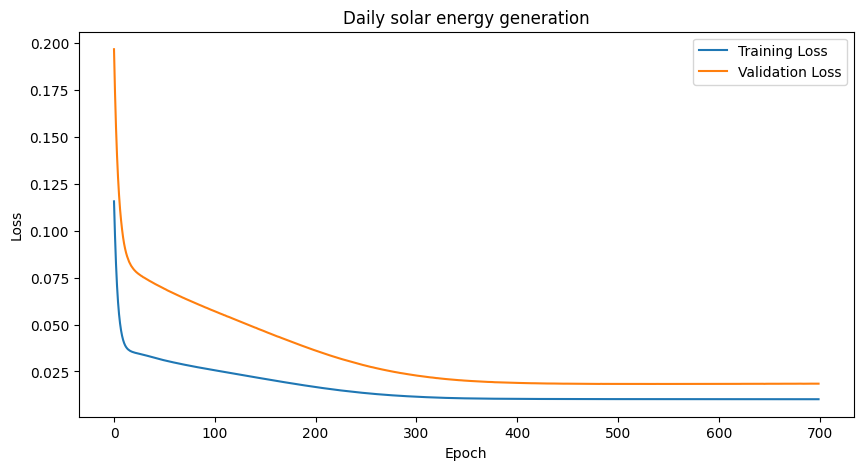

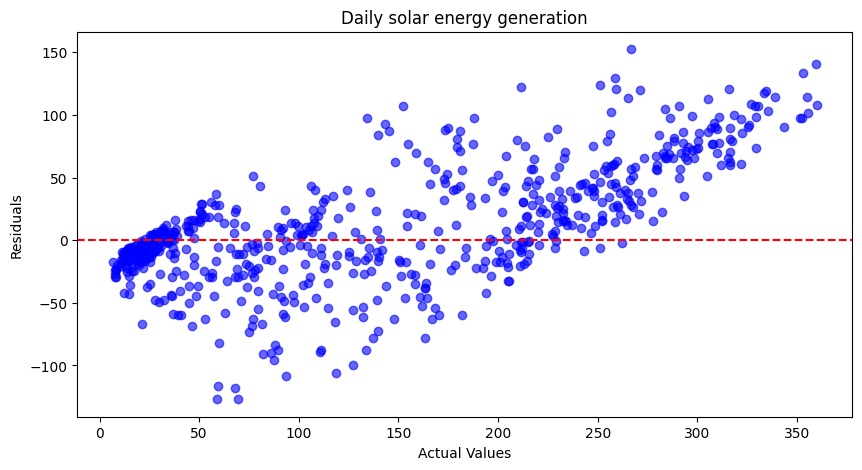

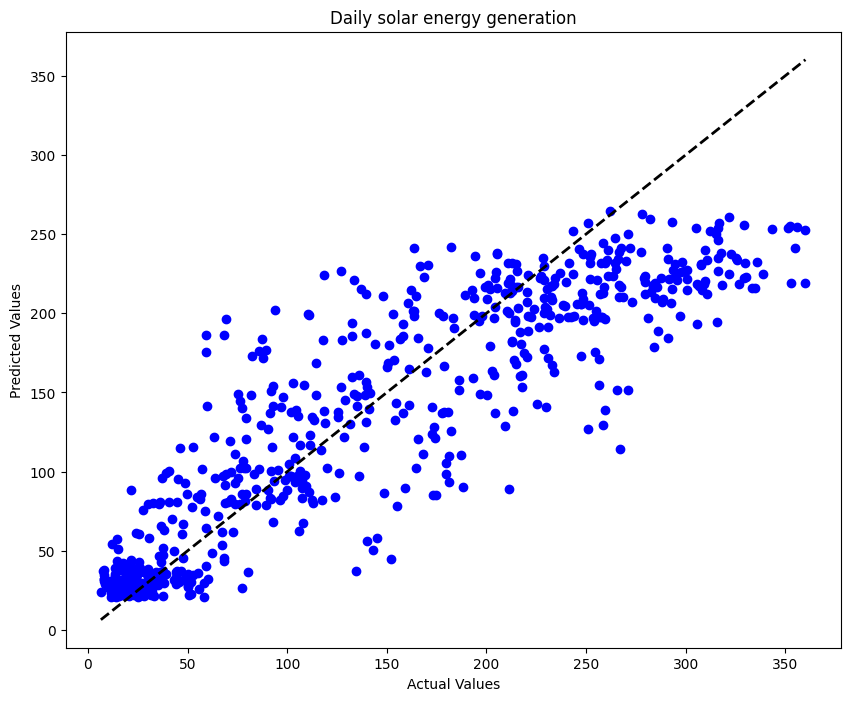

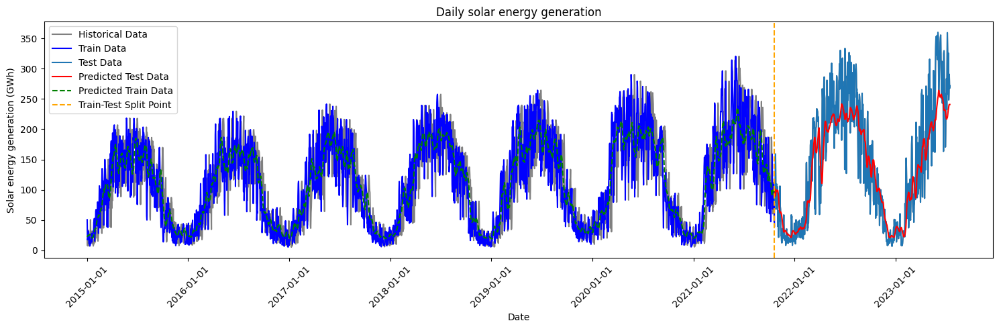

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 12, 64)            16896     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1) (3107, 12, 1) (3107, 1) (3119, 1)


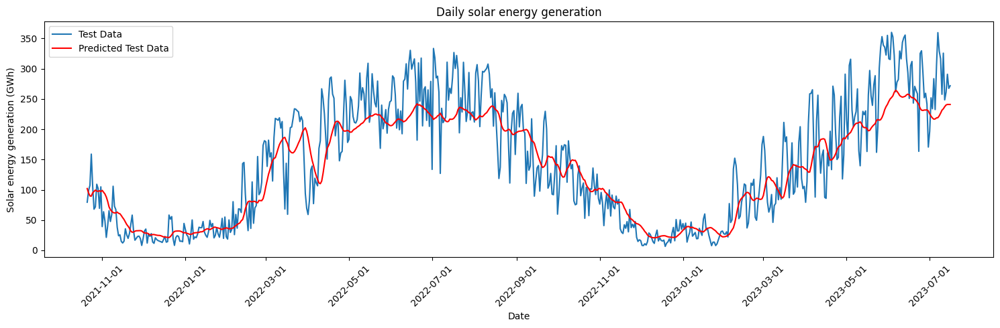

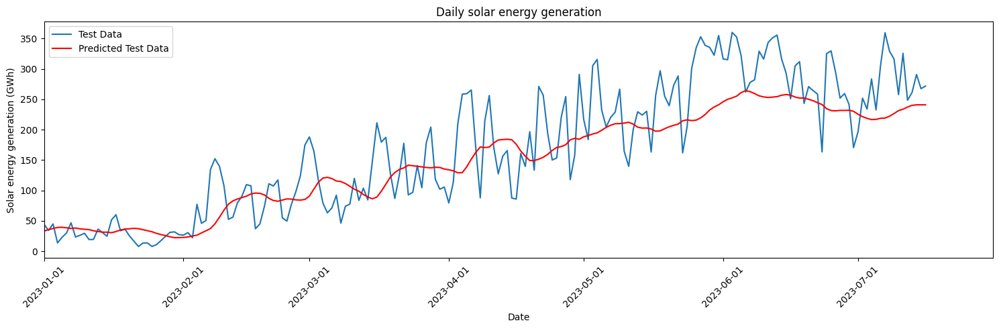

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 12, 64)            16896     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1) (3107, 12, 1) (3107, 1) (3119, 1)


In [41]:
# with SGD classifier
lookback=12
results = lstm_model_daily('Solar_gwh', df_daily, lookback) 

#### 30 days forecast on daily data

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/3467939555.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3089, 30, 1) (3089, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3089, 30, 1) (3089, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1)
Before model fitting
X_test_lstm =  (648, 30, 1)
y_test_lstm =  (648, 1)
X_train_lstm =  (2471, 30, 1)
y_train_lstm =  (2471, 1)


Epoch 1/700
50/50 [==============================] - 2s 18ms/step - loss: 0.1136 - val_loss: 0.1886
Epoch 2/700
50/50 [==============================] - 1s 17ms/step - loss: 0.0931 - val_loss: 0.1638
Epoch 3/700
50/50 [==============================] - 1s 22ms/step - loss: 0.0776 - val_loss: 0.1451
Epoch 4/700
50/50 [==============================] - 1s 17ms/step - loss: 0.0662 - val_loss: 0.1306
Epoch 5/700
50/50 [==============================] - 1s 21ms/step - loss: 0.0579 - val_loss: 0.1191
Epoch 6/700
50/50 [==============================] - 2s 32ms/step - loss: 0.0516 - val_loss: 0.1103
Epoch 7/700
50/50 [==============================] - 1s 20ms/step - loss: 0.0470 - val_loss: 0.1032
Epoch 8/700
50/50 [==============================] - 1s 18ms/step - loss: 0.0436 - val_loss: 0.0976
Epoch 9/700
50/50 [==============================] - 1s 16ms/step - loss: 0.0410 - val_loss: 0.0930
Epoch 10/700
50/50 [==============================] - 1s 15ms/step - loss: 0.0390 - val_loss: 0.0895

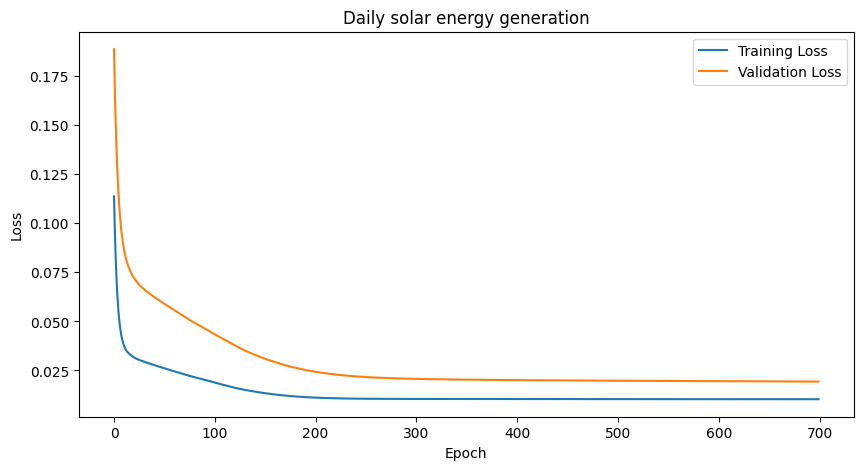

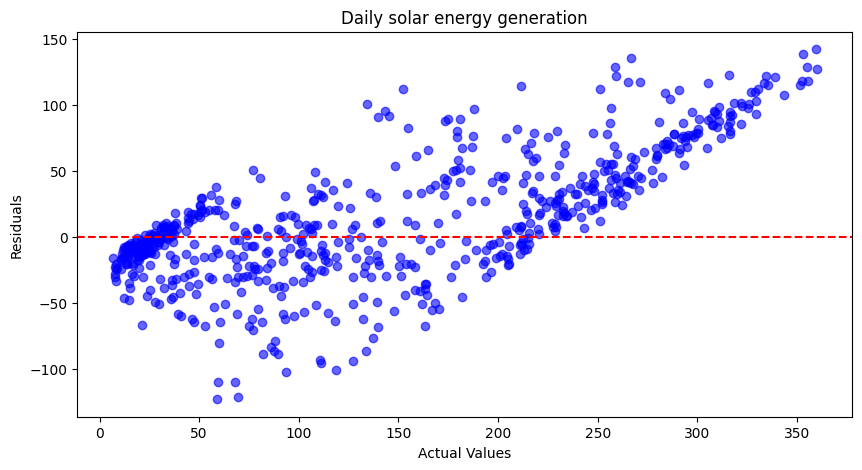

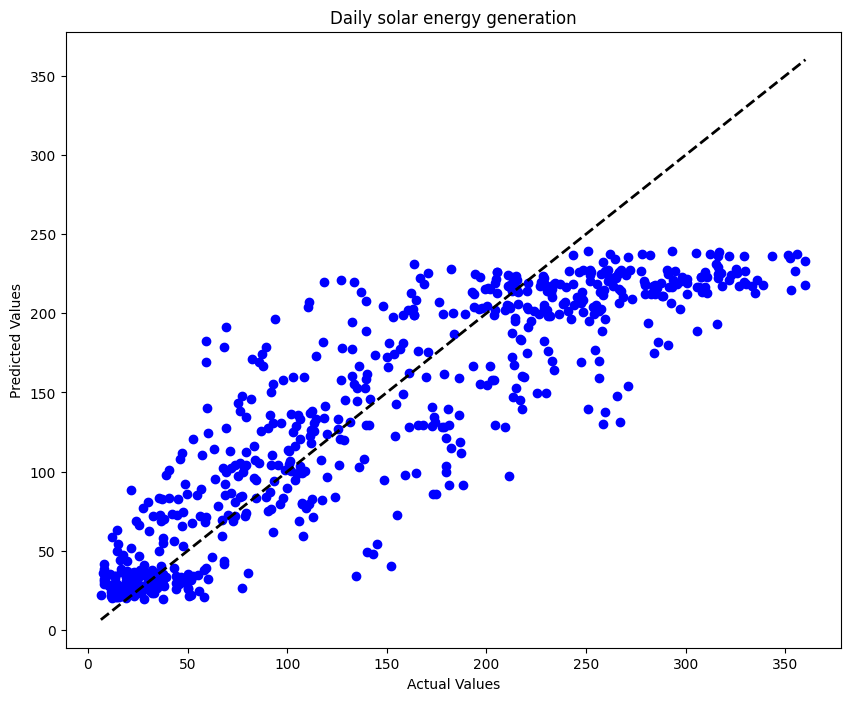

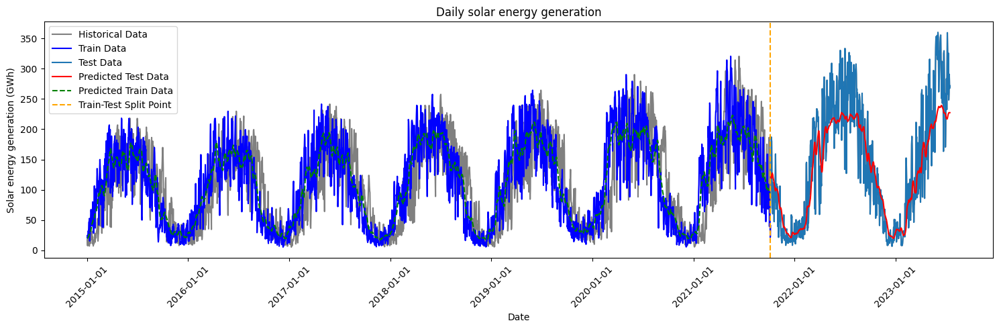

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_72 (LSTM)              (None, 30, 64)            16896     
                                                                 
 lstm_73 (LSTM)              (None, 32)                12416     
                                                                 
 dense_36 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1) (3089, 30, 1) (3089, 1) (3119, 1)


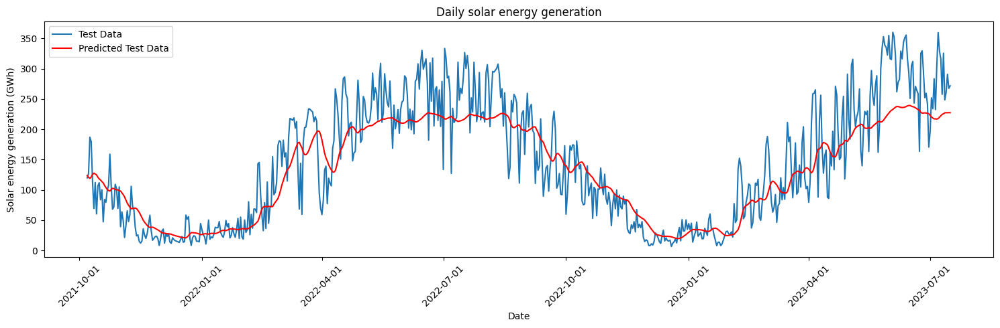

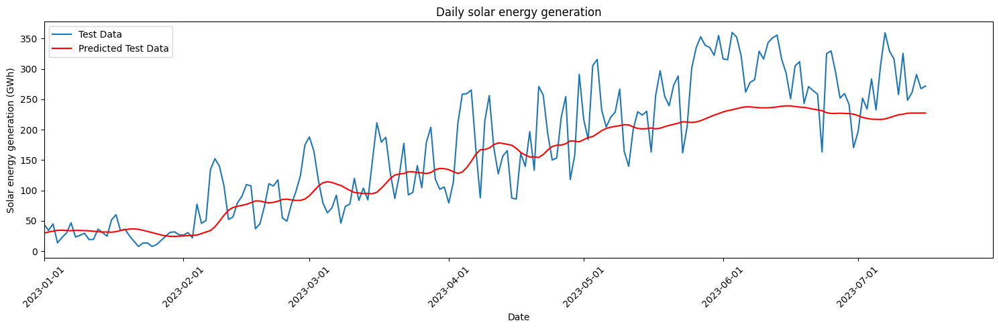

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_72 (LSTM)              (None, 30, 64)            16896     
                                                                 
 lstm_73 (LSTM)              (None, 32)                12416     
                                                                 
 dense_36 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1) (3089, 30, 1) (3089, 1) (3119, 1)


In [148]:
# with SGD classifier
lookback=30
results = lstm_model_daily('Solar_gwh', df_daily, lookback) 

#### 60 days forecast on daily data

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/3467939555.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3059, 60, 1) (3059, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3059, 60, 1) (3059, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1)
Before model fitting
X_test_lstm =  (672, 60, 1)
y_test_lstm =  (672, 1)
X_train_lstm =  (2447, 60, 1)
y_train_lstm =  (2447, 1)


Epoch 1/700
49/49 [==============================] - 3s 29ms/step - loss: 0.1395 - val_loss: 0.2241
Epoch 2/700
49/49 [==============================] - 1s 25ms/step - loss: 0.1145 - val_loss: 0.1955
Epoch 3/700
49/49 [==============================] - 1s 27ms/step - loss: 0.0967 - val_loss: 0.1744
Epoch 4/700
49/49 [==============================] - 1s 26ms/step - loss: 0.0838 - val_loss: 0.1583
Epoch 5/700
49/49 [==============================] - 1s 26ms/step - loss: 0.0742 - val_loss: 0.1456
Epoch 6/700
49/49 [==============================] - 1s 26ms/step - loss: 0.0669 - val_loss: 0.1353
Epoch 7/700
49/49 [==============================] - 1s 29ms/step - loss: 0.0612 - val_loss: 0.1271
Epoch 8/700
49/49 [==============================] - 1s 28ms/step - loss: 0.0566 - val_loss: 0.1203
Epoch 9/700
49/49 [==============================] - 1s 30ms/step - loss: 0.0530 - val_loss: 0.1146
Epoch 10/700
49/49 [==============================] - 1s 27ms/step - loss: 0.0501 - val_loss: 0.1098

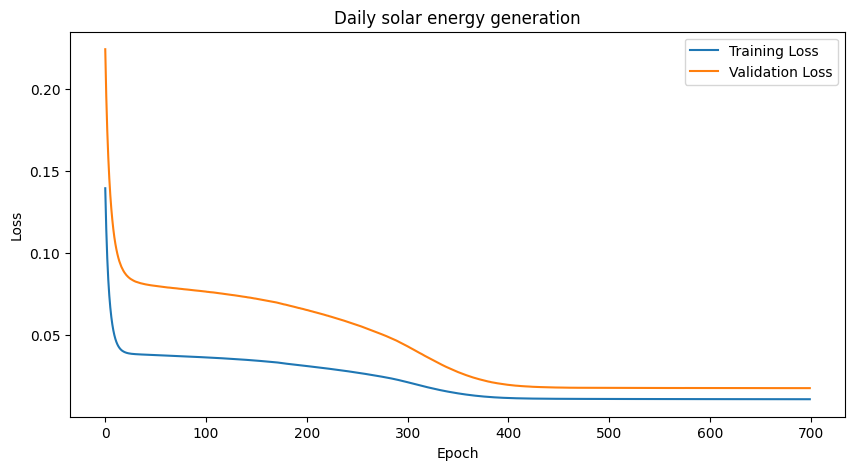

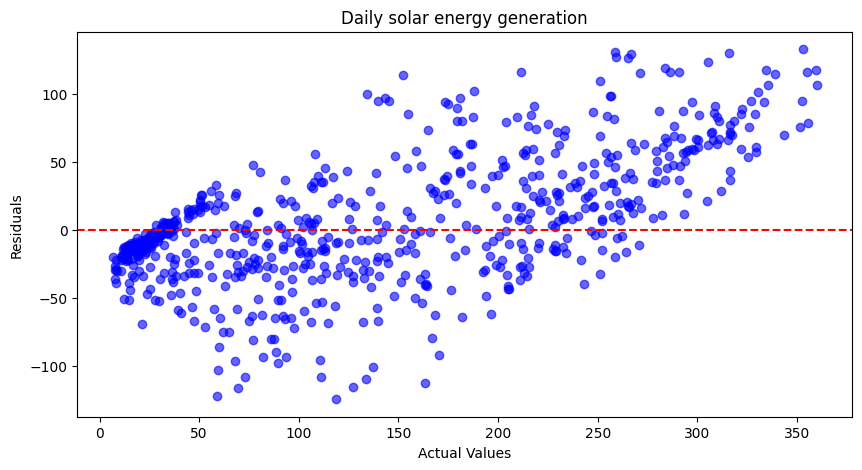

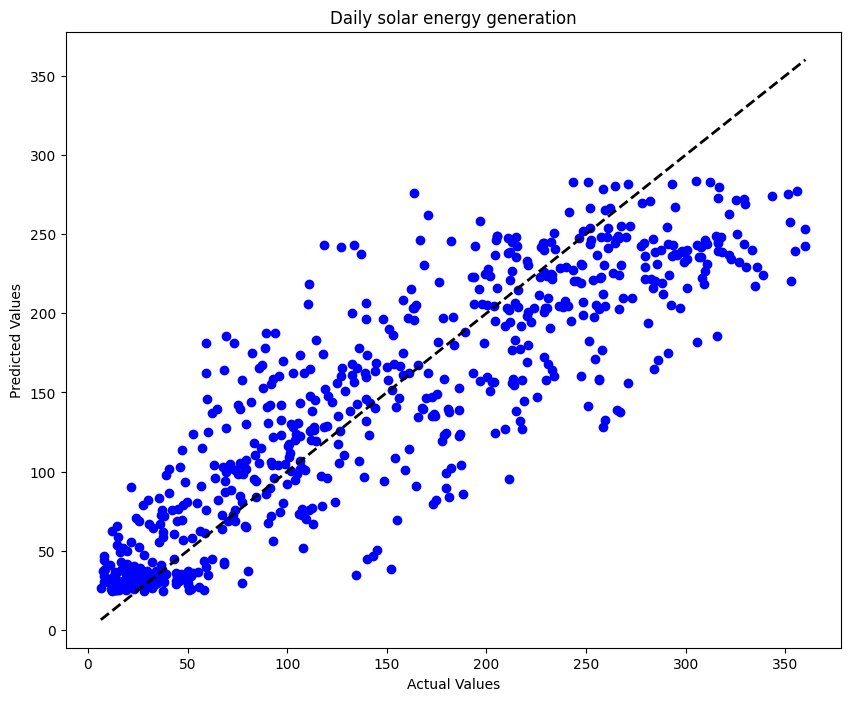

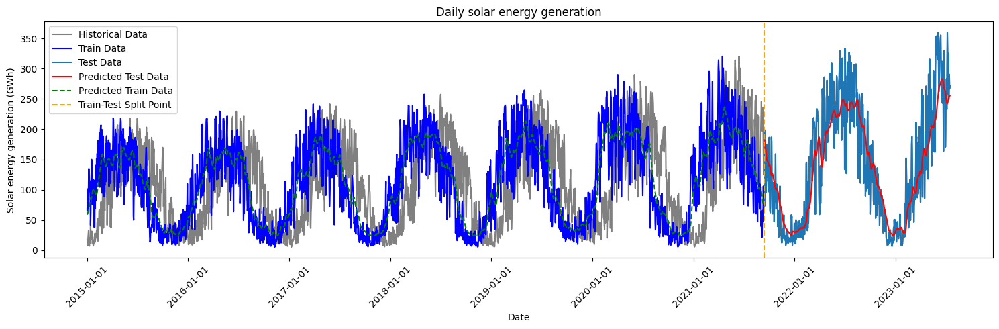

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_74 (LSTM)              (None, 60, 64)            16896     
                                                                 
 lstm_75 (LSTM)              (None, 32)                12416     
                                                                 
 dense_37 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1) (3059, 60, 1) (3059, 1) (3119, 1)


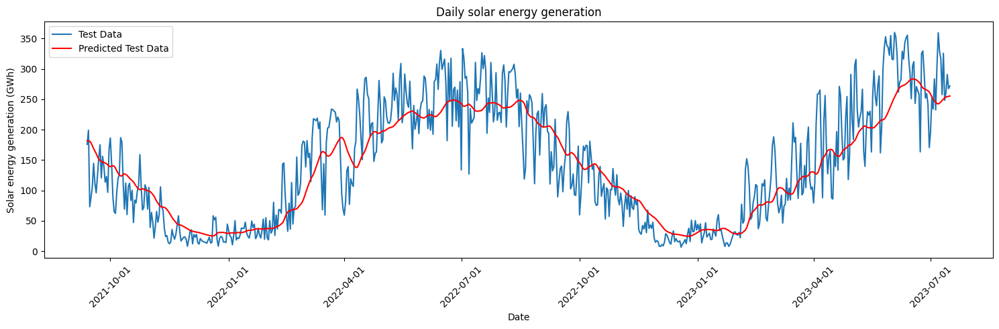

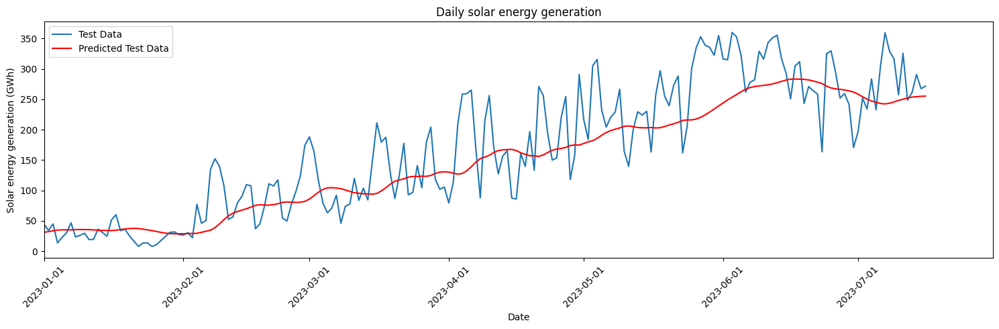

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_74 (LSTM)              (None, 60, 64)            16896     
                                                                 
 lstm_75 (LSTM)              (None, 32)                12416     
                                                                 
 dense_37 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1) (3059, 60, 1) (3059, 1) (3119, 1)


In [149]:
# with SGD classifier
lookback=60
results = lstm_model_daily('Solar_gwh', df_daily, lookback) 

#### 12 days forecast on daily data  

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/2738456736.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3107, 12, 1) (3107, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3107, 12, 1) (3107, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1)
Before model fitting
X_test_lstm =  (634, 12, 1)
y_test_lstm =  (634, 1)
X_train_lstm =  (2485, 12, 1)
y_train_lstm =  (2485, 1)


Epoch 1/800
50/50 [==============================] - 2s 18ms/step - loss: 0.1281 - val_loss: 0.2009
Epoch 2/800
50/50 [==============================] - 1s 14ms/step - loss: 0.0956 - val_loss: 0.1558
Epoch 3/800
50/50 [==============================] - 1s 11ms/step - loss: 0.0676 - val_loss: 0.1034
Epoch 4/800
50/50 [==============================] - 1s 11ms/step - loss: 0.0365 - val_loss: 0.0429
Epoch 5/800
50/50 [==============================] - 0s 9ms/step - loss: 0.0157 - val_loss: 0.0203
Epoch 6/800
50/50 [==============================] - 0s 9ms/step - loss: 0.0127 - val_loss: 0.0188
Epoch 7/800
50/50 [==============================] - 0s 8ms/step - loss: 0.0119 - val_loss: 0.0186
Epoch 8/800
50/50 [==============================] - 0s 8ms/step - loss: 0.0114 - val_loss: 0.0191
Epoch 9/800
50/50 [==============================] - 0s 9ms/step - loss: 0.0112 - val_loss: 0.0188
Epoch 10/800
50/50 [==============================] - 0s 10ms/step - loss: 0.0111 - val_loss: 0.0179
Epoc

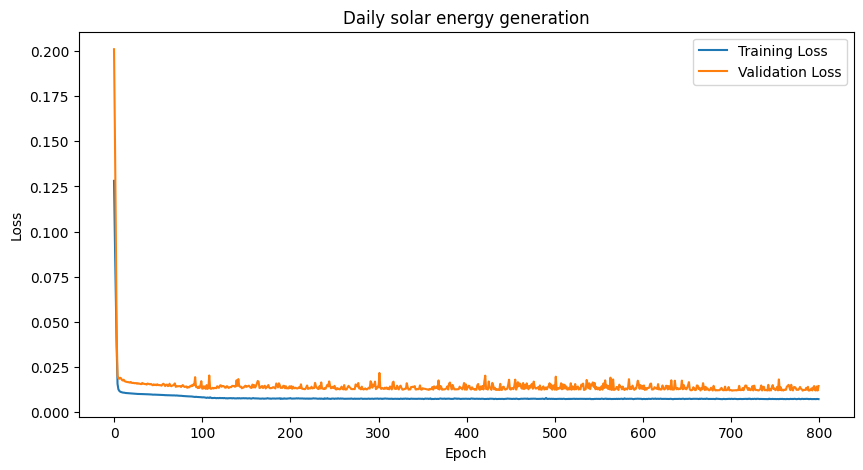

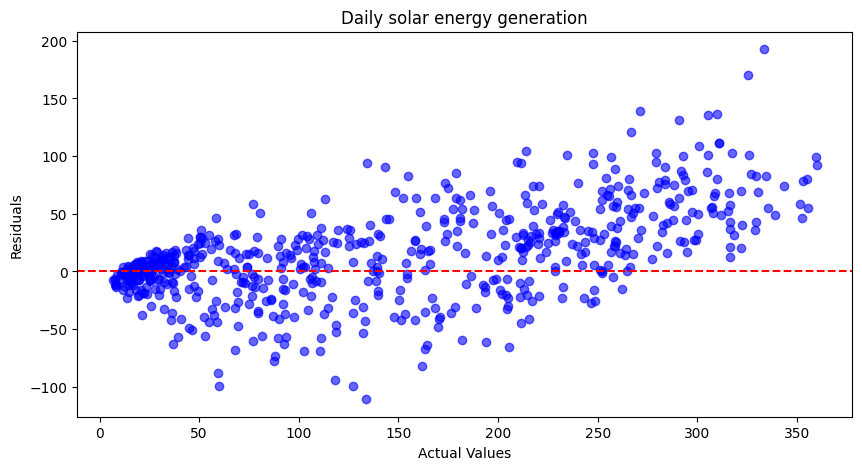

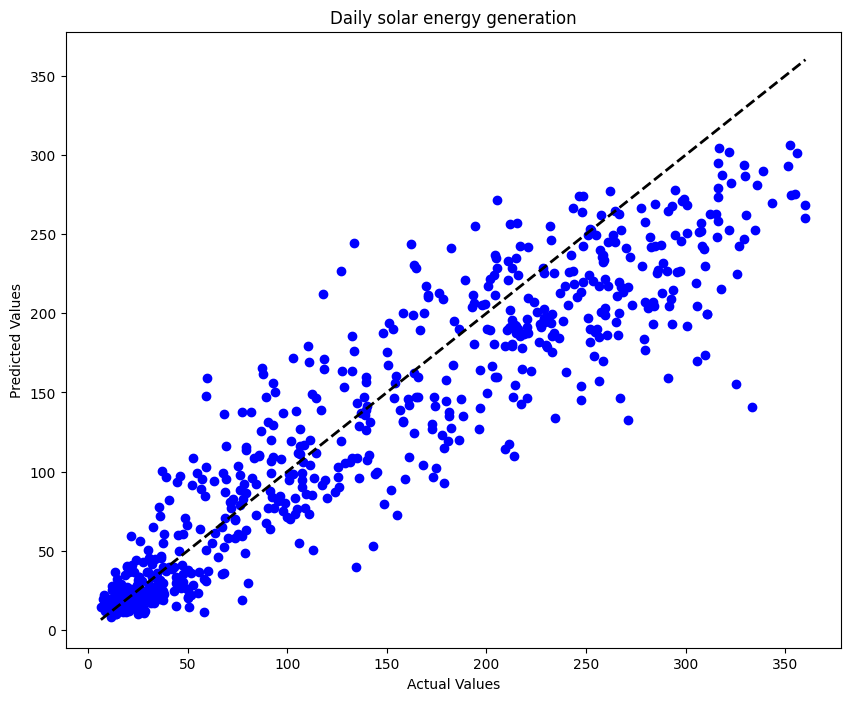

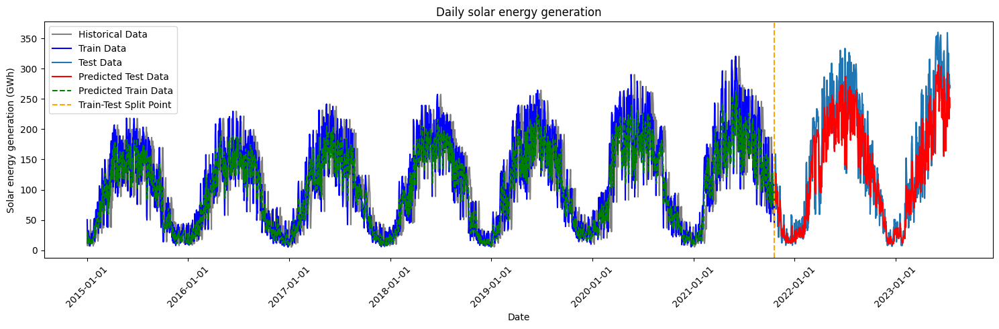

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_60 (LSTM)              (None, 12, 64)            16896     
                                                                 
 lstm_61 (LSTM)              (None, 32)                12416     
                                                                 
 dense_30 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1) (3107, 12, 1) (3107, 1) (3119, 1)


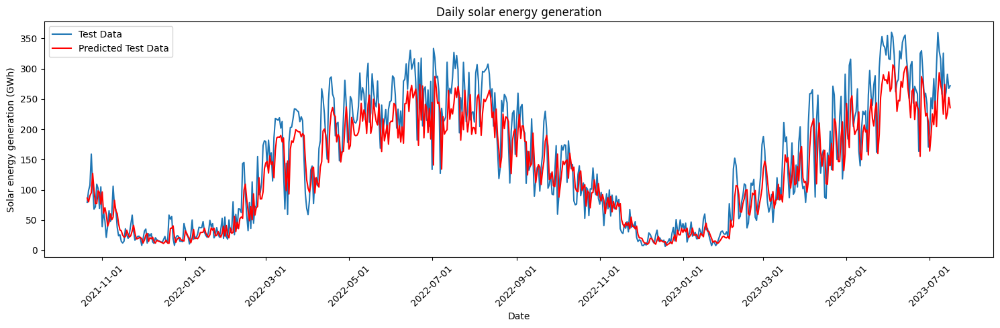

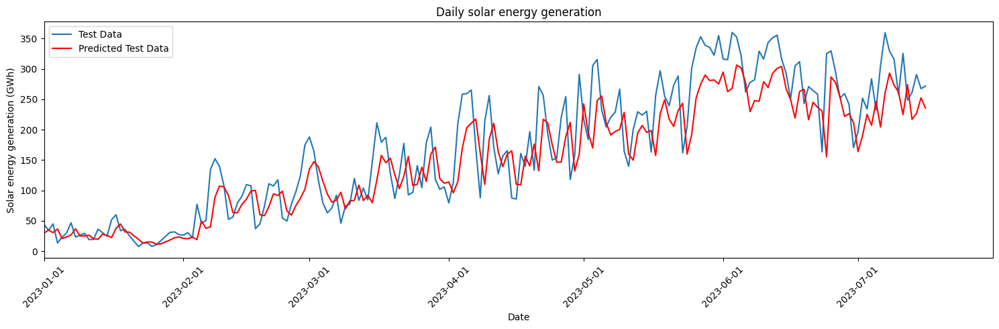

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_60 (LSTM)              (None, 12, 64)            16896     
                                                                 
 lstm_61 (LSTM)              (None, 32)                12416     
                                                                 
 dense_30 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1) (3107, 12, 1) (3107, 1) (3119, 1)


In [132]:
#with ADM (no momentum)
lookback=12
results = lstm_model_daily('Solar_gwh', df_daily, lookback) 

#### 12 days forecast on daily data

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/1457666154.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3107, 12, 1) (3107, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3107, 12, 1) (3107, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1)
Before model fitting
X_test_lstm =  (634, 12, 1)
y_test_lstm =  (634, 1)
X_train_lstm =  (2485, 12, 1)
y_train_lstm =  (2485, 1)
Epoch 1/800
50/50 [==============================] - 2s 14ms/step - loss: 0.1327 - val_loss: 0.2216
Epoch 2/800
50/50 [==============================] - 0s 8ms/step - loss: 0.1129 - val_loss: 0.1932
Epoch 3/800
50/50 [==============================] - 0s 8ms/step - loss: 0.0931 - val_loss: 0.1553
Epoch 4/800
50/50 [==============

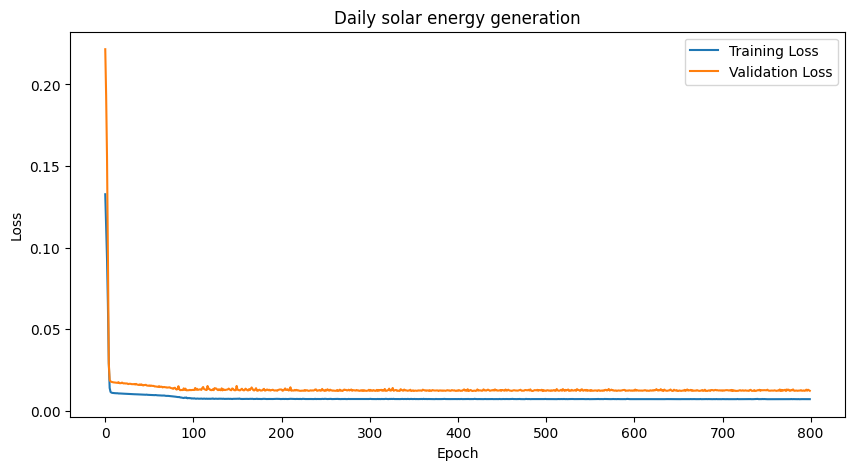

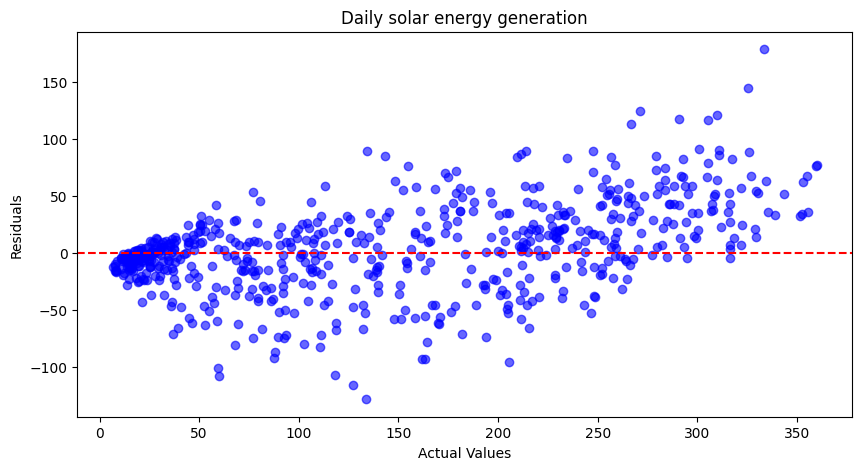

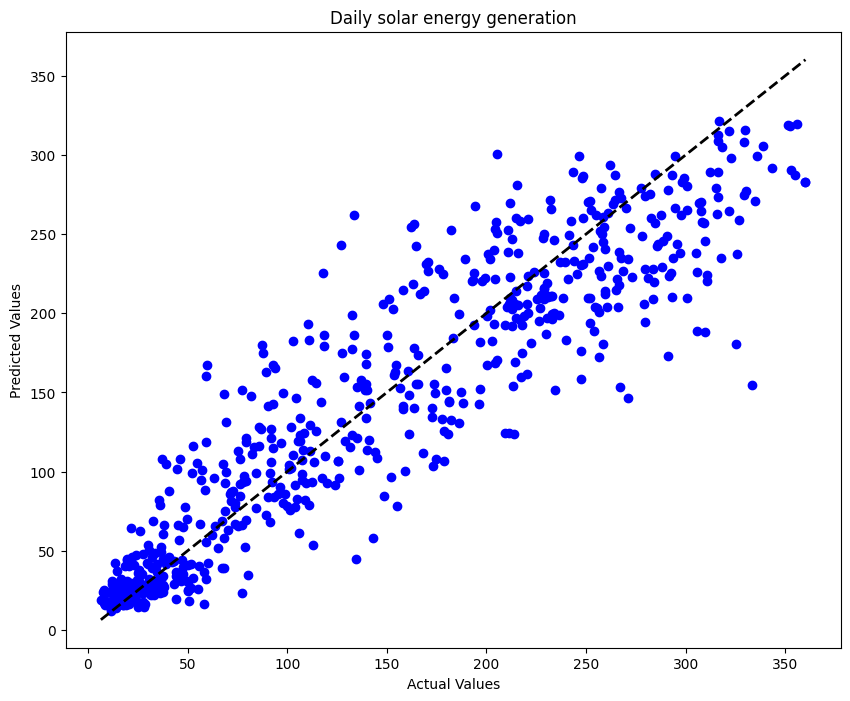

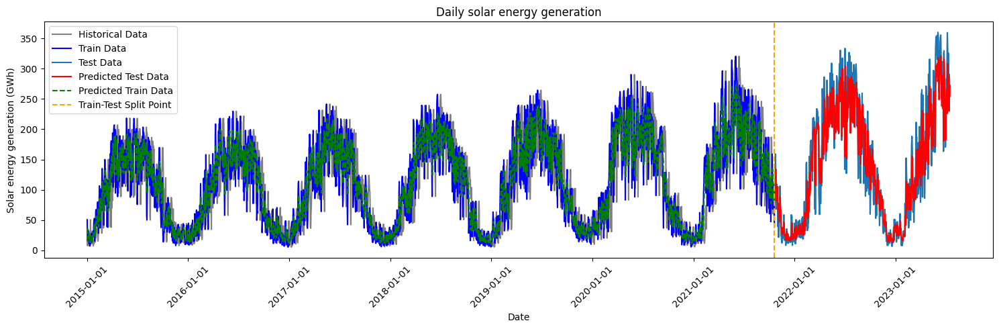

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_62 (LSTM)              (None, 12, 64)            16896     
                                                                 
 lstm_63 (LSTM)              (None, 32)                12416     
                                                                 
 dense_31 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1) (3107, 12, 1) (3107, 1) (3119, 1)


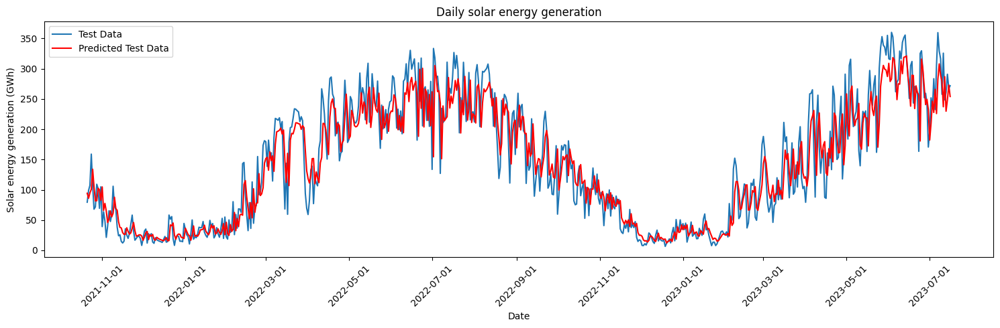

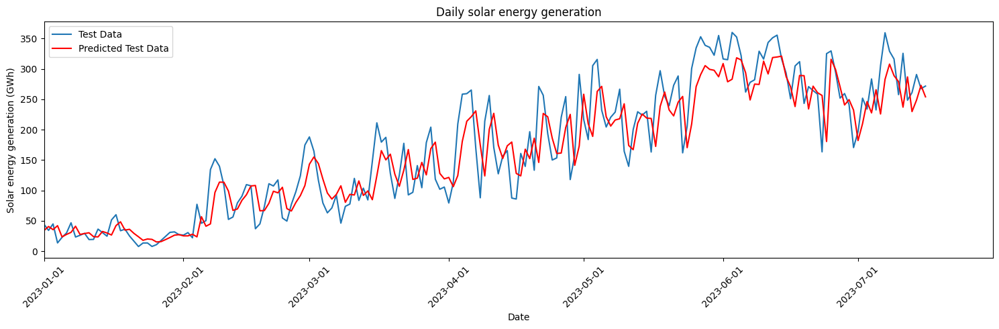

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_62 (LSTM)              (None, 12, 64)            16896     
                                                                 
 lstm_63 (LSTM)              (None, 32)                12416     
                                                                 
 dense_31 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2485, 12, 1) (634, 12, 1) (2485, 1) (634, 1) (3107, 12, 1) (3107, 1) (3119, 1)


In [134]:
#with ADM (momentum =0.9999)
lookback=12
results = lstm_model_daily('Solar_gwh', df_daily, lookback)

#### 30 days forecast on daily data

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/1457666154.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3089, 30, 1) (3089, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3089, 30, 1) (3089, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1)
Before model fitting
X_test_lstm =  (648, 30, 1)
y_test_lstm =  (648, 1)
X_train_lstm =  (2471, 30, 1)
y_train_lstm =  (2471, 1)
Epoch 1/800
50/50 [==============================] - 3s 24ms/step - loss: 0.0951 - val_loss: 0.1325
Epoch 2/800
50/50 [==============================] - 1s 17ms/step - loss: 0.0441 - val_loss: 0.0328
Epoch 3/800
50/50 [==============================] - 1s 15ms/step - loss: 0.0139 - val_loss: 0.0196
Epoch 4/800
50/50 [============

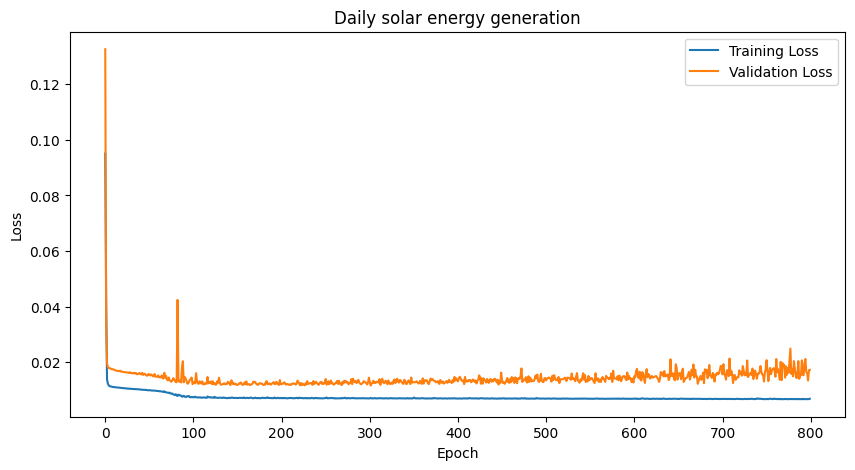

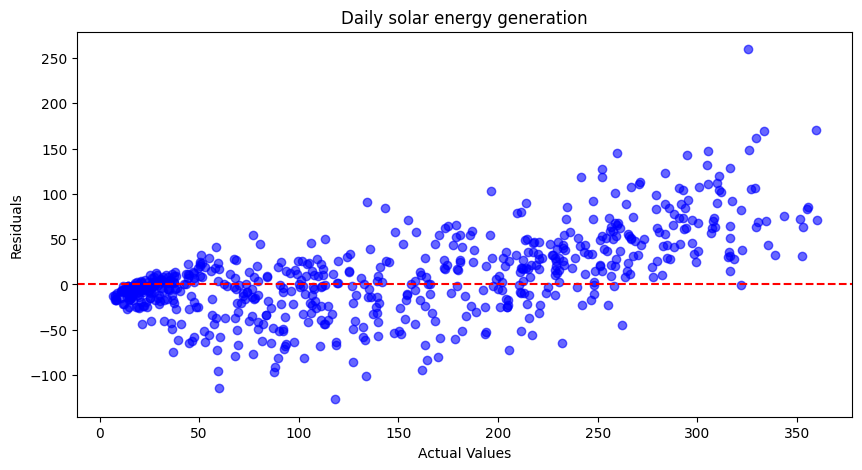

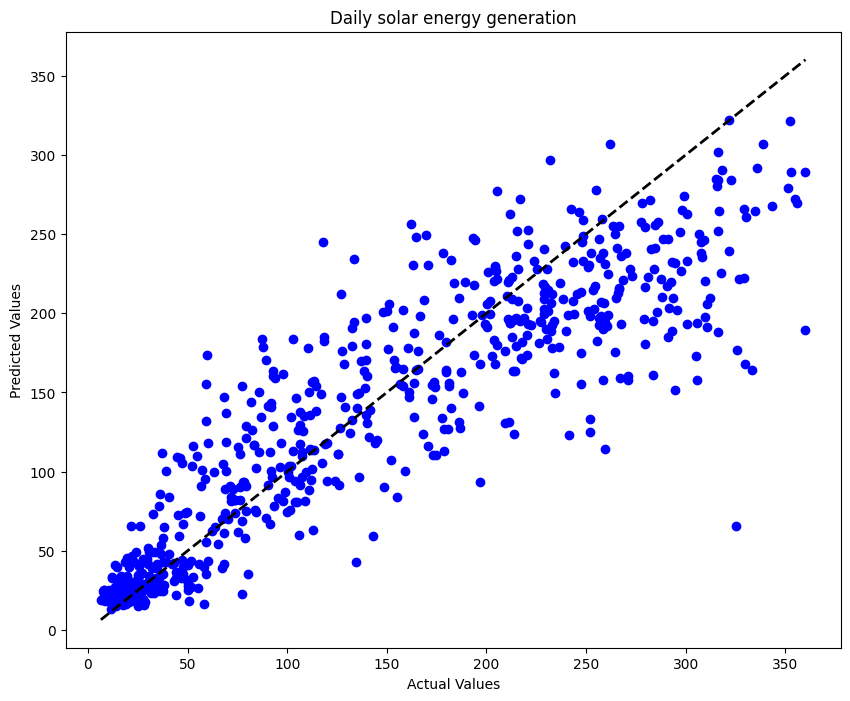

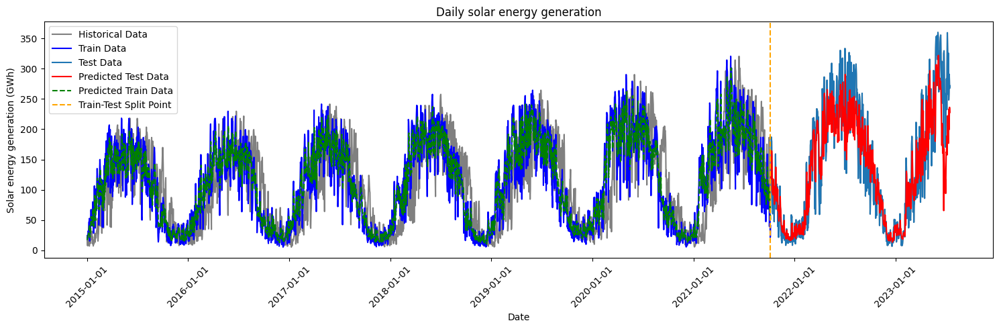

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_66 (LSTM)              (None, 30, 64)            16896     
                                                                 
 lstm_67 (LSTM)              (None, 32)                12416     
                                                                 
 dense_33 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1) (3089, 30, 1) (3089, 1) (3119, 1)


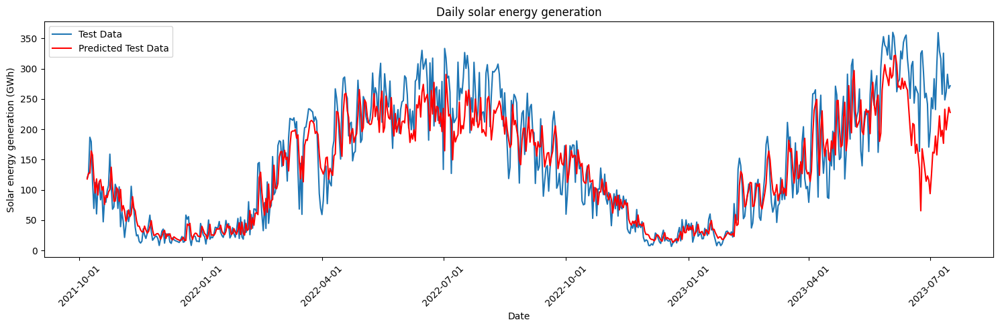

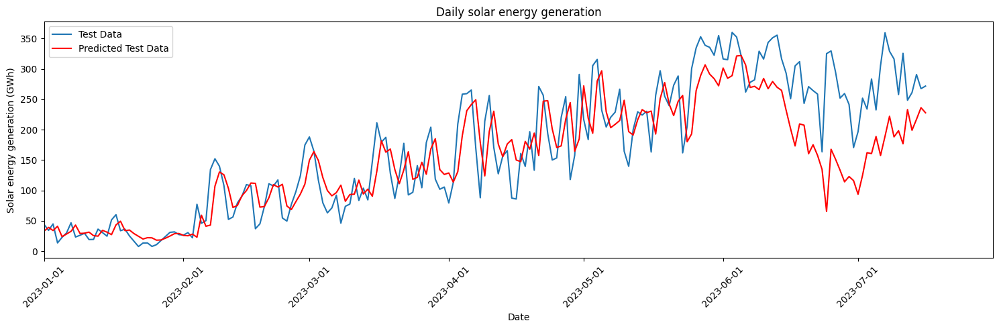

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_66 (LSTM)              (None, 30, 64)            16896     
                                                                 
 lstm_67 (LSTM)              (None, 32)                12416     
                                                                 
 dense_33 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2471, 30, 1) (648, 30, 1) (2471, 1) (648, 1) (3089, 30, 1) (3089, 1) (3119, 1)


In [142]:
#with ADM (momentum =0.9999)
lookback=30
results = lstm_model_daily('Solar_gwh', df_daily, lookback)

#### 60 days forecast on daily data

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/2606773579.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3059, 60, 1) (3059, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1)
data_df_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 34) (3119, 1) (3059, 60, 1) (3059, 1) 3119
X_train_lstm_shape, X_test_lstm_shape, y_train_lstm_shape, y_test_lstm_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1)
Before model fitting
X_test_lstm =  (672, 60, 1)
y_test_lstm =  (672, 1)
X_train_lstm =  (2447, 60, 1)
y_train_lstm =  (2447, 1)


Epoch 1/700
49/49 [==============================] - 3s 32ms/step - loss: 0.1085 - val_loss: 0.1601
Epoch 2/700
49/49 [==============================] - 1s 28ms/step - loss: 0.0694 - val_loss: 0.0838
Epoch 3/700
49/49 [==============================] - 1s 30ms/step - loss: 0.0237 - val_loss: 0.0199
Epoch 4/700
49/49 [==============================] - 2s 32ms/step - loss: 0.0124 - val_loss: 0.0205
Epoch 5/700
49/49 [==============================] - 1s 30ms/step - loss: 0.0118 - val_loss: 0.0198
Epoch 6/700
49/49 [==============================] - 1s 30ms/step - loss: 0.0115 - val_loss: 0.0183
Epoch 7/700
49/49 [==============================] - 2s 31ms/step - loss: 0.0113 - val_loss: 0.0188
Epoch 8/700
49/49 [==============================] - 2s 31ms/step - loss: 0.0112 - val_loss: 0.0176
Epoch 9/700
49/49 [==============================] - 1s 30ms/step - loss: 0.0111 - val_loss: 0.0176
Epoch 10/700
49/49 [==============================] - 2s 32ms/step - loss: 0.0110 - val_loss: 0.0172

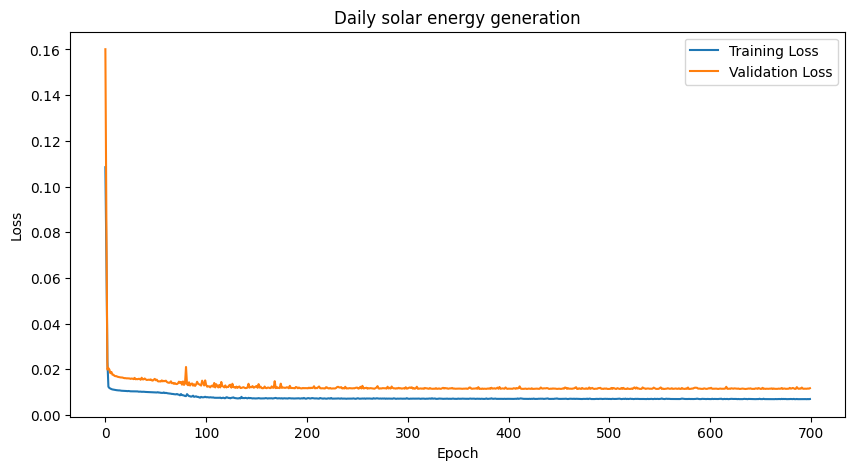

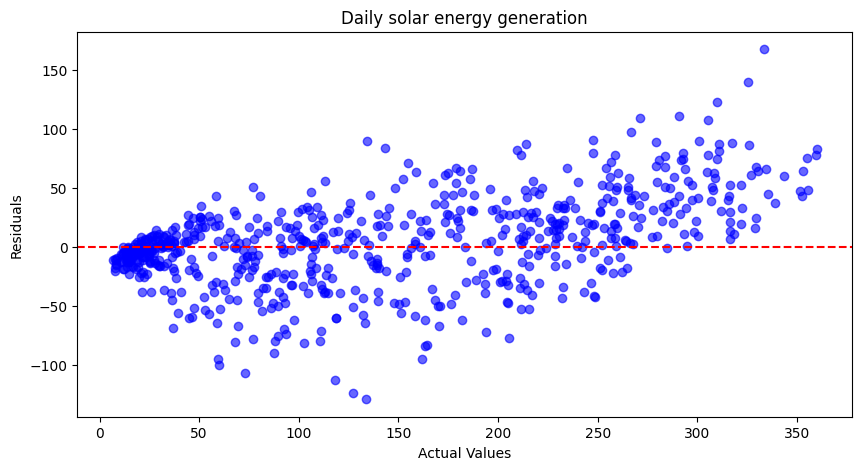

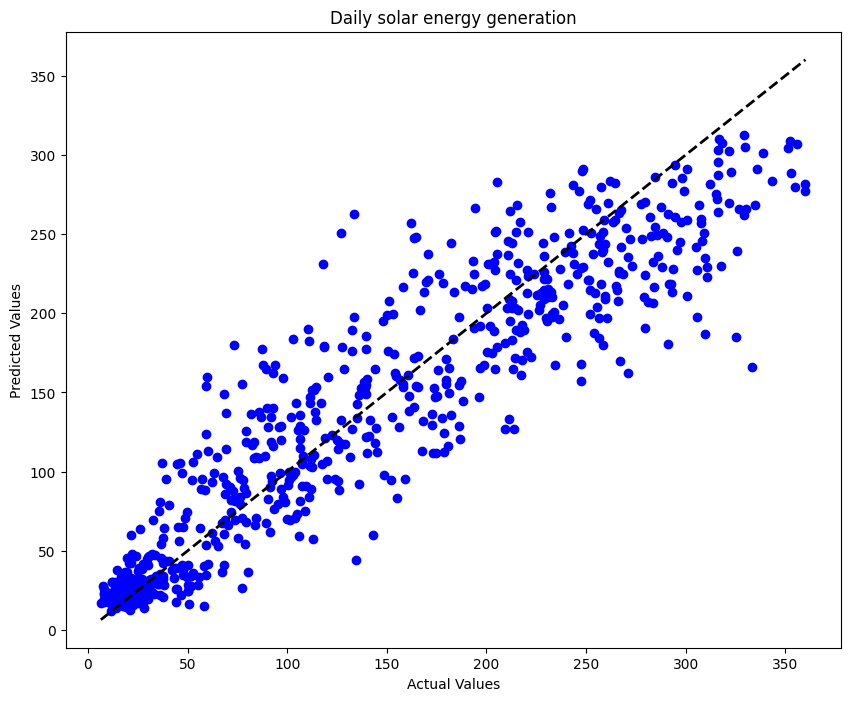

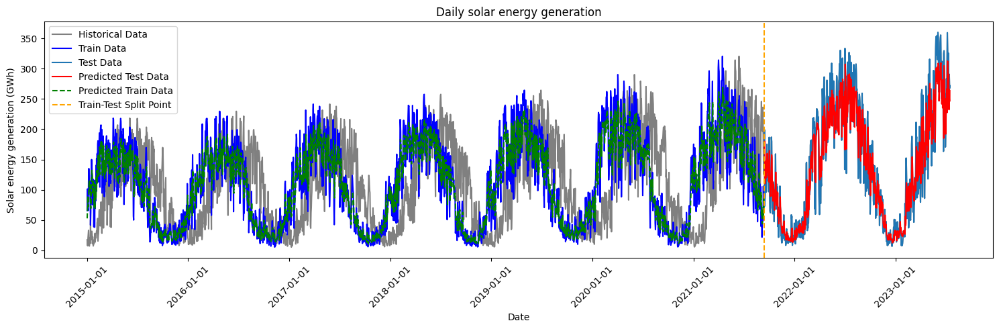

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_68 (LSTM)              (None, 60, 64)            16896     
                                                                 
 lstm_69 (LSTM)              (None, 32)                12416     
                                                                 
 dense_34 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1) (3059, 60, 1) (3059, 1) (3119, 1)


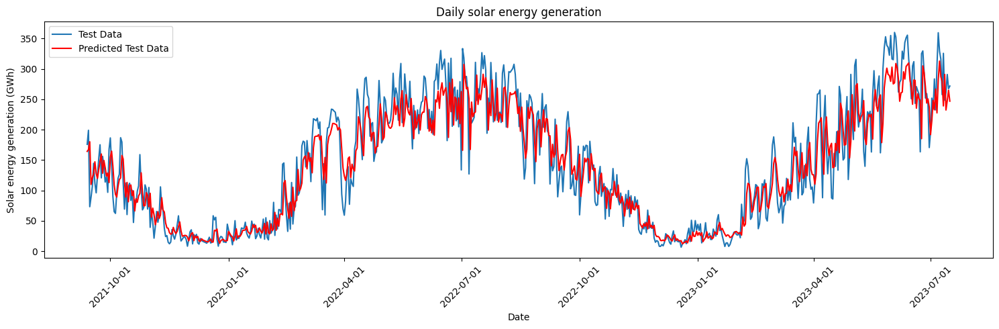

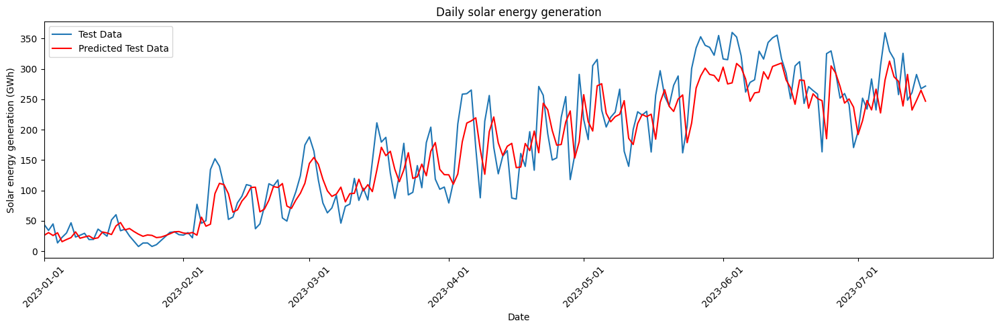

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_68 (LSTM)              (None, 60, 64)            16896     
                                                                 
 lstm_69 (LSTM)              (None, 32)                12416     
                                                                 
 dense_34 (Dense)            (None, 1)                 33        
                                                                 
Total params: 29345 (114.63 KB)
Trainable params: 29345 (114.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
X_train_lstm.shape, X_test_lstm.shape, y_train_lstm.shape, y_test_lstm.shape, X_lstm.shape, y_lstm.shape, df_shape = (2447, 60, 1) (672, 60, 1) (2447, 1) (672, 1) (3059, 60, 1) (3059, 1) (3119, 1)


In [145]:
#with ADM (momentum =0.9999)
lookback=60
results = lstm_model_daily('Solar_gwh', df_daily, lookback)

##  Multivariate  LSTM for daily solar energy generation in Germany

In [150]:
def create_sequences(data, target, lookback):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:i+lookback, :-1])  # Features
        y.append(data[i+lookback-1, -1])   # Target
    return np.array(X), np.array(y)

def lstm_mlvt_model_daily(target, data_mlvt, features, lookback):


    target_label = target.replace('_gwh', ' energy generation (GWh)').replace('_', ' ')
#    main_target = target.replace('_', ' ').replace('gwh', '(monthly)')
    main_target = 'Daily solar energy generation' #target.replace('_', ' ').replace('gwh', '(monthly)')
    

    dfs = data_mlvt[['Date'] + features + [target]]
    dfs['Date'] = pd.to_datetime(dfs['Date'])
    dfs.set_index('Date', inplace=True)

    # Separate target and features
    target_data = dfs[[target]].values
    feature_data = dfs[features].values

    # Scale features and target separately
    scaler_features = MinMaxScaler(feature_range=(0, 1))
    scaler_target = MinMaxScaler(feature_range=(0, 1))

    feature_scaled = scaler_features.fit_transform(feature_data)
    target_scaled = scaler_target.fit_transform(target_data)

    # Create sequences with scaled data
    data_scaled = np.hstack((feature_scaled, target_scaled))
    X_lstm, y_lstm = create_sequences(data_scaled, target_scaled, lookback)  # Pass target_scaled to create_sequences


    print('data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]=',data_mlvt.shape, data_scaled.shape, X_lstm.shape, y_lstm.shape, X_lstm.shape[0]+X_lstm.shape[1])
    print('X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape =',X_lstm.shape, X_lstm.shape, y_lstm.shape, y_lstm.shape)


     
    # Build the simple LSTM model
    model = Sequential()
    model.add(LSTM(units=64, activation='relu', input_shape=(lookback, len(features)), return_sequences=True))
    model.add(LSTM(units=32, activation='relu'))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam')
    history = model.fit(X_lstm, y_lstm, epochs=400, batch_size=50, validation_split=0.2, verbose=1)


    #optimizer = Adam(learning_rate = 0.0001, beta_1 = 0.0, beta_2 = 0.0)
    #optimizer = Adam(learning_rate = 0.0001, beta_1 = 0.9, beta_2 = 0.9999999)
    #optimizer = SGD(learning_rate = 0.0001, momentum = 0.9)
    #model = Sequential()
    #model.add(LSTM(units=64, activation='relu', input_shape=(lookback, 1), return_sequences=True))
    #model.add(LSTM(units=32, activation='relu'))
    #model.add(Dense(1))
    #model.compile(loss='mse', optimizer='adam')
    #model.compile(loss='mse', optimizer= optimizer)
    #history = model.fit(X_lstm, y_lstm, epochs=100, batch_size=50, validation_split=0.2, verbose=1)
    #print(model.summary())



    # LSTM prediction on test and train data
    y_pred_lstm = model.predict(X_lstm)

    # Reshape y_pred_lstm to 1-dimensional array
    y_pred_lstm = y_pred_lstm.reshape(-1)

    # Inverse transform the scaled data to get the original scale
    y_pred_lstm = scaler_target.inverse_transform(y_pred_lstm.reshape(-1, 1)).flatten()
    y_lstm = scaler_target.inverse_transform(y_lstm.reshape(-1, 1)).flatten()

    # Calculate residuals
    residuals = y_lstm - y_pred_lstm

    # Print shapes after inverse transform
    print("Shapes after inverse transform:")
    print("y_pred_lstm shape:", y_pred_lstm.shape)
    print("y_lstm shape:", y_lstm.shape)

    # Calculate metrics
    mse = mean_squared_error(y_lstm, y_pred_lstm)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_lstm, y_pred_lstm)
    r2 = r2_score(y_lstm, y_pred_lstm)

    # Print metrics
    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("Mean Absolute Error (MAE):", mae)
    print("R-squared (R^2) Score:", r2)

    # Plot loss versus epoch and validation loss versus epoch
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Daily solar energy generation')
    plt.legend()
    plt.show()

    # Create a residual plot
    plt.figure(figsize=(10, 5))
    plt.scatter(y_lstm, residuals, color='blue', alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Values')
    plt.ylabel('Residuals')
    plt.title(main_target)
    plt.show()

    plt.figure(figsize=(10, 8))
    plt.scatter(y_lstm, y_pred_lstm, label=' ', color='blue', alpha=0.7)
    plt.plot([y_lstm.min(), y_lstm.max()], [y_lstm.min(), y_lstm.max()], 'k--', lw=2, label='')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(main_target)
    #plt.title('Actual vs. Predicted Values')
    #plt.legend(loc='upper left')
   # plt.grid(True)
    plt.show()



    # Plot actual vs. predicted values with time (including test data only)
    test_index = dfs.index[-len(y_lstm):]
    plt.figure(figsize=(10, 8))
    plt.plot(test_index, y_lstm, label='Test Data', color='#1f76b4')
    plt.plot(test_index, y_pred_lstm, label='Predicted Test Data', color='red')
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    #plt.xticks([])
    plt.title(main_target)
    plt.ylabel(target_label)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    #print(model.summary())
 #   # Plot actual vs. predicted values with time
 #   plt.figure(figsize=(10, 8))
 #   plt.scatter(dfs.index[-len(y_lstm):], y_lstm, label='True Values', color='blue')
 #   plt.scatter(dfs.index[-len(y_pred_lstm):], y_pred_lstm, label='Predicted Values', color='orange')
 #   plt.xlabel('Date')
 #   plt.ylabel(target)
 #   plt.title(target)
 #   plt.legend()
 #   plt.show()


##### Merging the daily energy generation data  with weather informations

In [151]:
start_date= '2015-01-01'
end_date = '2023-07-16'

weather_July = df_weather_daily_10loc[(df_weather_daily_10loc['Date'] >= start_date) & (df_weather_daily_10loc['Date'] <= end_date)]
# Create a new DataFrame with the filtered data and only the required columns

weather_July_df = pd.DataFrame(weather_July)
weather_July_df.reset_index(drop=True, inplace=True)


In [152]:
weather_July_df.shape, df_daily.shape#weather_July_df.head()

((3119, 87), (3119, 37))

In [153]:
 df_daily.columns

Index(['Dt_date_hour', 'Biomass_mwh', 'Fossil_brown_coal_mwh',
       'Fossil_coal_derived_gas_mwh', 'Fossil_gas_mwh', 'Fossil_hard_coal_mwh',
       'Fossil_oil_mwh', 'Fossil_oil_shale_mwh', 'Fossil_peat_mwh',
       'Geothermal_mwh', 'Hydro_pumped_storage_aggregated_mwh',
       'Hydro_pumped_storage_consumption_mwh',
       'Hydro_run_of_river_and_poundage_mwh', 'Hydro_water_reservoir_mwh',
       'Marine_mwh', 'Nuclear_mwh', 'Other_mwh', 'Other_renewable_mwh',
       'Solar_mwh', 'Waste_mwh', 'Wind_offshore_mwh', 'Wind_onshore_mwh',
       'Total_energy_generation_mwh', 'Dt_year', 'Dt_month', 'Dt_week',
       'Dt_dayofweek', 'Dt_dayofmonth', 'Dt_dayofyear', 'Dt_monthname',
       'Dt_dayname', 'Date', 'Solar_gwh', 'Total_energy_generation_gwh',
       'Year', 'Month', 'Day'],
      dtype='object')

In [159]:
#df_weather_daily_10loc
#df_daily

#columns_keep_df_weather = ['Average_temp_c_mu', 'Norm_temp_c_mu',	'Max_temp_c_mu','Min_temp_c_mu', 'Sunshine_hour_mu', 'Precipitation_mm_mu', 'Average_wind_speed_mpers_mu']
columns_keep_df_daily = ['Date', 'Solar_gwh', 'Total_energy_generation_gwh']
daily_df_N = df_daily[columns_keep_df_daily].copy()

columns_keep_df_weather_daily = ['Date','Average_wind_speed_mpers_mean_de', 'Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de','Sunshine_hour_mean_de', 'Precipitation_mm_mean_de']

weather_July_df_N = weather_July_df[columns_keep_df_weather_daily].copy()

In [157]:
daily_df_N.head()

,Date,Solar_gwh,Total_energy_generation_gwh
0,2015-01-01,17.08025,1271.68350
1,2015-01-02,7.75900,1493.59800
2,2015-01-03,7.23475,1408.94650
3,2015-01-04,19.98250,1325.84900
4,2015-01-05,26.52225,1521.12275


In [160]:
weather_July_df_N.head()

,Date,Average_wind_speed_mpers_mean_de,Average_temp_c_mean_de,Norm_temp_c_mean_de,Max_temp_c_mean_de,Min_temp_c_mean_de,Sunshine_hour_mean_de,Precipitation_mm_mean_de
0,2015-01-01,2.88,0.29,1.30,3.01,-2.42,3.22,1.37
1,2015-01-02,5.36,2.94,1.27,6.15,-0.80,0.61,4.59
2,2015-01-03,4.39,2.92,1.21,5.12,1.22,0.01,8.43
3,2015-01-04,4.29,2.52,1.36,4.69,0.82,2.15,0.19
4,2015-01-05,3.22,1.48,1.15,3.75,-0.56,2.49,0.15


In [165]:
daily_df_N['Date'] = pd.to_datetime(daily_df_N['Date'], format='%Y-%m-%d')
weather_July_df_N['Date'] = pd.to_datetime(weather_July_df_N['Date'], format='%Y-%m-%d')



In [167]:
weather_July_df_N.head()

,Date,Average_wind_speed_mpers_mean_de,Average_temp_c_mean_de,Norm_temp_c_mean_de,Max_temp_c_mean_de,Min_temp_c_mean_de,Sunshine_hour_mean_de,Precipitation_mm_mean_de
0,2015-01-01,2.88,0.29,1.30,3.01,-2.42,3.22,1.37
1,2015-01-02,5.36,2.94,1.27,6.15,-0.80,0.61,4.59
2,2015-01-03,4.39,2.92,1.21,5.12,1.22,0.01,8.43
3,2015-01-04,4.29,2.52,1.36,4.69,0.82,2.15,0.19
4,2015-01-05,3.22,1.48,1.15,3.75,-0.56,2.49,0.15


In [168]:
daily_df_N.head()

,Date,Solar_gwh,Total_energy_generation_gwh
0,2015-01-01,17.08025,1271.68350
1,2015-01-02,7.75900,1493.59800
2,2015-01-03,7.23475,1408.94650
3,2015-01-04,19.98250,1325.84900
4,2015-01-05,26.52225,1521.12275


In [166]:
# Merge the dataframes on the 'Date' column
daily_weather_df = weather_July_df_N.merge(daily_df_N, on=['Date'])

In [48]:
daily_weather_df.shape, daily_weather_df.columns

((3119, 82),
 Index(['Date', 'Average_temp_c_sc', 'Norm_temp_c_sc', 'Max_temp_c_sc',
        'Min_temp_c_sc', 'Sunshine_hour_sc', 'Precipitation_mm_sc',
        'Average_wind_speed_mpers_sc', 'Dt_date.1', 'Average_temp_c_hh',
        'Norm_temp_c_hh', 'Max_temp_c_hh', 'Min_temp_c_hh', 'Sunshine_hour_hh',
        'Precipitation_mm_hh', 'Average_wind_speed_mpers_hh', 'Dt_date.2',
        'Average_temp_c_bi', 'Norm_temp_c_bi', 'Max_temp_c_bi', 'Min_temp_c_bi',
        'Sunshine_hour_bi', 'Precipitation_mm_bi',
        'Average_wind_speed_mpers_bi', 'Dt_date.3', 'Average_temp_c_kb',
        'Norm_temp_c_kb', 'Max_temp_c_kb', 'Min_temp_c_kb', 'Sunshine_hour_kb',
        'Precipitation_mm_kb', 'Average_wind_speed_mpers_kb', 'Dt_date.4',
        'Average_temp_c_go', 'Norm_temp_c_go', 'Max_temp_c_go', 'Min_temp_c_go',
        'Sunshine_hour_go', 'Precipitation_mm_go',
        'Average_wind_speed_mpers_go', 'Dt_date.5', 'Average_temp_c_dr',
        'Norm_temp_c_dr', 'Max_temp_c_dr', 'Min_temp_c

In [169]:
daily_weather_df.head()

,Date,Average_wind_speed_mpers_mean_de,Average_temp_c_mean_de,Norm_temp_c_mean_de,Max_temp_c_mean_de,Min_temp_c_mean_de,Sunshine_hour_mean_de,Precipitation_mm_mean_de,Solar_gwh,Total_energy_generation_gwh
0,2015-01-01,2.88,0.29,1.30,3.01,-2.42,3.22,1.37,17.08025,1271.68350
1,2015-01-02,5.36,2.94,1.27,6.15,-0.80,0.61,4.59,7.75900,1493.59800
2,2015-01-03,4.39,2.92,1.21,5.12,1.22,0.01,8.43,7.23475,1408.94650
3,2015-01-04,4.29,2.52,1.36,4.69,0.82,2.15,0.19,19.98250,1325.84900
4,2015-01-05,3.22,1.48,1.15,3.75,-0.56,2.49,0.15,26.52225,1521.12275


In [170]:
#columns_mlvt_daily=  ['Date','Average_temp_c_mu', 'Norm_temp_c_mu', 'Max_temp_c_mu', 'Min_temp_c_mu', 'Sunshine_hour_mu', 'Precipitation_mm_mu', 'Average_wind_speed_mpers_mu', 'Solar_gwh']
#columns_mlvt_daily= ['Date','Sunshine_hour_sc', 'Sunshine_hour_hh', 'Sunshine_hour_bi', 'Sunshine_hour_go', 'Sunshine_hour_nu', 'Sunshine_hour_ko', 'Sunshine_hour_mu', 'Solar_gwh'] #
columns_mlvt_daily=['Date','Average_wind_speed_mpers_mean_de', 'Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de','Sunshine_hour_mean_de', 'Precipitation_mm_mean_de', 'Solar_gwh']
#target = 'Total_energy_generation_gwh'
data_mlvt_daily = daily_weather_df[columns_mlvt_daily].copy()
data_mlvt_daily.head()


,Date,Average_wind_speed_mpers_mean_de,Average_temp_c_mean_de,Norm_temp_c_mean_de,Max_temp_c_mean_de,Min_temp_c_mean_de,Sunshine_hour_mean_de,Precipitation_mm_mean_de,Solar_gwh
0,2015-01-01,2.88,0.29,1.30,3.01,-2.42,3.22,1.37,17.08025
1,2015-01-02,5.36,2.94,1.27,6.15,-0.80,0.61,4.59,7.75900
2,2015-01-03,4.39,2.92,1.21,5.12,1.22,0.01,8.43,7.23475
3,2015-01-04,4.29,2.52,1.36,4.69,0.82,2.15,0.19,19.98250
4,2015-01-05,3.22,1.48,1.15,3.75,-0.56,2.49,0.15,26.52225


data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 9) (3119, 8) (3107, 12, 7) (3107,) 3119
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (3107, 12, 7) (3107, 12, 7) (3107,) (3107,)
Epoch 1/400
50/50 [==============================] - 1s 9ms/step - loss: 0.0361 - val_loss: 0.0428
Epoch 2/400
50/50 [==============================] - 0s 6ms/step - loss: 0.0161 - val_loss: 0.0370
Epoch 3/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0126 - val_loss: 0.0291
Epoch 4/400
50/50 [==============================] - 0s 8ms/step - loss: 0.0100 - val_loss: 0.0241
Epoch 5/400
50/50 [==============================] - 0s 8ms/step - loss: 0.0078 - val_loss: 0.0246
Epoch 6/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0056 - val_loss: 0.0360
Epoch 7/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0054 - val_loss: 0.0304
Epoch 8/400
50/50 [==============================] - 0s 8ms/st

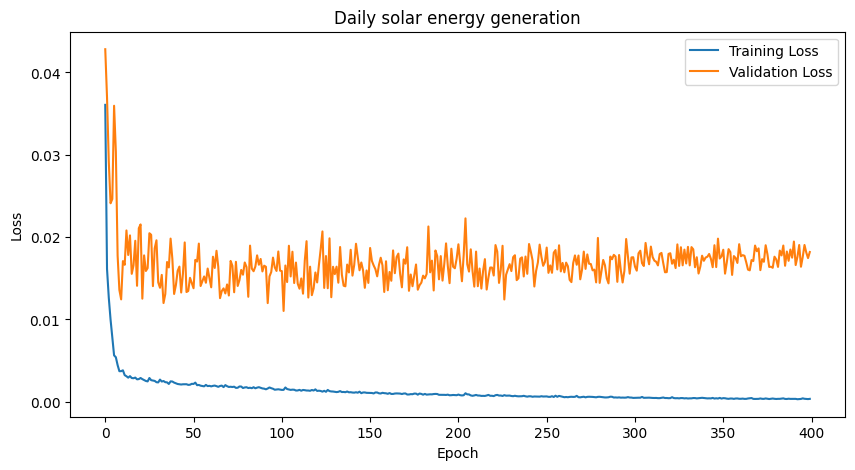

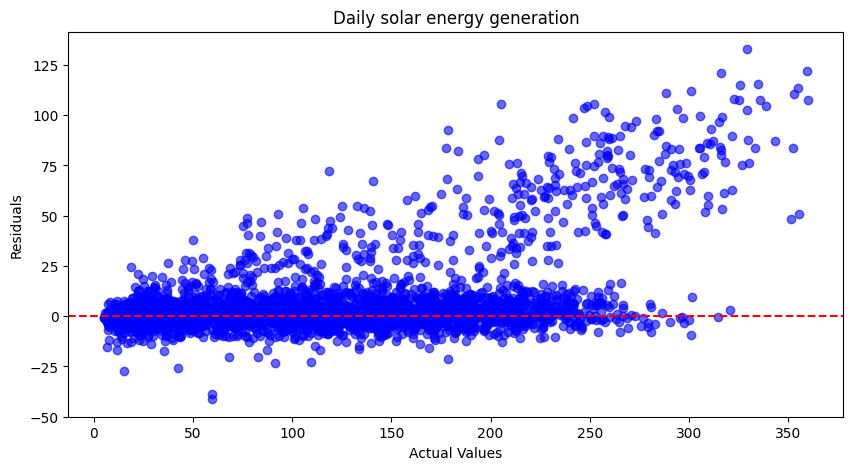

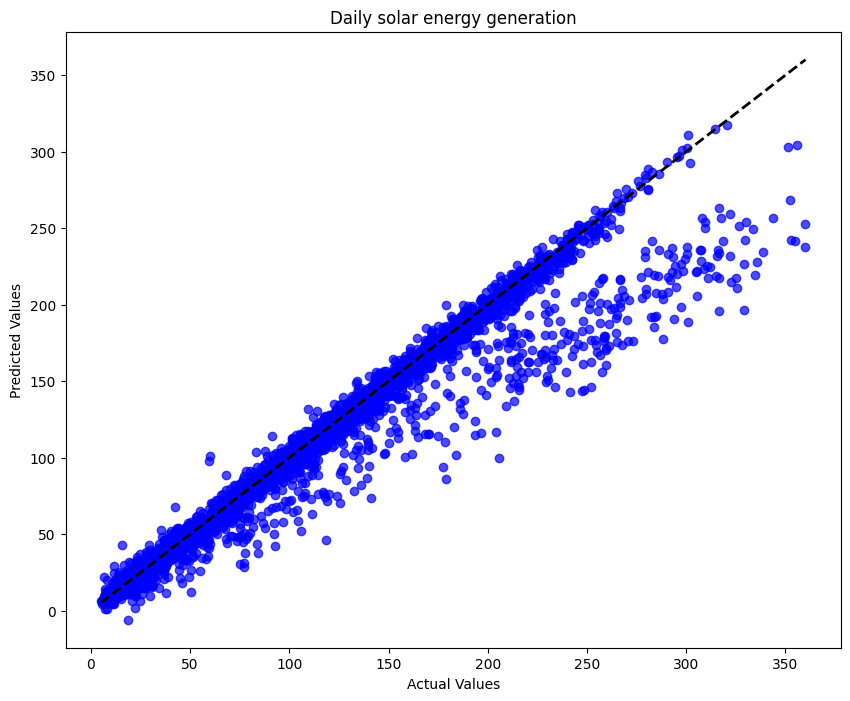

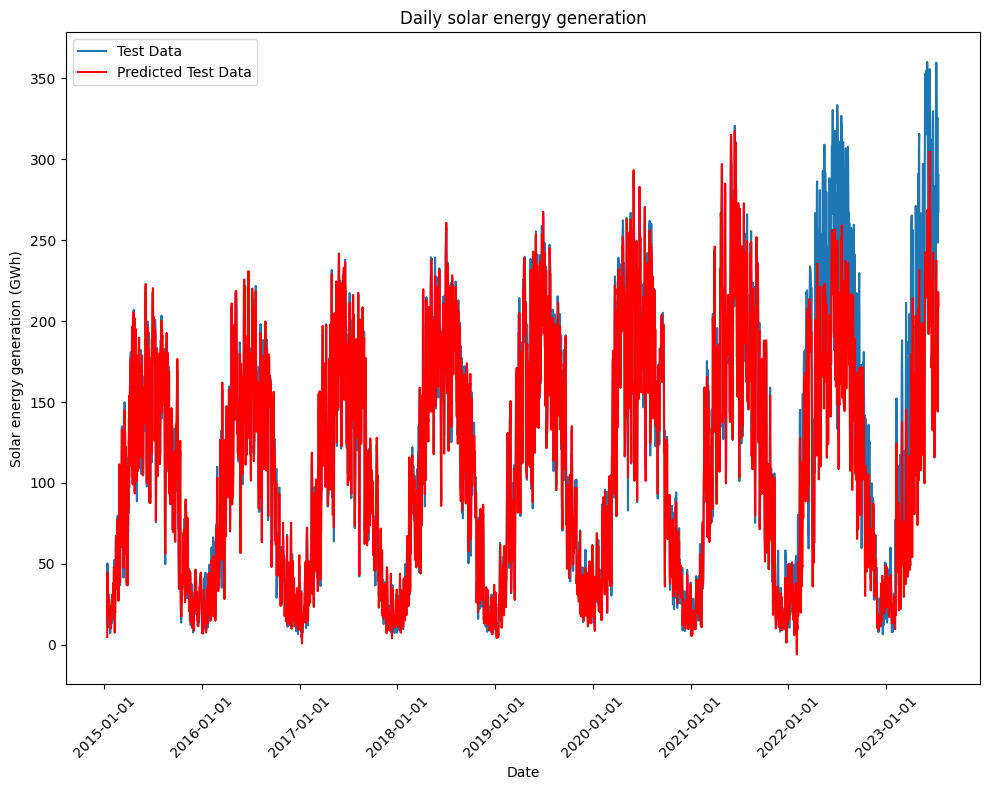

In [171]:


#data = data_df.copy()
#target = 'Total_energy_generation_gwh'
features=  ['Sunshine_hour_mean_de', 'Average_wind_speed_mpers_mean_de', 'Precipitation_mm_mean_de', 'Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de']
#features= ['Sunshine_hour_mu']
target = 'Solar_gwh'
lookback = 12
#features =  []
results = lstm_mlvt_model_daily(target, data_mlvt_daily, features, lookback)

data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 9) (3119, 4) (3107, 12, 3) (3107,) 3119
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (3107, 12, 3) (3107, 12, 3) (3107,) (3107,)
Epoch 1/400


/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/3671742930.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


50/50 [==============================] - 2s 10ms/step - loss: 0.0354 - val_loss: 0.0358
Epoch 2/400
50/50 [==============================] - 0s 6ms/step - loss: 0.0144 - val_loss: 0.0321
Epoch 3/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0115 - val_loss: 0.0328
Epoch 4/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0091 - val_loss: 0.0246
Epoch 5/400
50/50 [==============================] - 0s 9ms/step - loss: 0.0064 - val_loss: 0.0196
Epoch 6/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0054 - val_loss: 0.0213
Epoch 7/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0046 - val_loss: 0.0173
Epoch 8/400
50/50 [==============================] - 0s 6ms/step - loss: 0.0042 - val_loss: 0.0237
Epoch 9/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0041 - val_loss: 0.0123
Epoch 10/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0043 - val_loss: 0.0211
Epoch 11/400
50/50 [

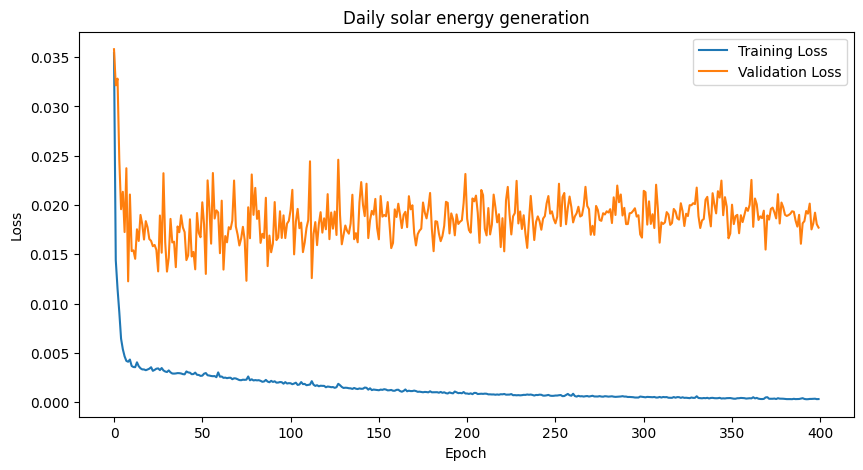

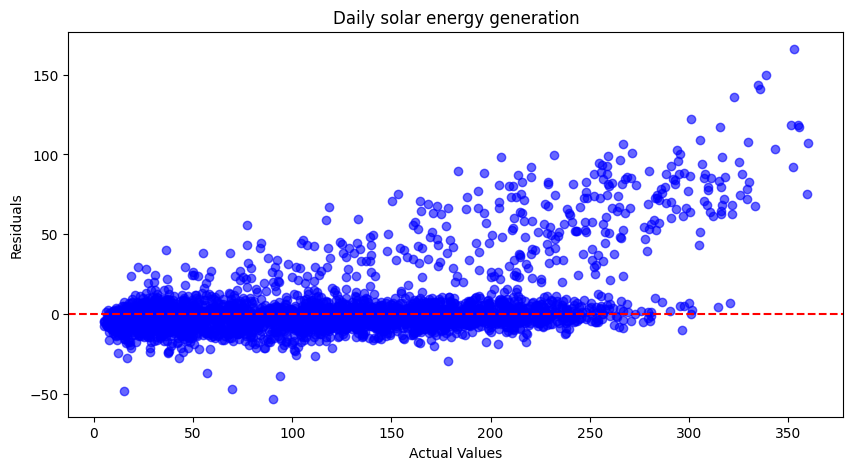

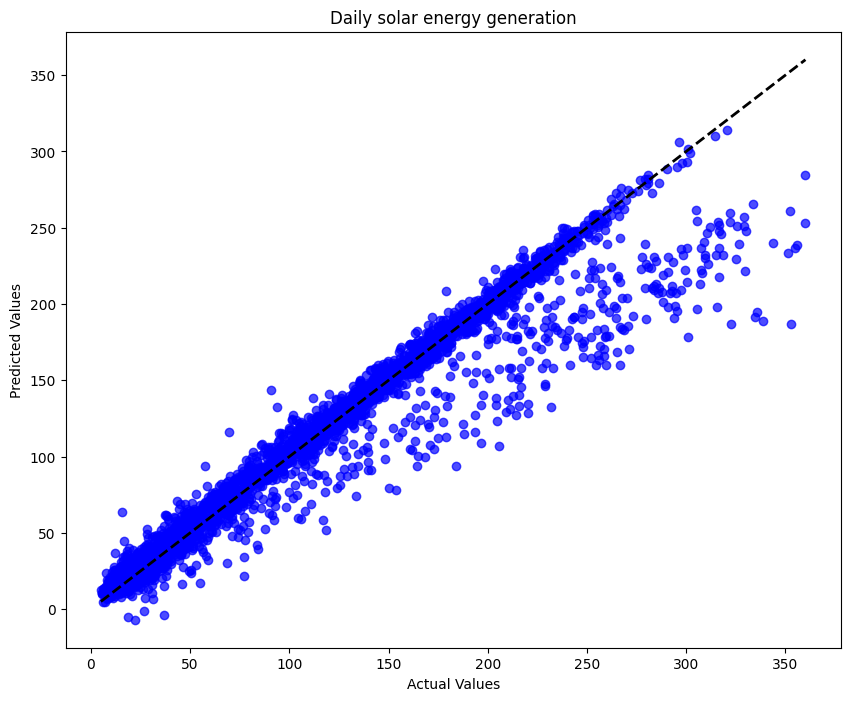

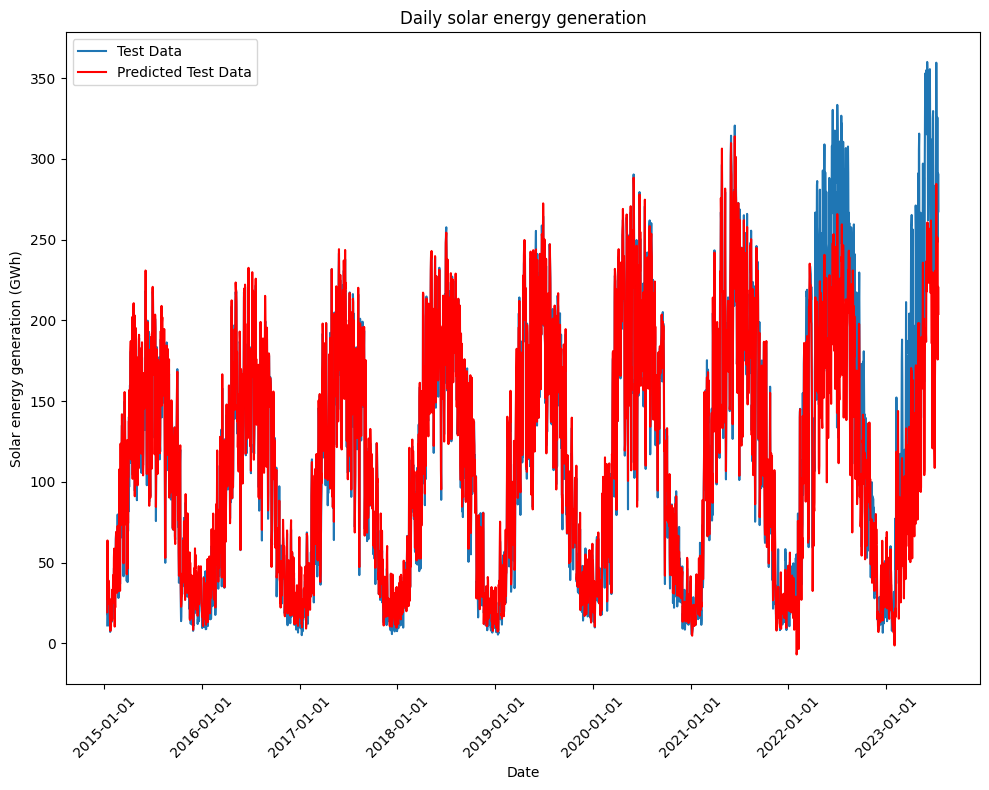

In [172]:
#target = 'Total_energy_generation_gwh'
features=  features=  ['Sunshine_hour_mean_de', 'Average_wind_speed_mpers_mean_de', 'Precipitation_mm_mean_de']
#features= ['Sunshine_hour_mu']
target = 'Solar_gwh'
lookback = 12
#features =  []
results = lstm_mlvt_model_daily(target, data_mlvt_daily, features, lookback)

/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_10187/3671742930.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 9) (3119, 2) (3107, 12, 1) (3107,) 3119
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (3107, 12, 1) (3107, 12, 1) (3107,) (3107,)
Epoch 1/400
50/50 [==============================] - 4s 27ms/step - loss: 0.0551 - val_loss: 0.0507
Epoch 2/400
50/50 [==============================] - 1s 11ms/step - loss: 0.0204 - val_loss: 0.0421
Epoch 3/400
50/50 [==============================] - 1s 11ms/step - loss: 0.0184 - val_loss: 0.0429
Epoch 4/400
50/50 [==============================] - 0s 10ms/step - loss: 0.0167 - val_loss: 0.0359
Epoch 5/400
50/50 [==============================] - 0s 9ms/step - loss: 0.0147 - val_loss: 0.0309
Epoch 6/400
50/50 [==============================] - 0s 9ms/step - loss: 0.0120 - val_loss: 0.0407
Epoch 7/400
50/50 [==============================] - 0s 9ms/step - loss: 0.0111 - val_loss: 0.0284
Epoch 8/400
50/50 [==============================] - 0s 9m

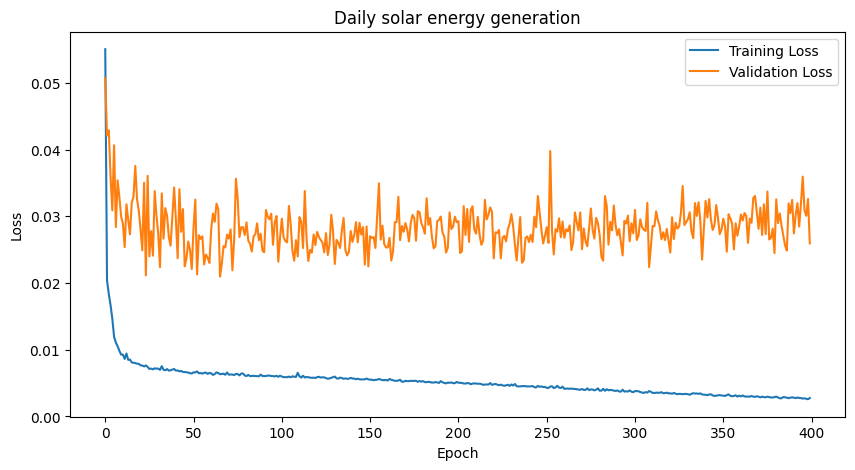

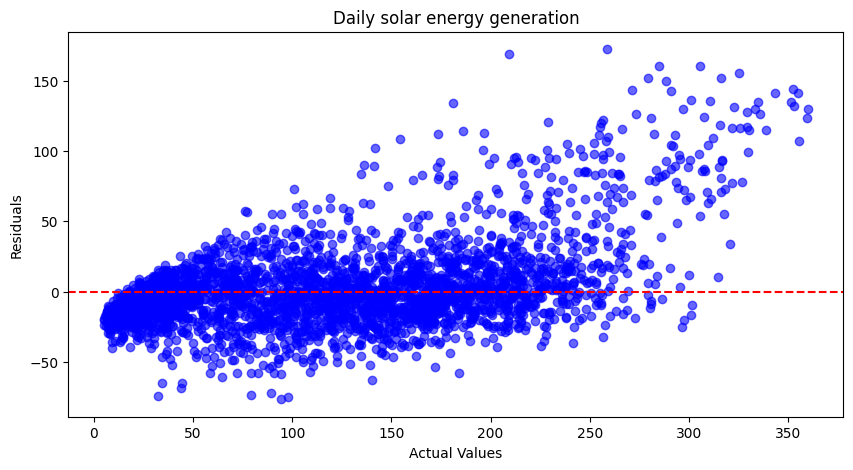

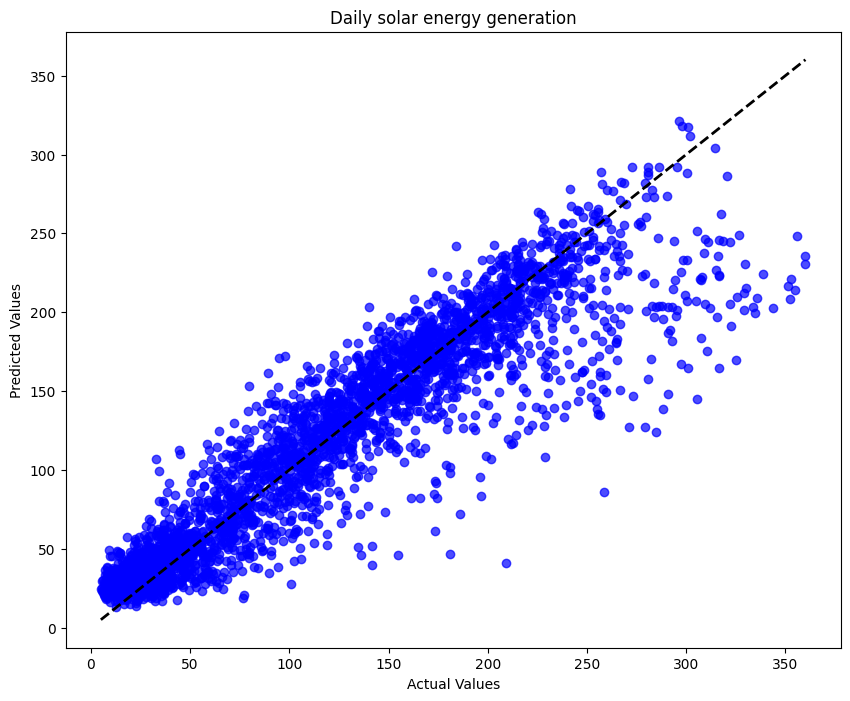

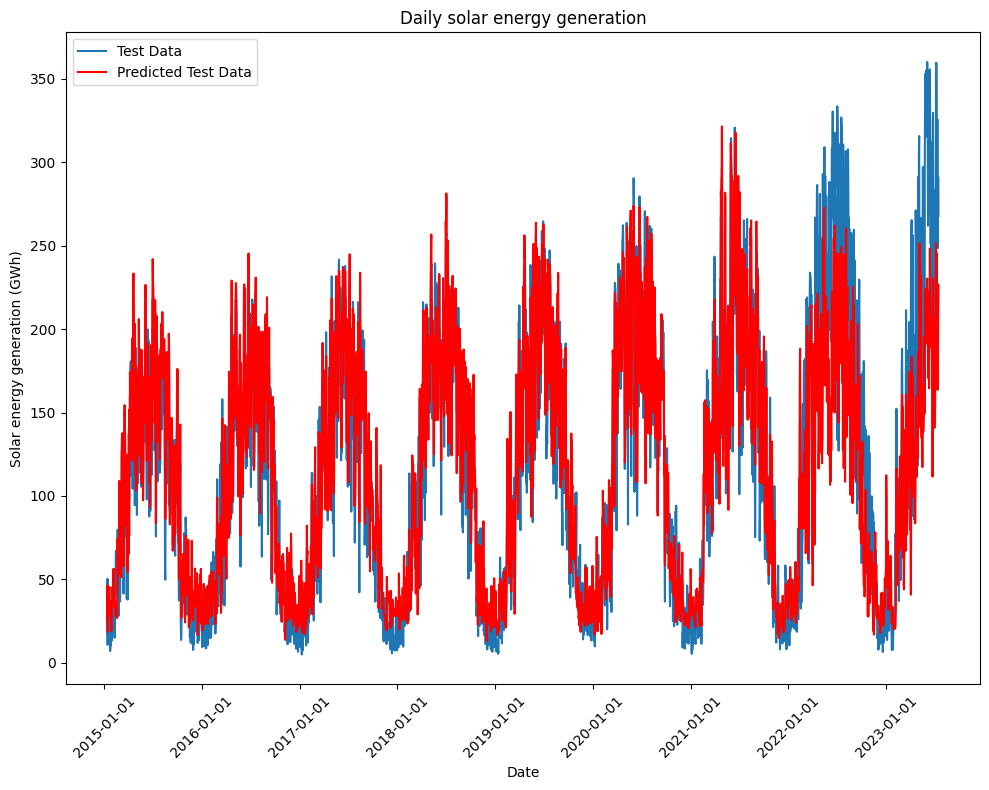

In [187]:
#target = 'Total_energy_generation_gwh'
#features=  ['Sunshine_hour_mean_de', 'Average_wind_speed_mpers_mean_de', 'Precipitation_mm_mean_de', 'Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de']

features=  ['Sunshine_hour_mean_de']
#features= ['Sunshine_hour_mean_de']
target = 'Solar_gwh'
lookback = 12
#features =  []
results = lstm_mlvt_model_daily(target, data_mlvt_daily, features, lookback)

In [ ]:
#'Sunshine_hour_mean_de', 'Average_wind_speed_mpers_mean_de', 'Precipitation_mm_mean_de', 'Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de'

In [174]:


columns_mlvt_daily=  ['Date','Sunshine_hour_mean_de', 'Average_wind_speed_mpers_mean_de', 'Precipitation_mm_mean_de', 'Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de', 'Solar_gwh']
#columns_mlvt_daily= ['Date', 'Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de'] #
#target = 'Total_energy_generation_gwh'
data_mlvt_daily = daily_weather_df[columns_mlvt_daily].copy()
data_mlvt_daily.head()

,Date,Sunshine_hour_mean_de,Average_wind_speed_mpers_mean_de,Precipitation_mm_mean_de,Average_temp_c_mean_de,Norm_temp_c_mean_de,Max_temp_c_mean_de,Min_temp_c_mean_de,Solar_gwh
0,2015-01-01,3.22,2.88,1.37,0.29,1.30,3.01,-2.42,17.08025
1,2015-01-02,0.61,5.36,4.59,2.94,1.27,6.15,-0.80,7.75900
2,2015-01-03,0.01,4.39,8.43,2.92,1.21,5.12,1.22,7.23475
3,2015-01-04,2.15,4.29,0.19,2.52,1.36,4.69,0.82,19.98250
4,2015-01-05,2.49,3.22,0.15,1.48,1.15,3.75,-0.56,26.52225


data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 9) (3119, 5) (3107, 12, 4) (3107,) 3119
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (3107, 12, 4) (3107, 12, 4) (3107,) (3107,)
Epoch 1/400


/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/3671742930.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


50/50 [==============================] - 2s 12ms/step - loss: 0.0376 - val_loss: 0.0547
Epoch 2/400
50/50 [==============================] - 0s 6ms/step - loss: 0.0197 - val_loss: 0.0533
Epoch 3/400
50/50 [==============================] - 0s 8ms/step - loss: 0.0170 - val_loss: 0.0383
Epoch 4/400
50/50 [==============================] - 0s 8ms/step - loss: 0.0153 - val_loss: 0.0321
Epoch 5/400
50/50 [==============================] - 0s 8ms/step - loss: 0.0144 - val_loss: 0.0467
Epoch 6/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0141 - val_loss: 0.0497
Epoch 7/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0137 - val_loss: 0.0341
Epoch 8/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0132 - val_loss: 0.0471
Epoch 9/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0132 - val_loss: 0.0360
Epoch 10/400
50/50 [==============================] - 0s 7ms/step - loss: 0.0132 - val_loss: 0.0567
Epoch 11/400
50/50 [

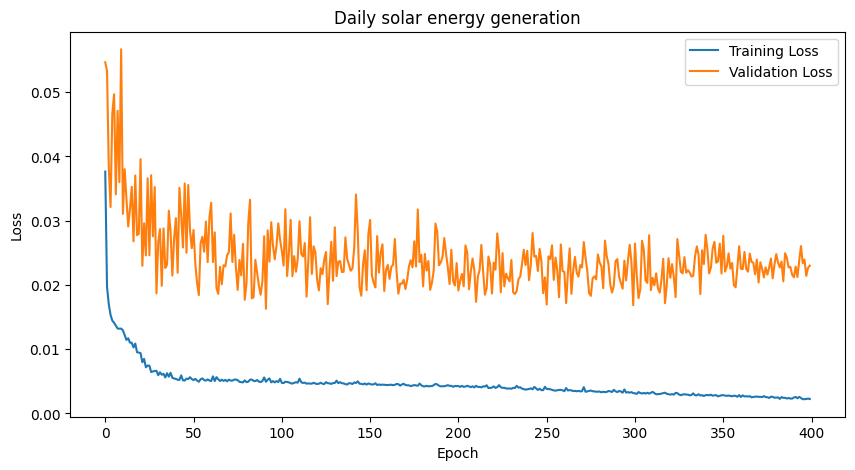

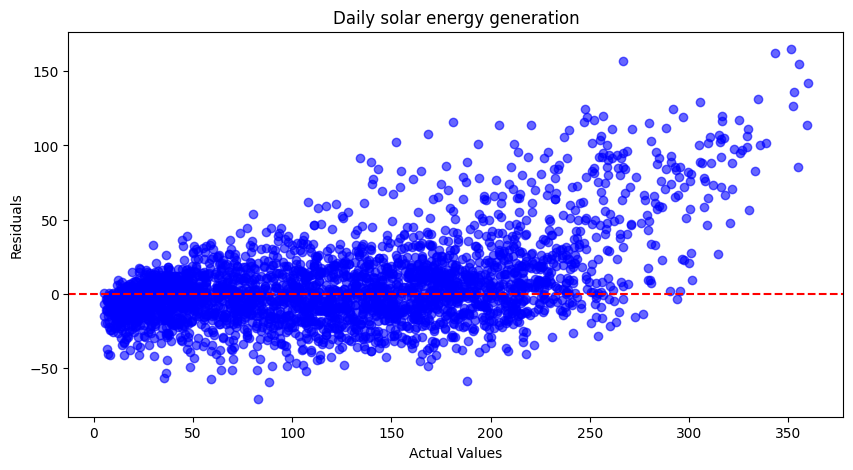

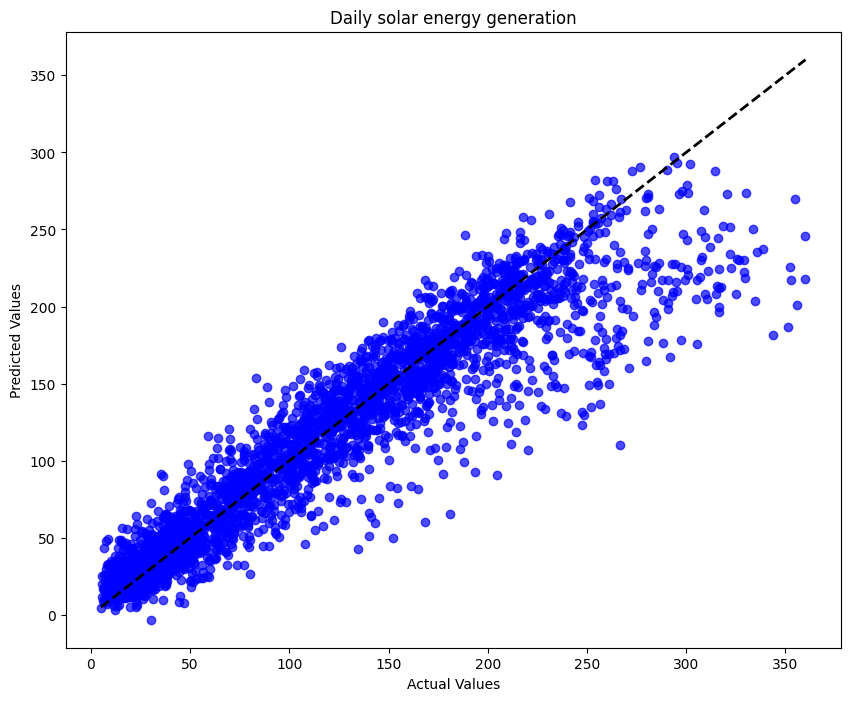

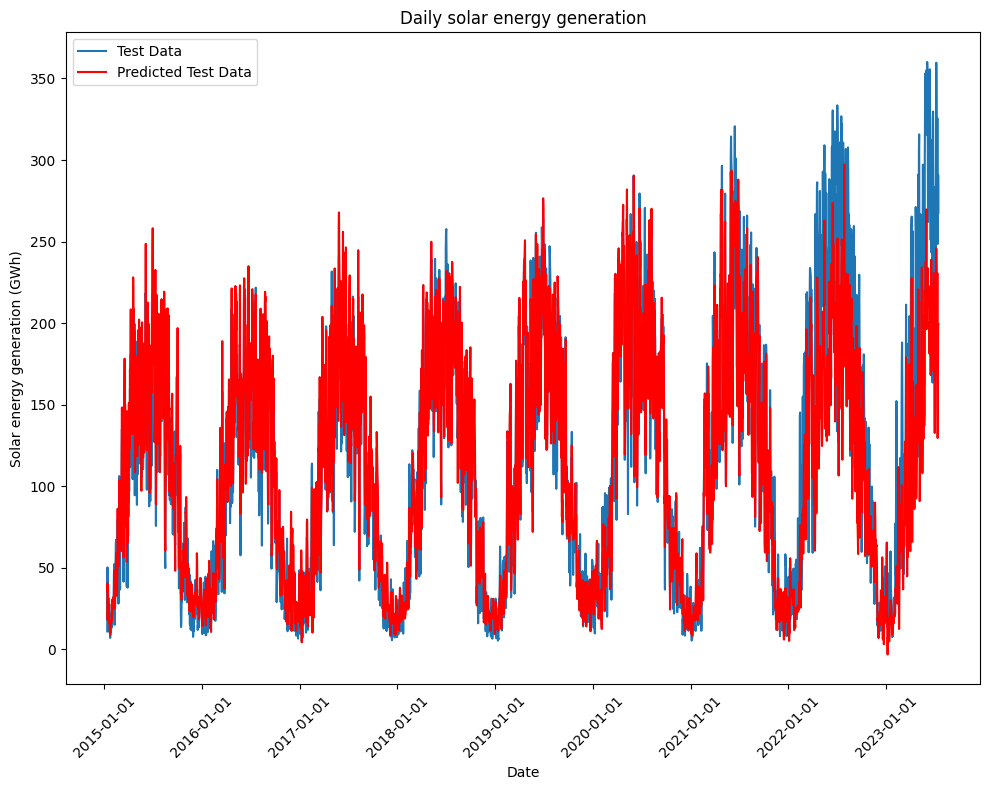

In [175]:
#target = 'Total_energy_generation_gwh'
features=  ['Average_temp_c_mean_de', 'Norm_temp_c_mean_de', 'Max_temp_c_mean_de', 'Min_temp_c_mean_de']
#features= ['Sunshine_hour_mu']
target = 'Solar_gwh'
lookback = 12
#features =  []
results = lstm_mlvt_model_daily(target, data_mlvt_daily, features, lookback)

data_mlvt_shape, data_scaled_shape, X_lstm_shape, y_lstm_shape, X_lstm_shape[0]+X_lstm_shape[1]= (3119, 9) (3119, 5) (3089, 30, 4) (3089,) 3119
X_lstm_shape, X_lstm_shape, y_lstm_shape, y_lstm_shape = (3089, 30, 4) (3089, 30, 4) (3089,) (3089,)
Epoch 1/400


/var/folders/75/2hrhpj_x0q94k87nqmpdwckm0000gn/T/ipykernel_16391/3671742930.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs['Date'] = pd.to_datetime(dfs['Date'])


50/50 [==============================] - 2s 19ms/step - loss: 0.0328 - val_loss: 0.0335
Epoch 2/400
50/50 [==============================] - 1s 14ms/step - loss: 0.0147 - val_loss: 0.0292
Epoch 3/400
50/50 [==============================] - 1s 15ms/step - loss: 0.0124 - val_loss: 0.0322
Epoch 4/400
50/50 [==============================] - 1s 15ms/step - loss: 0.0107 - val_loss: 0.0229
Epoch 5/400
50/50 [==============================] - 1s 14ms/step - loss: 0.0102 - val_loss: 0.0339
Epoch 6/400
50/50 [==============================] - 1s 14ms/step - loss: 0.0107 - val_loss: 0.0272
Epoch 7/400
50/50 [==============================] - 1s 15ms/step - loss: 0.0081 - val_loss: 0.0282
Epoch 8/400
50/50 [==============================] - 1s 16ms/step - loss: 0.0061 - val_loss: 0.0249
Epoch 9/400
50/50 [==============================] - 1s 17ms/step - loss: 0.0052 - val_loss: 0.0234
Epoch 10/400
50/50 [==============================] - 1s 16ms/step - loss: 0.0044 - val_loss: 0.0174
Epoch 11/40

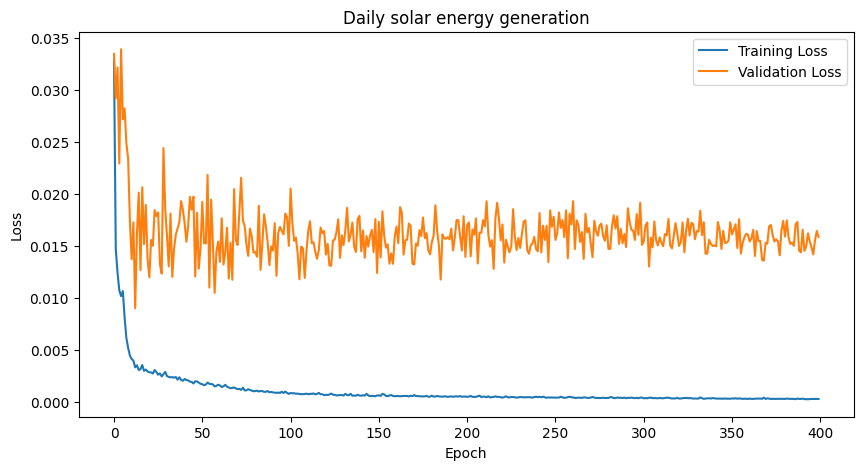

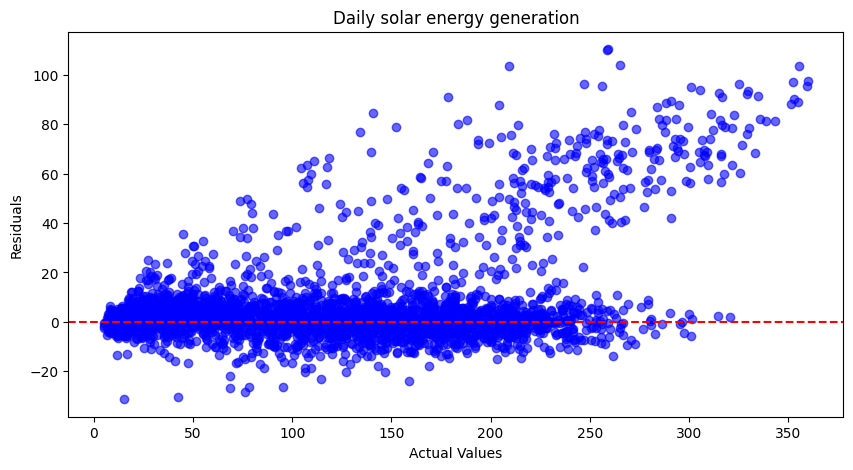

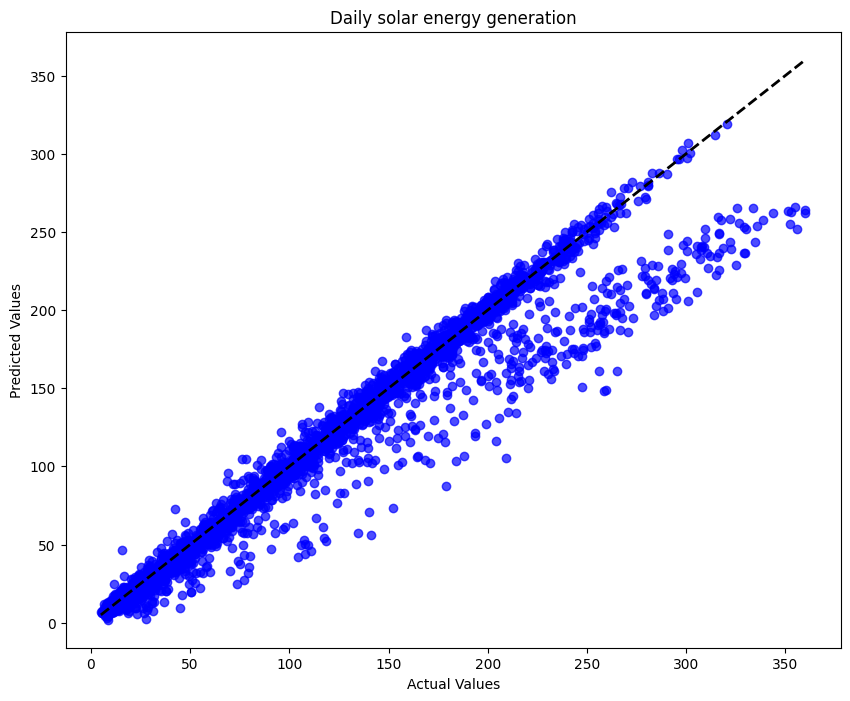

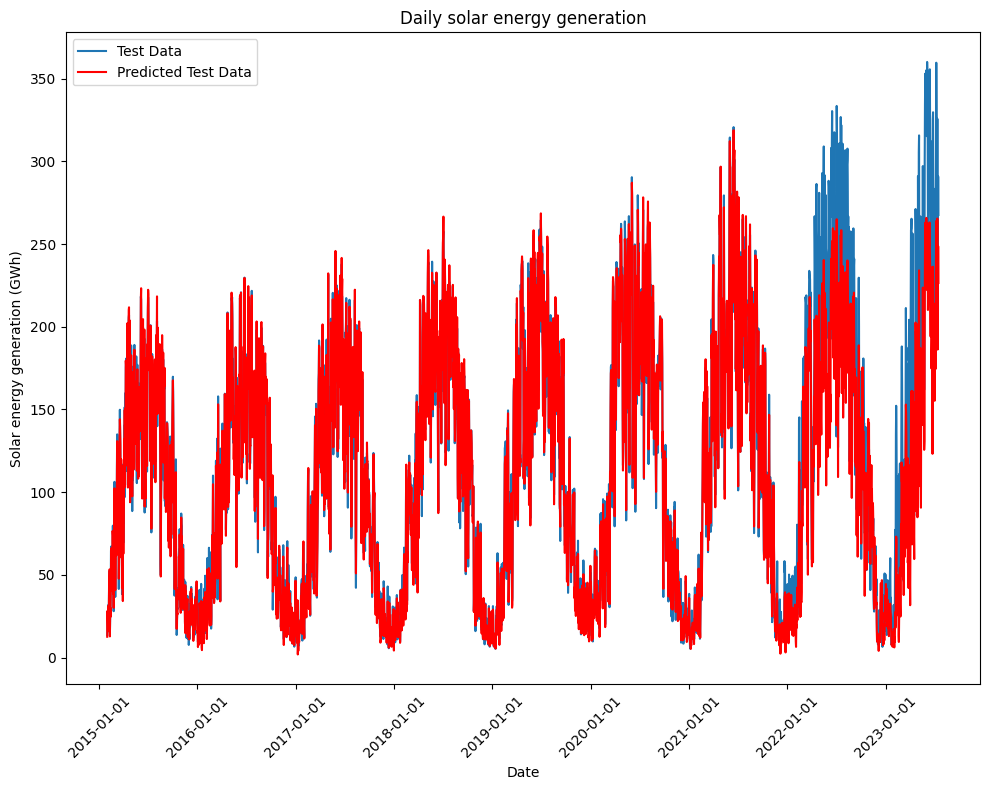

In [177]:
#target = 'Total_energy_generation_gwh'
features=  ['Sunshine_hour_mean_de', 'Average_wind_speed_mpers_mean_de', 'Precipitation_mm_mean_de', 'Average_temp_c_mean_de']
#features= ['Sunshine_hour_mu']
target = 'Solar_gwh'
lookback = 30
#features =  []
results = lstm_mlvt_model_daily(target, data_mlvt_daily, features, lookback)

#### Import df_m_all (Montly data )

In [124]:
df_m_all= pd.read_csv('data/prophet_data/df_m_all.csv')
#df_m_all.head(2)

In [125]:
df_m_all.columns

Index(['dt_date_hour', 'biomass_mwh', 'fossil_brown_coal_mwh',
       'fossil_coal_derived_gas_mwh', 'fossil_gas_mwh', 'fossil_hard_coal_mwh',
       'fossil_oil_mwh', 'fossil_oil_shale_mwh', 'fossil_peat_mwh',
       'geothermal_mwh', 'hydro_pumped_storage_aggregated_mwh',
       'hydro_pumped_storage_consumption_mwh',
       'hydro_run_of_river_and_poundage_mwh', 'hydro_water_reservoir_mwh',
       'marine_mwh', 'nuclear_mwh', 'other_mwh', 'other_renewable_mwh',
       'solar_mwh', 'waste_mwh', 'wind_offshore_mwh', 'wind_onshore_mwh',
       'total_energy_generation_mwh', 'solar_gwh',
       'total_energy_generation_gwh', 'dt_year', 'dt_month', 'dt_monthname',
       'dt_date', 'solar_twh', 'biomass_gw', 'wind_offshore_gw',
       'wind_onshore_gw', 'solar_gw', 'spot_market_price_eur_per_mwh',
       'day_ahead_auction_volume_weighted_eur_per_mwh',
       'intraday_continuous_volume_weighted_eur_per_mwh',
       'intraday_continuous_30min_volume_weighted_eur_per_mwh',
       'intrada

In [126]:
##  Capitalize the columns names
df_m_all.columns = [col.capitalize() for col in df_m_all.columns]
df_m_all.rename(columns = {'dt_date': 'Date'}, inplace = True)  
df_m_all.head()
# Print the dataframe
df_m_all.head()

,Dt_date_hour,Biomass_mwh,Fossil_brown_coal_mwh,Fossil_coal_derived_gas_mwh,Fossil_gas_mwh,Fossil_hard_coal_mwh,Fossil_oil_mwh,Fossil_oil_shale_mwh,Fossil_peat_mwh,Geothermal_mwh,...,Day_ahead_auction_volume_weighted_eur_per_mwh,Intraday_continuous_volume_weighted_eur_per_mwh,Intraday_continuous_30min_volume_weighted_eur_per_mwh,Intraday_continuous_15min_volume_weighted_eur_per_mwh,Intraday_auction_15_minutes_call_eur_per_mwh,Co2_emission_allowances_auction_eur_per_tco2,Gas_ncg_eur_per_tco2,Mean_air_temperature_de_c,Mean_sunshine_duration_de_minute,Mean_precipitation_de_mm
0,2015-01-31 00:00:00+01:00,2963450.25,11800178.50,0.0,1405692.50,6387684.50,130717.25,0.0,0.0,9665.00,...,30.46,31.54,NaN,31.50,28.85,6.80,NaN,2.19,35.3,85.4
1,2015-02-28 00:00:00+01:00,2692398.25,11249758.00,0.0,1615355.25,7886900.00,145943.00,0.0,0.0,9820.75,...,36.66,37.91,NaN,37.12,36.84,7.13,NaN,0.72,88.0,22.3
2,2015-03-31 00:00:00+01:00,2935810.25,12187410.00,25511.0,1361677.50,7322739.75,152918.25,0.0,0.0,7920.75,...,30.67,33.00,NaN,32.97,31.26,6.67,NaN,5.18,139.1,55.5
3,2015-04-30 00:00:00+01:00,2845630.00,10203658.25,0.0,849546.00,5998567.50,145577.25,0.0,0.0,9943.00,...,29.04,28.64,NaN,29.27,29.51,6.98,NaN,8.42,224.5,41.4
4,2015-05-31 00:00:00+01:00,2918058.50,8934112.50,0.0,866311.50,4289877.75,143307.25,0.0,0.0,12335.00,...,25.32,26.34,NaN,25.38,24.85,7.34,NaN,12.34,187.0,51.7


In [128]:
df_m_all.columns, df_m_all.shape

(Index(['Dt_date_hour', 'Biomass_mwh', 'Fossil_brown_coal_mwh',
        'Fossil_coal_derived_gas_mwh', 'Fossil_gas_mwh', 'Fossil_hard_coal_mwh',
        'Fossil_oil_mwh', 'Fossil_oil_shale_mwh', 'Fossil_peat_mwh',
        'Geothermal_mwh', 'Hydro_pumped_storage_aggregated_mwh',
        'Hydro_pumped_storage_consumption_mwh',
        'Hydro_run_of_river_and_poundage_mwh', 'Hydro_water_reservoir_mwh',
        'Marine_mwh', 'Nuclear_mwh', 'Other_mwh', 'Other_renewable_mwh',
        'Solar_mwh', 'Waste_mwh', 'Wind_offshore_mwh', 'Wind_onshore_mwh',
        'Total_energy_generation_mwh', 'Solar_gwh',
        'Total_energy_generation_gwh', 'Dt_year', 'Dt_month', 'Dt_monthname',
        'Dt_date', 'Solar_twh', 'Biomass_gw', 'Wind_offshore_gw',
        'Wind_onshore_gw', 'Solar_gw', 'Spot_market_price_eur_per_mwh',
        'Day_ahead_auction_volume_weighted_eur_per_mwh',
        'Intraday_continuous_volume_weighted_eur_per_mwh',
        'Intraday_continuous_30min_volume_weighted_eur_per_mwh',


In [ ]:
df_m_all.columns.shape